# Vehicle Sales Price Prediction - Regression Project

In the following regression project, a dataset of more than 400,000 car adverts posted on AutoTrader's website has been processed and modeled, utilizing various regression models to predict vehicle sale prices. This projects includes the following sections:

* Data understanding and exploration
* Feature engineering, deriving informative features, subsetting, and analysis of associations
* Data processing and imputing
* Target encoding and modelling
* Hyperparameter tuning
* Coarse-grained and fine-grained evaluation
* Feature importance

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(
    { "figure.figsize": (6, 4) },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)
%config InlineBackend.figure_format = 'retina'
import warnings
warnings.filterwarnings('ignore')

In [2]:
import sys
!pip install -q dtreeviz
import dtreeviz

In [3]:
from sklearn.preprocessing import TargetEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_text
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV, ParameterGrid
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import PredictionErrorDisplay

# 1. Data understanding and exploration

## 1.1. Meaning and type of features

In [4]:
df = pd.read_csv('data/autotrader/adverts.csv')

In [5]:
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


In [249]:
df.public_reference.nunique()

402005

### Meaning and Type of Features (what the features convey/measure)
There are 12 features in the dataset:
- public_reference: the unique code given to each advert
- mileage: number of miles each vehicle travelled
- reg_code: a part of number plate indicating year of registration
- standard_colour: the color of the car
- standard_make: manufacturer of the car
- standard_model: the model of each car
- vehicle_condition: indicates whether the vehicle is new or used
- year_of_registration: the year the vehicle was registered
- price: vehicle selling price 
- body_type: the body type of a particular car
- crossover_car_and_van: indicates whether the car is crossover or not
- fuel_type: the fuel type that the car operates on

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [7]:
df.isnull().sum()

public_reference             0
mileage                    127
reg_code                 31857
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33311
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [44]:
df.drop(columns=['public_reference','crossover_car_and_van']).agg(['size','count','nunique', lambda x: x.isnull().sum()])

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,fuel_type
size,402005,402005,402005,402005,402005,402005,402005,402005,402005,402005
count,401878,370148,396627,402005,402005,402005,368694,402005,401168,401404
nunique,80634,72,22,110,1168,2,84,30578,16,9
<lambda>,127,31857,5378,0,0,0,33311,0,837,601


* size: Counts total values including null values
* count: Counts only non-null values
* nunique: Counts distinct non-null values
* lambda: Counts the number of null values

In [57]:
df[['mileage','year_of_registration','price']]\
    .describe().round()

,mileage,year_of_registration,price
count,401878.0,368694.0,402005.0
mean,37744.0,2015.0,17342.0
std,34832.0,8.0,46437.0
min,0.0,999.0,120.0
25%,10481.0,2013.0,7495.0
50%,28630.0,2016.0,12600.0
75%,56876.0,2018.0,20000.0
max,999999.0,2020.0,9999999.0


In [467]:
# Check descriptive statistics of categorical features
df.describe(include='O')

,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,body_type,fuel_type
count,370148,396627,402005,402005,402005,401168,401404
unique,72,22,110,1168,2,16,9
top,17,Black,BMW,Golf,USED,Hatchback,Petrol
freq,36738,86287,37376,11583,370756,167315,216929


* count: Counts only non-null values
* unique: Count distinct non-null values
* top: the mode of the column (the most popular value)
* freq: number of repetitions of the most popular value

In [1081]:
# Show the number of unique entries and missing values (NaN) for each column  
variables = pd.DataFrame(columns=['Variable','Number of unique values','Number of nulls'])
variables

,Variable,Number of unique values,Number of nulls


In [1083]:
for i, var in enumerate(df.columns):
    variables.loc[i] = [var, df[var].nunique(), df[var].isnull().sum()]
variables

,Variable,Number of unique values,Number of nulls
0,public_reference,402005,0
1,mileage,80634,127
2,reg_code,72,31857
3,standard_colour,22,5378
4,standard_make,110,0
5,standard_model,1168,0
6,vehicle_condition,2,0
7,year_of_registration,84,33311
8,price,30578,0
9,body_type,16,837


In [1091]:
# Display unique values in any column using f-strings
for column in df.columns:
  n_unique = df[column].nunique()
  if n_unique <= 110:                 # number of unique standard_make is the largest manageble number of unique entries
    print(f'{column} ({n_unique}): {df[column].unique()}\n') # \n means go to the next line
  else:
    print(f'{column} ({n_unique})\n') # \n means go to the next line

public_reference (402005)

mileage (80634)

reg_code (72): [nan '61' '17' '16' '64' '13' '08' '19' '60' '69' '66' '12' '18' '65' '09'
 'B' '10' '14' '03' '67' '63' '15' '68' '56' '20' '70' '62' '11' '05' '59'
 '58' 'W' '02' '57' '06' '52' '53' '04' 'J' '07' '55' '51' 'X' 'D' 'S' 'Y'
 '54' 'H' 'K' 'E' 'L' 'V' 'M' 'G' 'T' 'N' 'P' 'A' 'F' 'R' 'C' '94' '85'
 'CA' 'm' 'FW' '723xuu' '95' 's' '38' 'k' '37' 'p']

standard_colour (22): ['Grey' 'Blue' 'Brown' 'Red' 'Bronze' 'Black' 'White' 'Silver' nan
 'Purple' 'Green' 'Orange' 'Yellow' 'Turquoise' 'Gold' 'Multicolour'
 'Beige' 'Burgundy' 'Pink' 'Maroon' 'Magenta' 'Navy' 'Indigo']

standard_make (110): ['Volvo' 'Jaguar' 'SKODA' 'Vauxhall' 'Land Rover' 'Audi' 'Mercedes-Benz'
 'Volkswagen' 'Peugeot' 'SEAT' 'MINI' 'BMW' 'Nissan' 'Mitsubishi'
 'Ferrari' 'Citroen' 'Toyota' 'Kia' 'Renault' 'Fiat' 'Honda' 'Bentley'
 'DS AUTOMOBILES' 'Hyundai' 'Aston Martin' 'McLaren' 'Smart' 'Alfa Romeo'
 'Porsche' 'Abarth' 'Mazda' 'Suzuki' 'MG' 'Dacia' 'Subaru' 'Ssan

## 1.2. Analysis of distributions

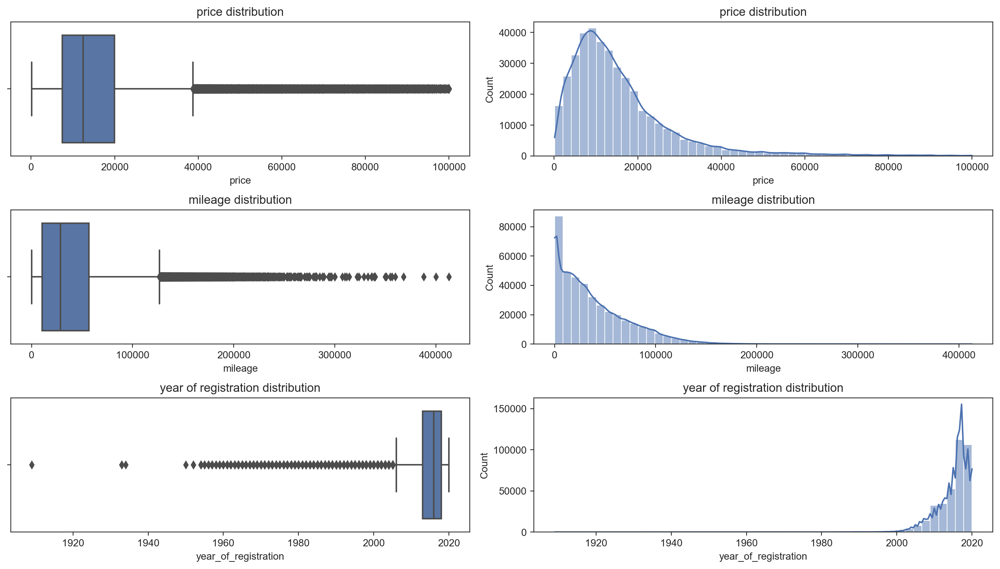

In [26]:
plt.figure(figsize = (14, 8))

plt.subplot(3,2,1)
sns.boxplot(data=df.loc[df.price<100000], x='price')
plt.title('price distribution')

plt.subplot(3,2,2)
sns.histplot(df.loc[df.price<100000], x='price', bins=50, kde=True)
plt.title('price distribution')

plt.subplot(3,2,3)
sns.boxplot(data=df.loc[df.mileage<0.5e6], x='mileage')
plt.title('mileage distribution')

plt.subplot(3,2,4)
sns.histplot(df.loc[df.mileage<0.5e6], x='mileage', bins=50, kde=True)
plt.title('mileage distribution')

plt.subplot(3,2,5)
sns.boxplot(data=df.loc[df.year_of_registration>1900], x='year_of_registration')
plt.title('year of registration distribution')

plt.subplot(3,2,6)
sns.histplot(df.loc[df.year_of_registration>1900], x='year_of_registration', bins=50, kde=True)
plt.title('year of registration distribution')

plt.tight_layout()
plt.show()

In [10]:
price_right_adjacent_value = (df.price.quantile(0.75) - df.price.quantile(0.25)) * 1.5 + df.price.quantile(0.75)
mileage_right_adjacent_value = (df.mileage.quantile(0.75) - df.mileage.quantile(0.25)) * 1.5 + df.mileage.quantile(0.75)
yor_left_adjacent_value = df.year_of_registration.quantile(0.25) - (df.year_of_registration.quantile(0.75) - df.year_of_registration.quantile(0.25)) * 1.5
print(round(price_right_adjacent_value))
print(round(mileage_right_adjacent_value))
print(round(yor_left_adjacent_value))

38758
126468
2006


# 2. Feature engineering, deriving informative features, subsetting, and analysis of associations and group differences

## 2.1 Analysis of standard make, color, body type, and fuel type

In [6]:
mile_reg = df.groupby('year_of_registration')[['mileage']].mean().sort_values('year_of_registration', ascending=False)
mile_reg = mile_reg.reset_index()
mile_reg.head()

,year_of_registration,mileage
0,2020.0,2851.272521
1,2019.0,9643.303946
2,2018.0,19432.927247
3,2017.0,28828.097783
4,2016.0,39396.434351


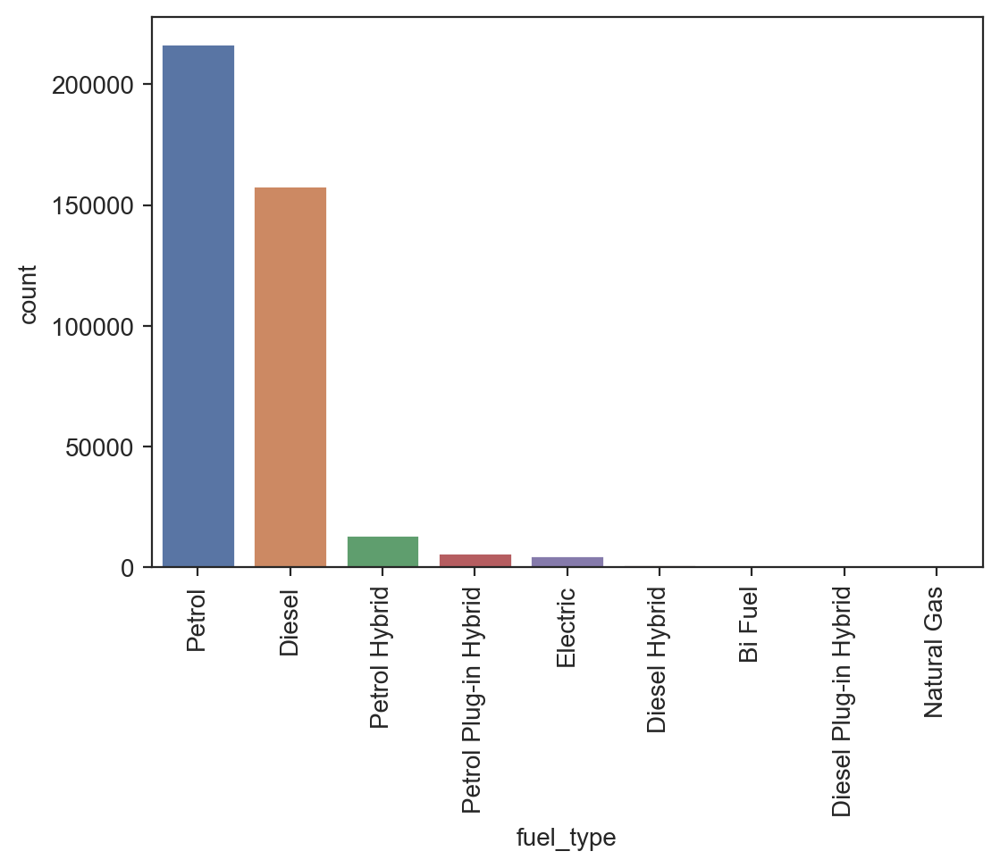

In [7]:
# fix, ax = plt.subplots(figsize=(10,4))
plot = sns.countplot(data=df, x='fuel_type', order=df.fuel_type.value_counts().index)
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

In [8]:
# aggregating 4 hybrid fuel types into one type for a better visualization
less_fuel_type_df = df.copy()
less_fuel_type_df['fuel_type'] = less_fuel_type_df.fuel_type.map({'Petrol Hybrid': 'Hybrid', 'Petrol Plug-in Hybrid': 'Hybrid', 
                                                   'Diesel Hybrid': 'Hybrid', 'Diesel Plug-in Hybrid': 'Hybrid', 
                                                   'Petrol': 'Petrol', 'Diesel': 'Diesel', 'Electric': 'Electric', 
                                                   'Bi Fuel': 'Bi Fuel', 'Natural Gas': 'Natural Gas'})

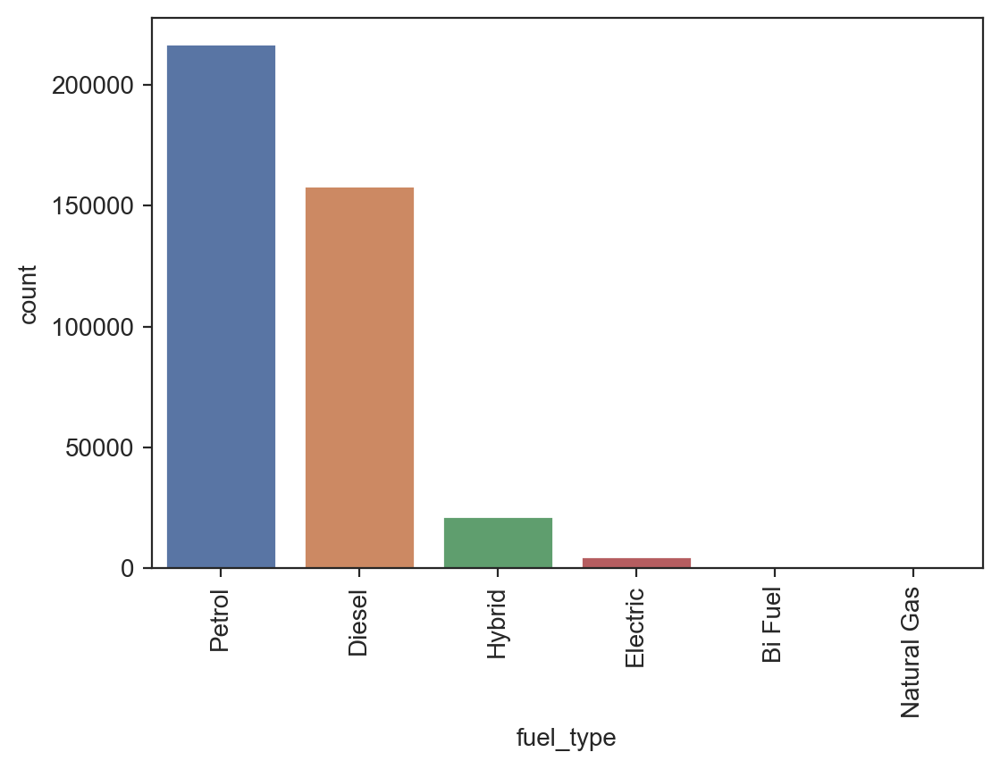

In [9]:
plot = sns.countplot(data=less_fuel_type_df, x='fuel_type', order=less_fuel_type_df.fuel_type.value_counts().index)
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

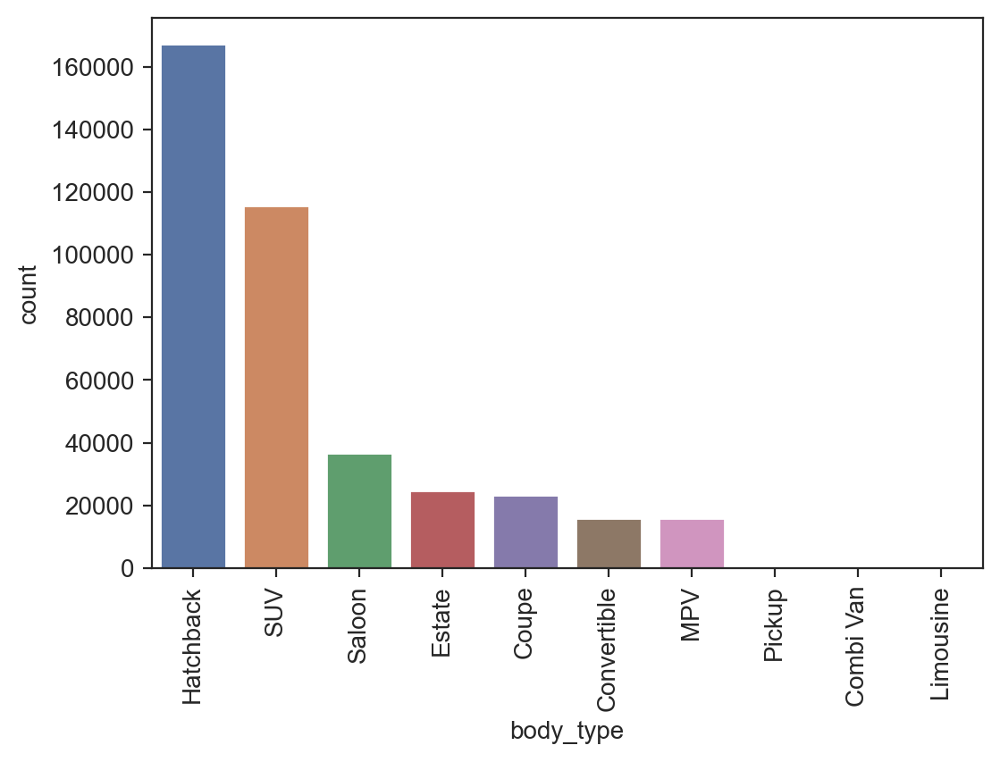

In [10]:
# fix, ax = plt.subplots(figsize=(10,4))
plot = sns.countplot(data=df, x='body_type', order=df.body_type.value_counts().index[:10])
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

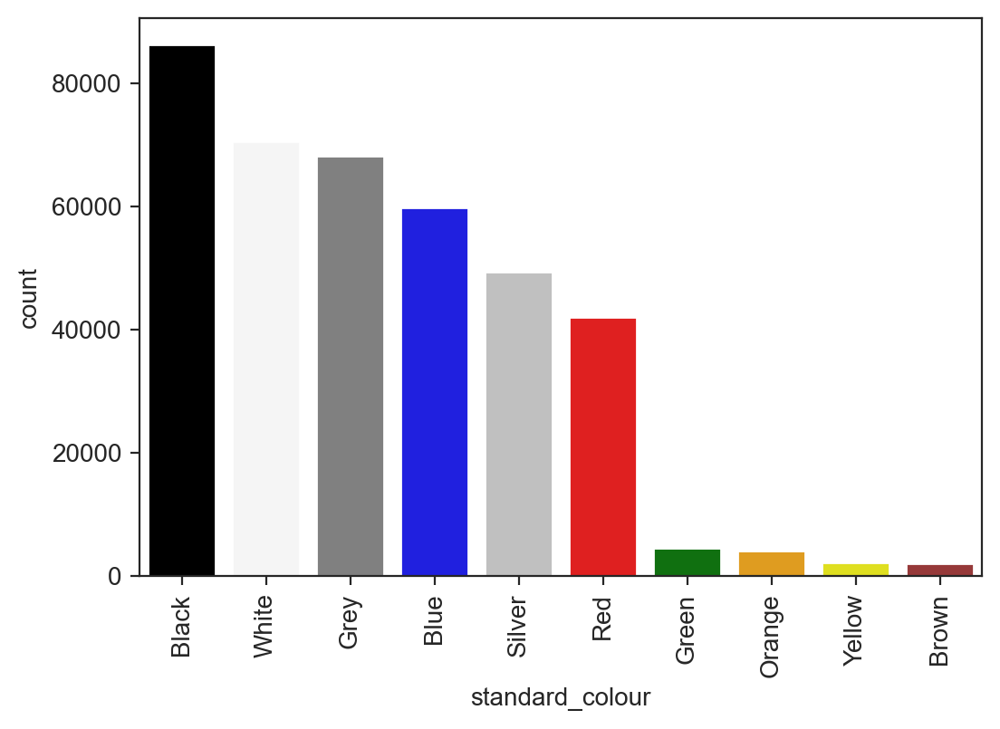

In [11]:
plot = sns.countplot(data=df, x='standard_colour', order=df.standard_colour.value_counts().index[:10],\
                     palette=['Black','Whitesmoke','Grey','Blue','Silver','Red','Green','Orange','Yellow','Brown'])
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

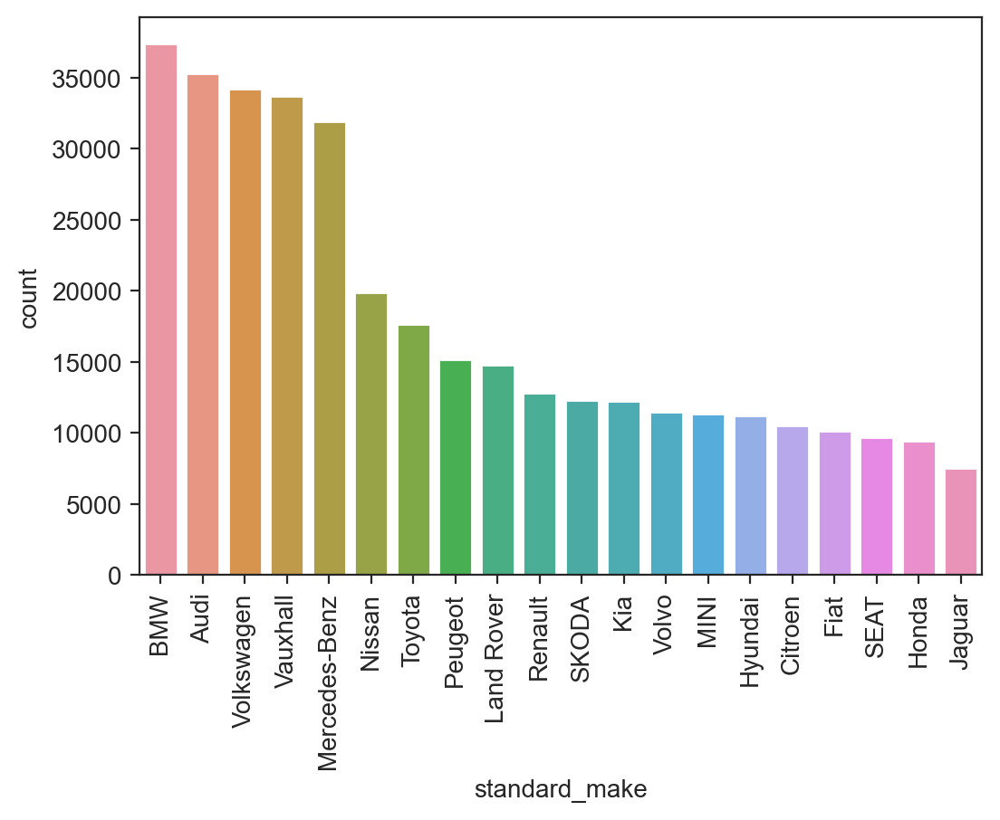

In [12]:
plot = sns.countplot(data=df, x='standard_make', order=df.standard_make.value_counts().index[:20])
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

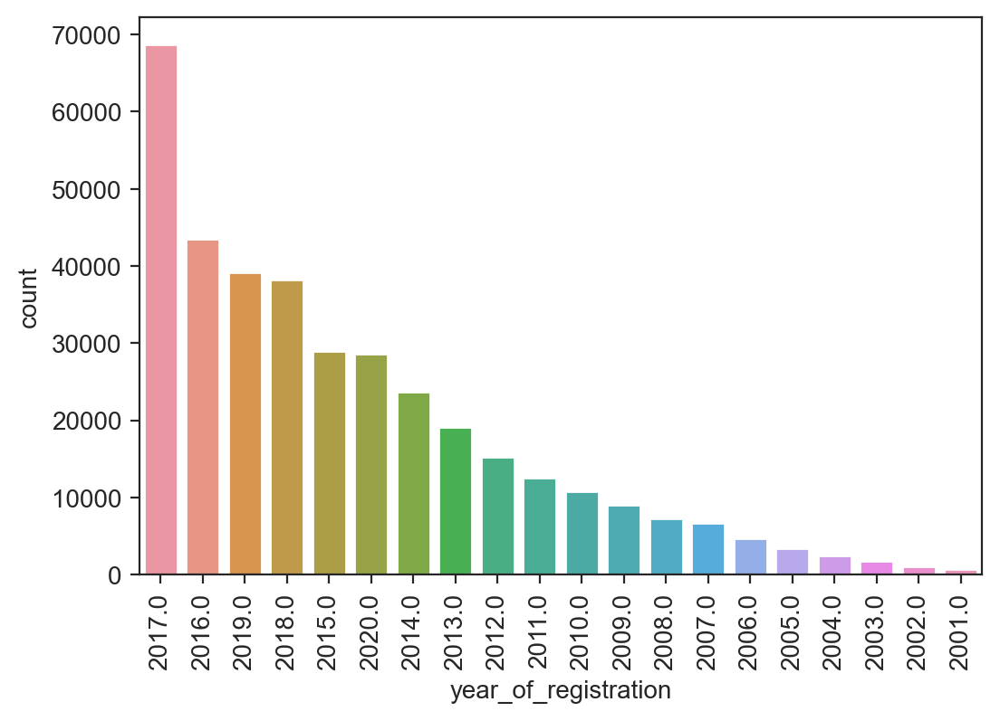

In [13]:
plot = sns.countplot(data=df, x='year_of_registration', order=df.year_of_registration.value_counts().index[:20])
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

* The above plot shows the count of top 20 YoRs.
* I used "order" argument to sort the bars based on YoR.
* The highest percentage of adverts is related to YoR 2017.
* After a sharp decrease, the most repeated YoRs are 2016, 2019, 2018, 2015, and 2020.
* There is a smooth decline in number of cars as YoR decreases.

## 2.2 Deep analysis of fuel type by more advanced plots

In [18]:
# aggregating 4 hybrid fuel types into one type for a better visualization
less_fuel_type_df = df.copy()
less_fuel_type_df['fuel_type'] = less_fuel_type_df.fuel_type.map({'Petrol Hybrid': 'Hybrid', 'Petrol Plug-in Hybrid': 'Hybrid', 
                                                   'Diesel Hybrid': 'Hybrid', 'Diesel Plug-in Hybrid': 'Hybrid', 
                                                   'Petrol': 'Petrol', 'Diesel': 'Diesel', 'Electric': 'Electric', 
                                                   'Bi Fuel': 'Bi Fuel', 'Natural Gas': 'Natural Gas'})

In [14]:
# only keeping the popular brands (more than 10000)
less_fuel_type_make_df = less_fuel_type_df.groupby('standard_make').filter(lambda x: len(x)>=10000)

In [15]:
# counting different fuel types in each popular brand
fuel_type_make_count = less_fuel_type_make_df.loc[~ less_fuel_type_make_df.fuel_type.isin(['Bi Fuel', 'Natural Gas'])] \
    .groupby(['standard_make', 'fuel_type']).size().unstack('fuel_type')

fuel_type_make_count

fuel_type,Diesel,Electric,Hybrid,Petrol
standard_make,,,,
Audi,17809.0,303.0,270.0,16876.0
BMW,22647.0,258.0,1933.0,12489.0
Citroen,4010.0,5.0,56.0,6428.0
Fiat,714.0,NaN,NaN,9411.0
Hyundai,3437.0,335.0,797.0,6640.0
Kia,5053.0,139.0,742.0,6283.0
Land Rover,13406.0,NaN,184.0,1179.0
MINI,2359.0,5.0,106.0,8867.0
Mercedes-Benz,20998.0,44.0,934.0,9887.0


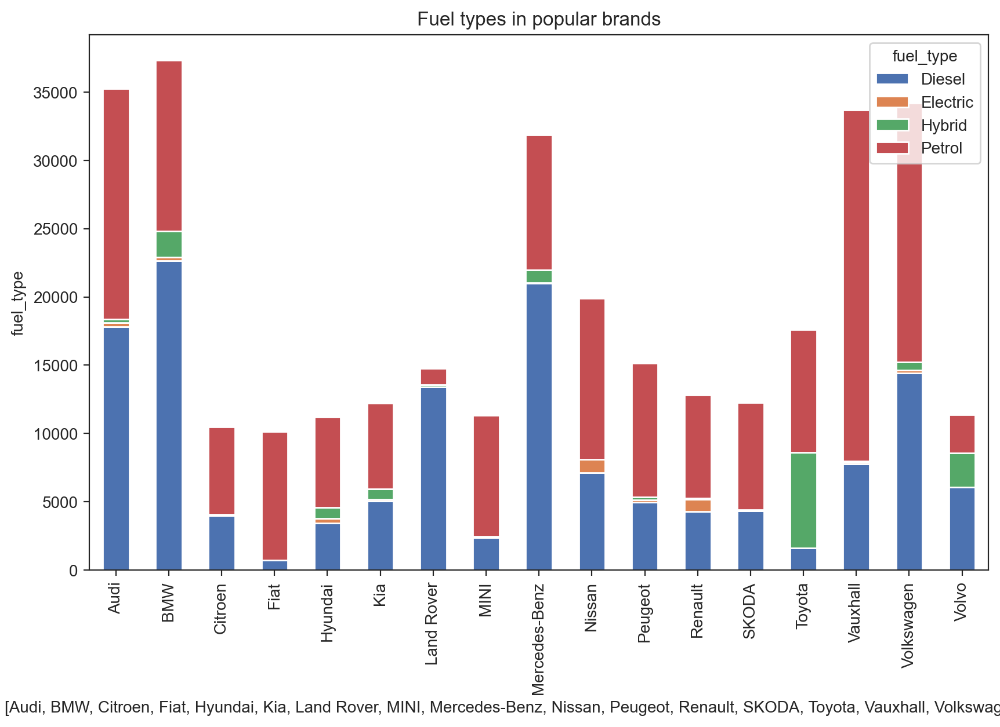

In [16]:
# plotting the above dataframe
plot = fuel_type_make_count.plot.bar(figsize=(10,6), xlabel=fuel_type_make_count.index, ylabel='fuel_type', 
                                     title='Fuel types in popular brands', stacked=True)
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

In popular brands petrol is the mostly used fuel type and diesel comes after. Hybrid has made its space in a few car manufacturers (like Toyota, Volvo, BMW, Mercedes-Benz, Hyundai and Kia) and obviously Toyota is the pioneer in Hybrid fuel type. In addition, we observe a slight proportion of electric cars in some other brands (like Nissan and Renault).

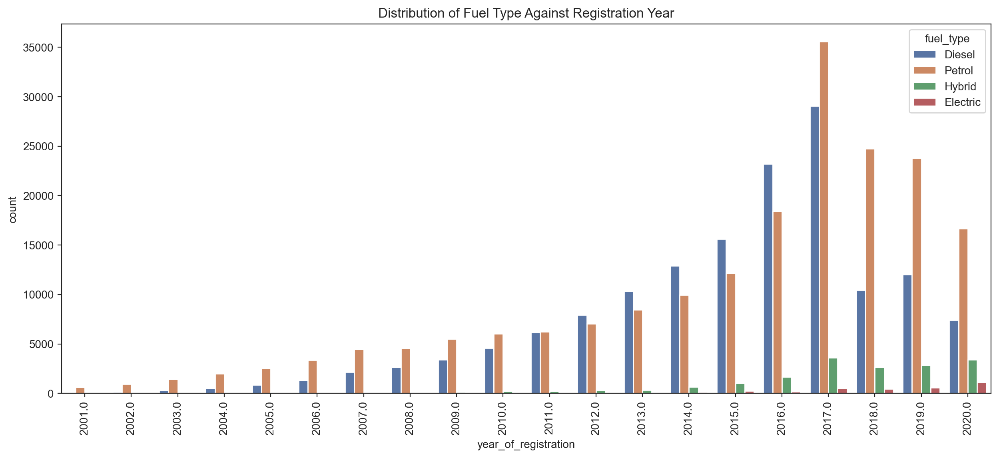

In [19]:
plt.figure(figsize=(15,6))
sns.countplot(data=less_fuel_type_df.loc[(less_fuel_type_df.year_of_registration>2000) & 
                                         (less_fuel_type_df.fuel_type.isin(['Petrol', 'Diesel', 'Hybrid', 'Electric']))], 
                                          x='year_of_registration', hue='fuel_type')
plt.xticks(rotation=90)
plt.title('Distribution of Fuel Type Against Registration Year')
plt.show()

In the distant years (prior to 1970), petrol cars were dominant. Diesel, hybrid and electric cars appeared at around 1970, 2003 and 2010 respectively (the mentioned years can't be concluded by observing the above graph due to large gap between counts; so they are concluded by analysing the dataframe). The proportion of petrol and diesel cars increased continuously untill 2017; however, in the last 3 years their percentage has decreased and the proportion of hybrid and electric cars has increased. Diesel cars have seen a dramatic drop in the last 3 years.

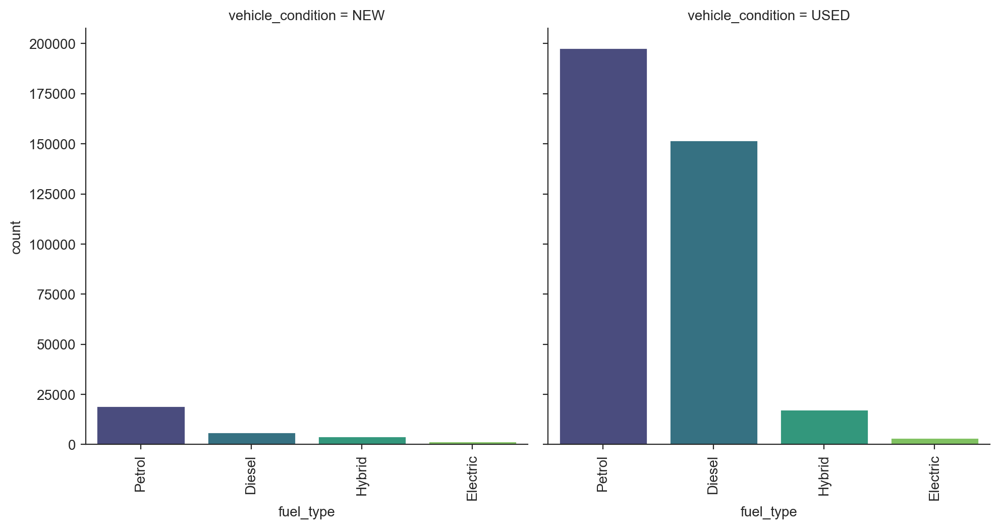

In [20]:
plot = sns.catplot(data=less_fuel_type_df.loc[less_fuel_type_df.fuel_type.isin(['Petrol', 'Diesel', 'Hybrid', 'Electric'])], 
                   x="fuel_type", col="vehicle_condition", kind="count", palette="viridis",
                   order=less_fuel_type_df.fuel_type.value_counts().index[:4])
plot.set_xticklabels(rotation=90)
plt.show()

## 2.3 Analysis of price versus different features

In [22]:
df_price_yor = df.groupby('year_of_registration')[['price']].mean().sort_values('price', ascending=False)
df_price_yor = df_price_yor.reset_index()
df_price_yor.head()

,year_of_registration,price
0,1955.0,404983.333333
1,1964.0,242268.500000
2,1957.0,163595.000000
3,1970.0,135449.333333
4,1960.0,127087.800000


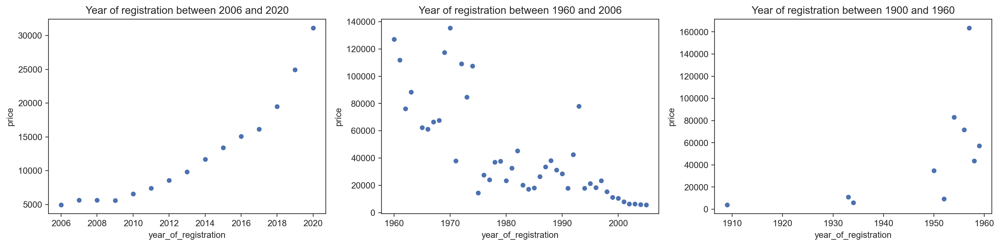

In [23]:
fig, axs = plt.subplots(1, 3, figsize=(16,4))
sns.scatterplot(data=df_price_yor.loc[df_price_yor.year_of_registration>=2006], 
                x='year_of_registration', y='price', ax=axs[0])
sns.scatterplot(data=df_price_yor.loc[(df_price_yor.year_of_registration>=1960) & (df_price_yor.year_of_registration<2006) 
                                      & (df_price_yor.price<150000)], x='year_of_registration', y='price', ax=axs[1])
sns.scatterplot(data=df_price_yor.loc[(df_price_yor.year_of_registration>1900) & (df_price_yor.year_of_registration<1960) 
                                      & (df_price_yor.price<200000)], x='year_of_registration', y='price', ax=axs[2])
axs[0].title.set_text('Year of registration between 2006 and 2020')
axs[1].title.set_text('Year of registration between 1960 and 2006')
axs[2].title.set_text('Year of registration between 1900 and 1960')
plt.tight_layout()
plt.show()

In [24]:
# adding mile_bin column to the DF
# Define milage bins
mile_bins = [0,1000,3000,5000,10000,20000,30000,40000,50000,75000,100000,150000,200000,300000,np.inf] 
mile_labels = ['0-1k','1k-3k','3k-5k','5k-10k','10k-20k','20k-30k','30k-40k','40k-50k','50k-75k','75k-100k','100k-150k','150k-200k','200k-300k','300k+']

# Adding a new column (bin the 'mileage' column)
df_mile_bin = df.copy()
df_mile_bin['mile_bin'] = pd.cut(df_mile_bin.mileage, bins=mile_bins, labels=mile_labels, right=False, include_lowest=True)
df_mile_bin.head(2)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,mile_bin
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid,0-1k
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel,100k-150k


In [25]:
df_price_mile = df_mile_bin.groupby('mile_bin')[['price']].mean().sort_values('price', ascending=False)
df_price_mile = df_price_mile.reset_index()
df_price_mile.head()

,mile_bin,price
0,1k-3k,34938.220673
1,0-1k,34365.107656
2,3k-5k,31221.680087
3,5k-10k,24851.218125
4,10k-20k,18586.344224


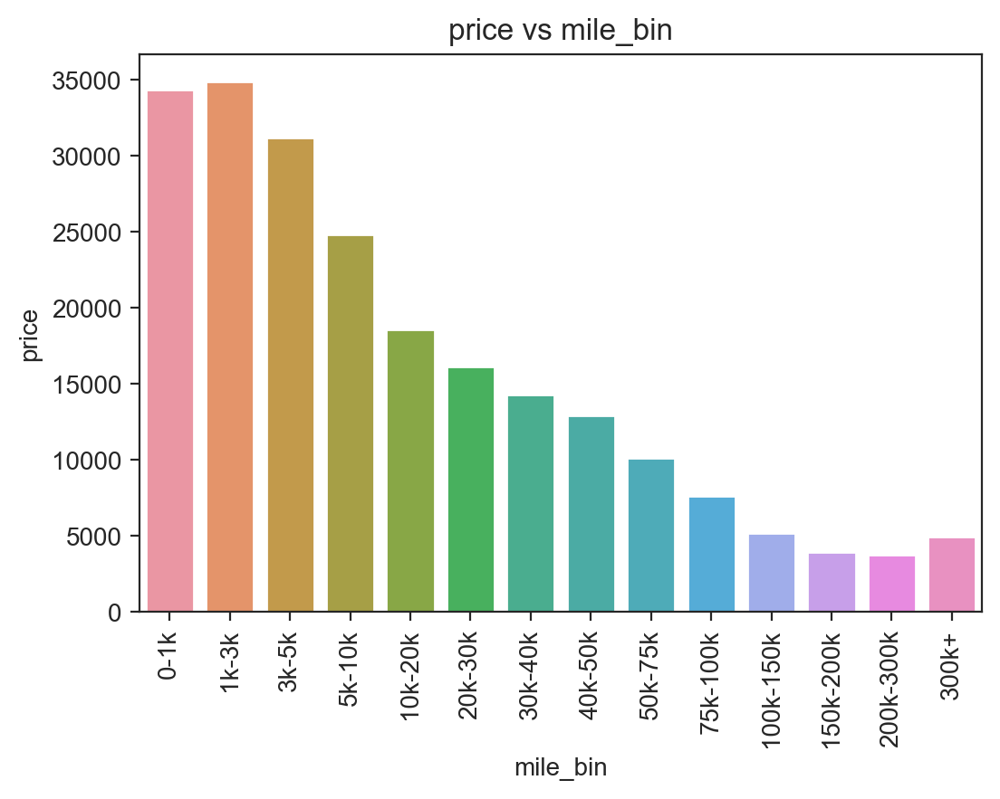

In [26]:
# fix, ax = plt.subplots(figsize=(12,4))
plot = sns.barplot(data=df_price_mile, x='mile_bin', y='price')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('price vs mile_bin')
plt.show()

It's the expected pattern, which is with increasing the mileage, the price reduces. The reason is that the cars with more mileage usually come with more wear and tear.

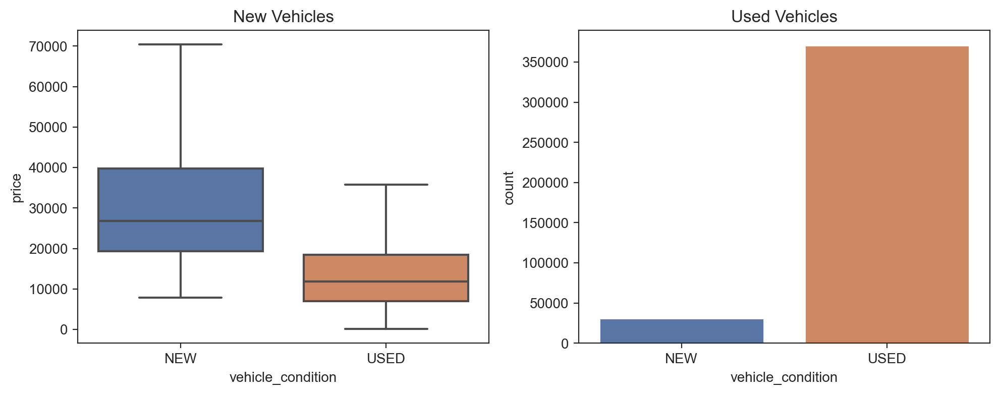

In [29]:
fig, axs = plt.subplots(1, 2, figsize=(10,4), sharex=True)

sns.boxplot(data=df.loc[df.price<4000000], x='vehicle_condition', y='price', ax=axs[0], showfliers=False)
sns.countplot(data=df, x='vehicle_condition', ax=axs[1])

# Set titles
axs[0].title.set_text('New Vehicles')
axs[1].title.set_text('Used Vehicles')

plt.tight_layout()
plt.show()

The data shows that the new cars are more expensive than the used cars. Also the percentage of used cars in adverts is much more than new cars.

In [34]:
df_price_make = df.groupby('standard_make')[['price']].mean().sort_values('price', ascending=False)
df_price_make = df_price_make.reset_index()
df_price_make.head()

,standard_make,price
0,Pagani,2.400000e+06
1,Bugatti,1.641249e+06
2,Ferrari,2.147008e+05
3,Lamborghini,2.113890e+05
4,McLaren,2.093033e+05


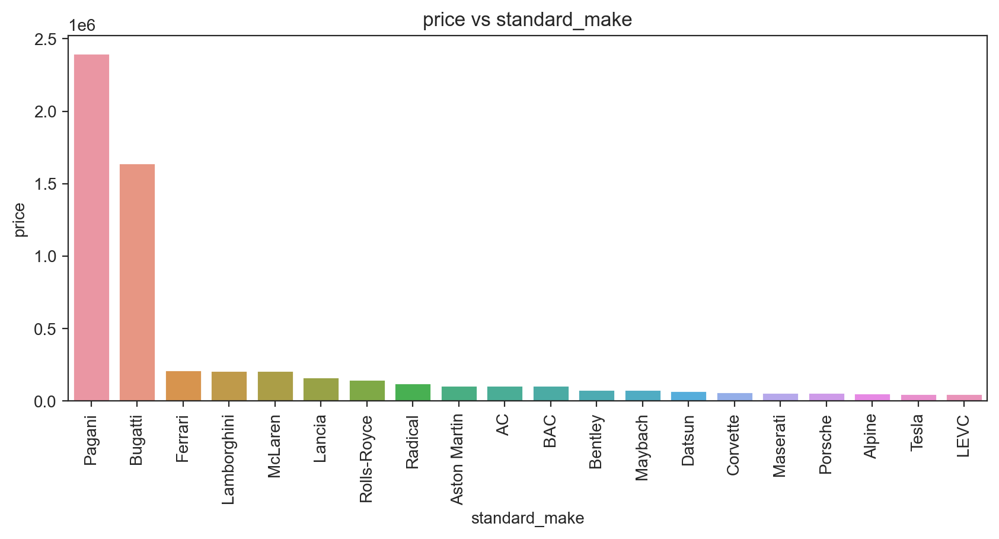

In [35]:
fix, ax = plt.subplots(figsize=(10,4))
plot = sns.barplot(data=df_price_make.head(20), x='standard_make', y='price')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('price vs standard_make')
plt.show()

In [30]:
# only keeping the popular brands (more than 10000)
less_make_df = df.groupby('standard_make').filter(lambda x: len(x)>=10000)
# grouping the above dataframe, then unstack the result
vehicle_cond_make_price = less_make_df.groupby(['standard_make', 'vehicle_condition'])['price']\
    .mean().round().unstack('vehicle_condition')

vehicle_cond_make_price

vehicle_condition,NEW,USED
standard_make,,
Audi,47109.0,18093.0
BMW,54451.0,18380.0
Citroen,20433.0,7746.0
Fiat,16135.0,6603.0
Hyundai,23062.0,10778.0
Kia,24684.0,12106.0
Land Rover,71269.0,31290.0
MINI,26424.0,11895.0
Mercedes-Benz,43961.0,20622.0


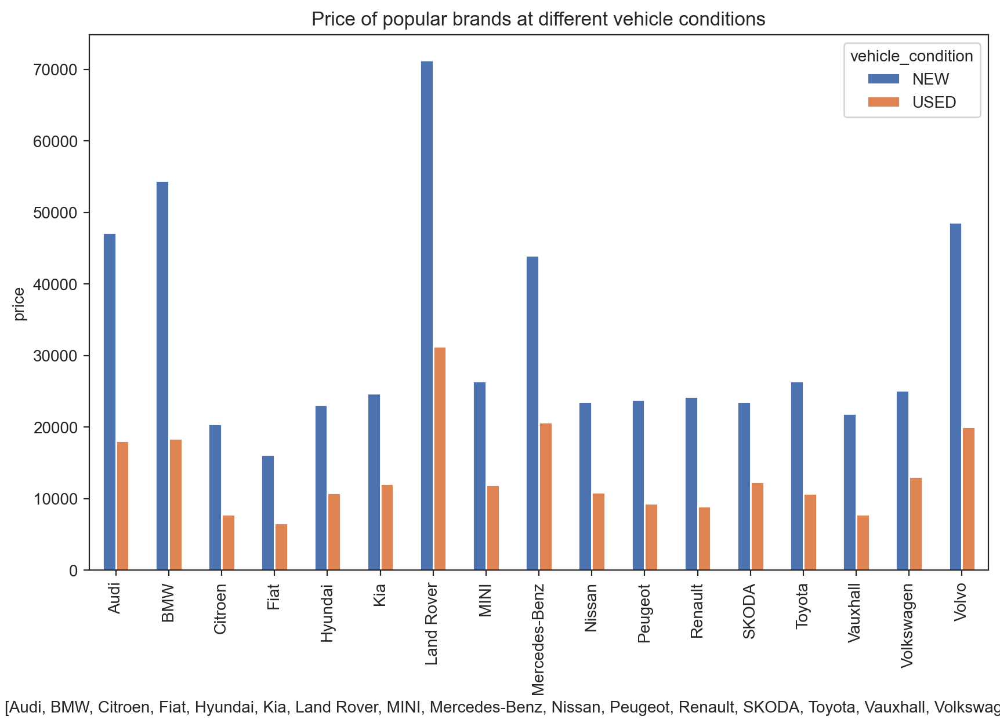

In [31]:
# plotting the above dataframe
plot = vehicle_cond_make_price.plot.bar(figsize=(10,6), xlabel=vehicle_cond_make_price.index, ylabel='price', 
                                     title='Price of popular brands at different vehicle conditions')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

As expected, the price of used cars drops sharply in all brands. Land Rover has the highest average price among popular brands, and after that BMW, Volvo, Audi and Mercedes-Benz are observed.

In [36]:
# creating a dataframe from standard_makes whose value_counts >= 10
df_make_counts = df.groupby('standard_make').filter(lambda x: len(x)>=10)
df_make_counts.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


In [37]:
# standard_make.value_counts decreased for better visualization
len(df.standard_make.value_counts()), len(df_make_counts.standard_make.value_counts())

(110, 65)

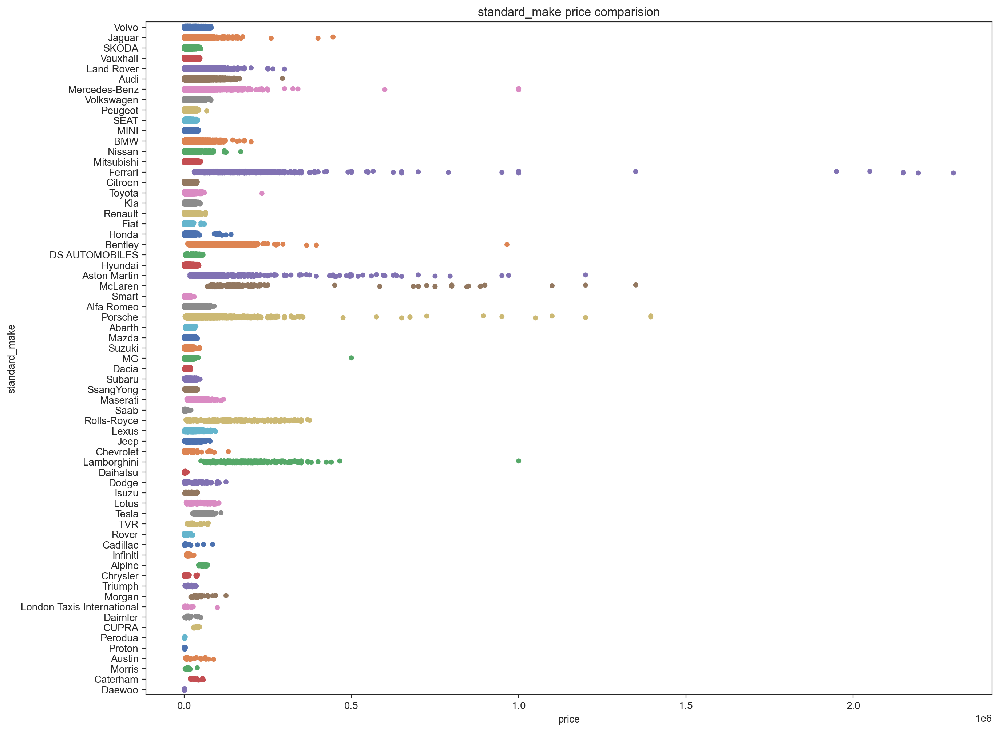

In [38]:
plt.subplots(figsize=(15, 12))

# Visualize a stripplot of standard_make vs price
sns.stripplot(data=df_make_counts.loc[df_make_counts.price<2500000], x='price', y='standard_make', jitter=0.1, palette='deep')
plt.title('standard_make price comparision')
plt.show()

According to the graphs, high car prices are associated with 8 luxury brands including Bugatti, Ferrari, Bentley, Aston Martin, McLaren, Porsche, Rolls-Royce and Lamborghini.

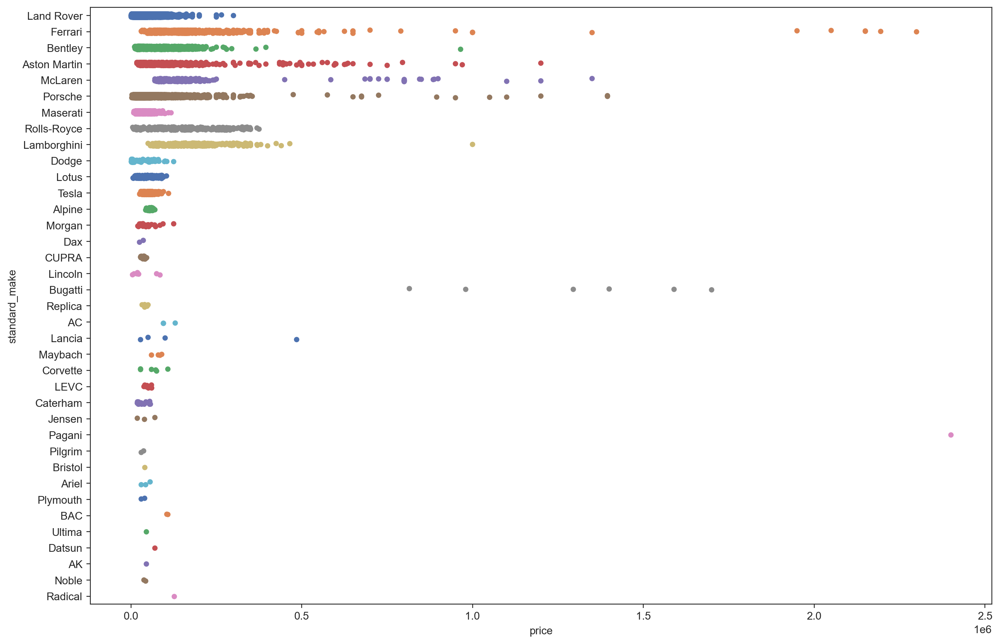

In [39]:
# creating a dataframe from standard_makes whose average price is greater than 30,000
df_make_counts = df.groupby('standard_make').filter(lambda x: x['price'].mean()>30000) 

# Visualize a stripplot of standard_make vs price
plt.subplots(figsize=(15, 10))
sns.stripplot(data=df_make_counts.loc[df_make_counts.price<2500000], x='price', y='standard_make', jitter=0.1, palette='deep')
plt.show()

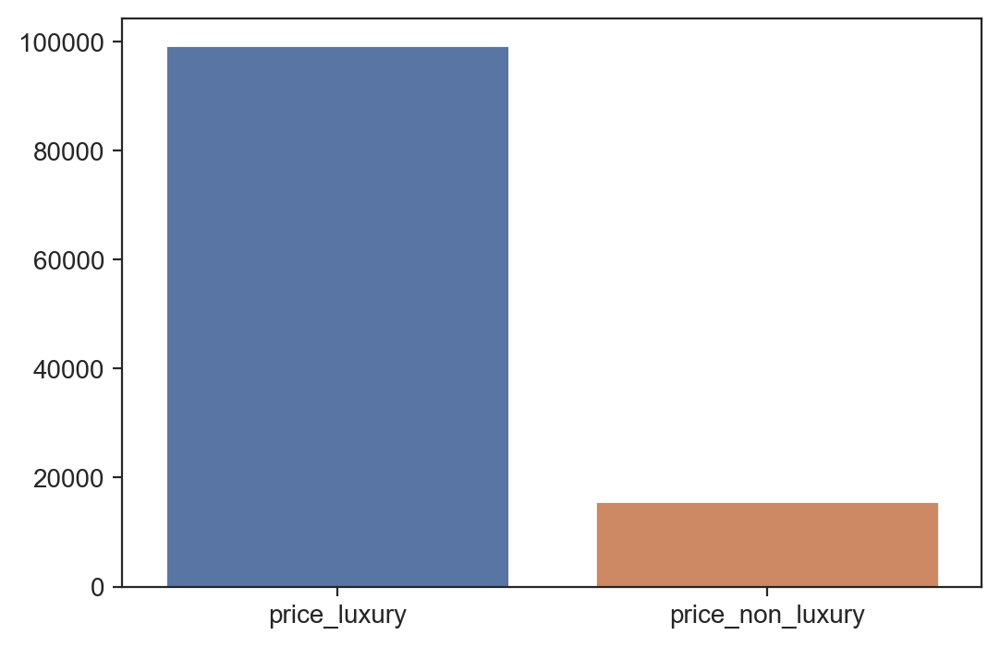

In [40]:
# comparing the price of luxury and non-luxury brands
price_luxury = df.loc[df.standard_make.isin(['Bugatti', 'Ferrari', 'Bentley', 'Aston Martin', 'McLaren', 
                                             'Porsche', 'Rolls-Royce', 'Lamborghini', 'Pagani'])].price.mean()

price_non_luxury = df.loc[~df.standard_make.isin(['Bugatti', 'Ferrari', 'Bentley', 'Aston Martin', 'McLaren', 
                                                  'Porsche', 'Rolls-Royce', 'Lamborghini', 'Pagani'])].price.mean()

price_df = pd.DataFrame(data={'price_luxury': price_luxury, 'price_non_luxury': price_non_luxury}, index=['mean price'])
sns.barplot(data=price_df)
plt.show()

In [41]:
price_df

,price_luxury,price_non_luxury
mean price,99361.271735,15721.835984


In [42]:
# the most popular color, body type and fuel type among luxury brands
print(df.loc[df.standard_make.isin(['Bugatti', 'Ferrari', 'Bentley', 'Aston Martin', 'McLaren', 'Porsche', 'Rolls-Royce', 'Lamborghini', 'Pagani'])]
      [['standard_colour', 'body_type', 'fuel_type']].mode())

  standard_colour body_type fuel_type
0           Black     Coupe    Petrol


In [43]:
df_price_body = df.groupby('body_type')[['price']].mean().sort_values('price', ascending=False)
df_price_body = df_price_body.reset_index()
df_price_body.head()

,body_type,price
0,Limousine,58953.911950
1,Coupe,35709.213561
2,Camper,33197.584416
3,Convertible,27015.137424
4,SUV,22477.751450


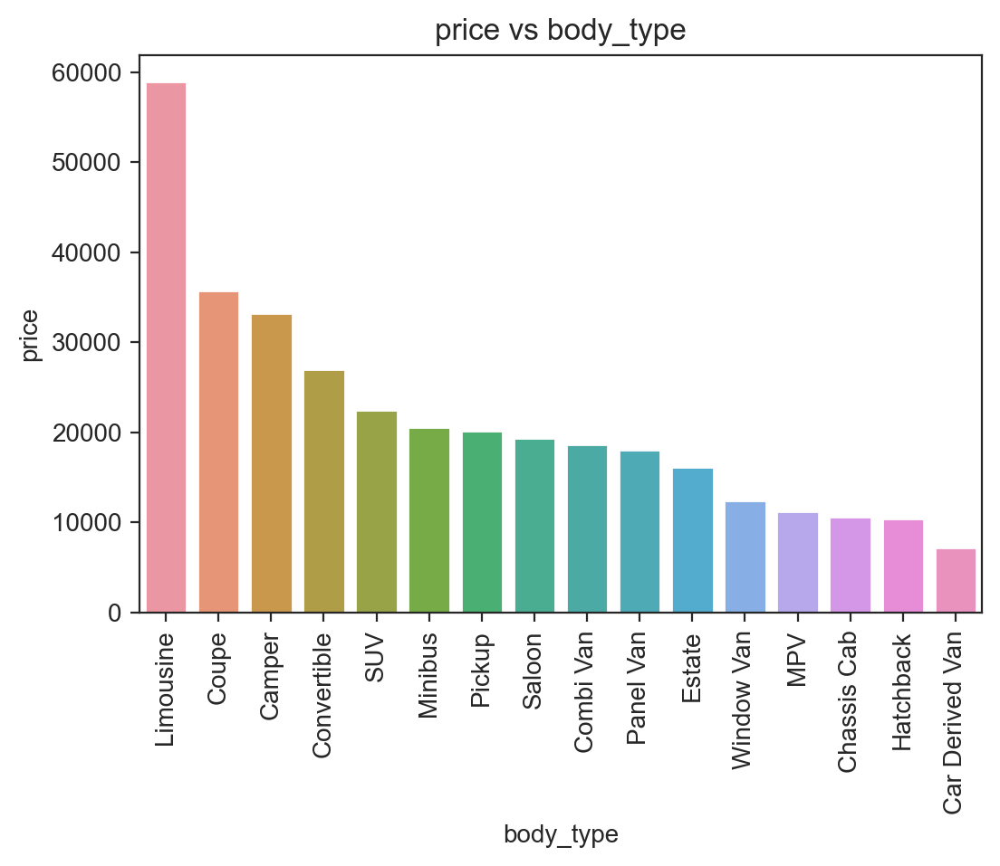

In [44]:
# fix, ax = plt.subplots(figsize=(12,4))
plot = sns.barplot(data=df_price_body, x='body_type', y='price')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('price vs body_type')
plt.show()

In [45]:
df_price_body2 = df.groupby(['body_type', 'vehicle_condition'])[['price']].mean().sort_values('price', ascending=False)
df_price_body2 = df_price_body2.reset_index()
df_price_body2.head(5)

,body_type,vehicle_condition,price
0,Limousine,USED,58953.911950
1,Coupe,NEW,55624.437666
2,Saloon,NEW,43461.319194
3,Convertible,NEW,40105.798365
4,Minibus,NEW,39935.000000


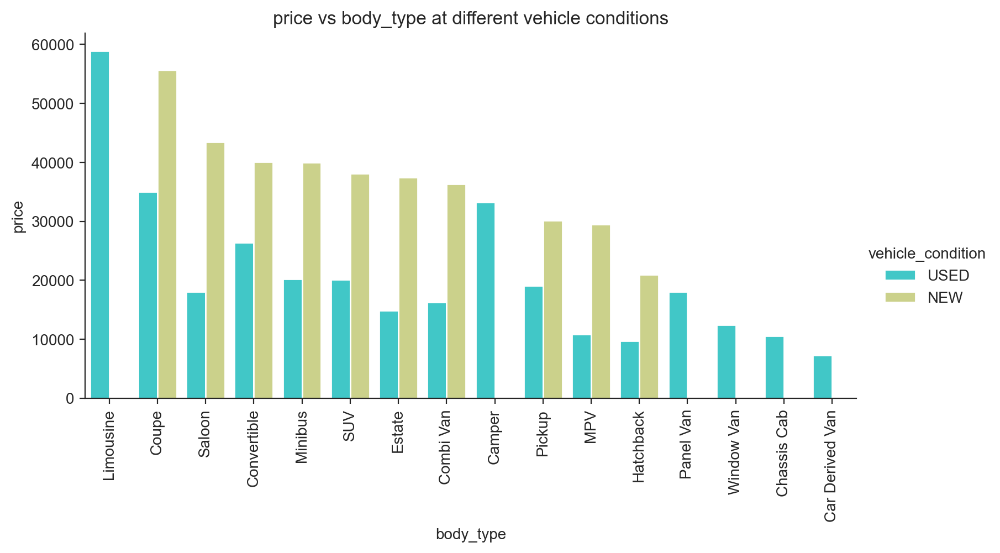

In [46]:
plot = sns.catplot(data=df_price_body2, x='body_type', y='price', hue='vehicle_condition', kind='bar', 
                   palette="rainbow", height=4, aspect=2)
plot.set_xticklabels(rotation=90)
plt.title('price vs body_type at different vehicle conditions')
plt.show()

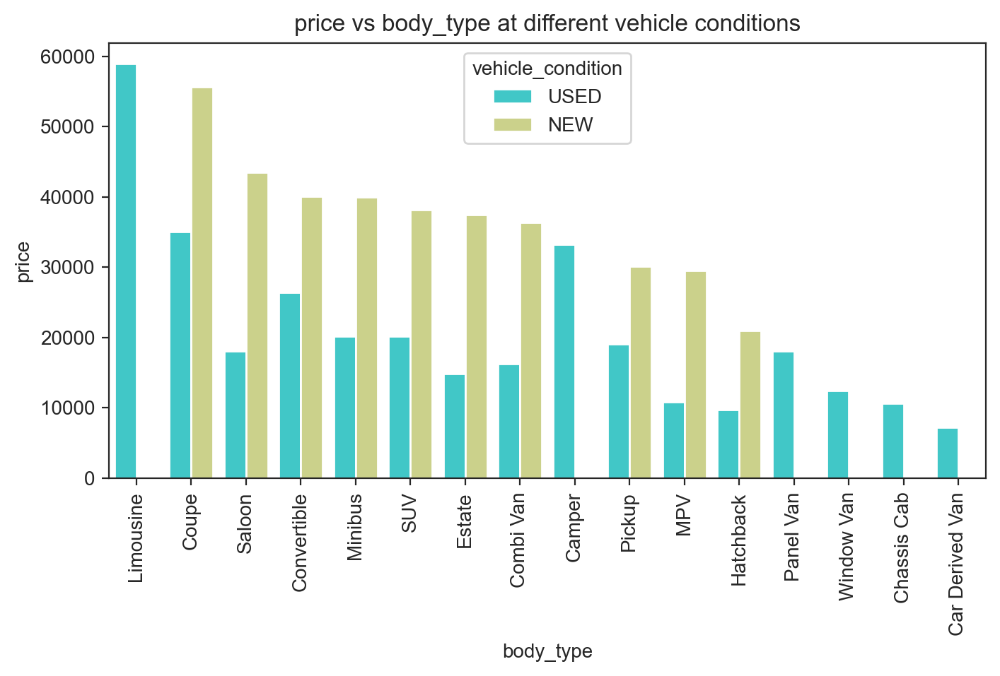

In [47]:
# same as above, using barplot
fix, ax = plt.subplots(figsize=(8,4))
plot = sns.barplot(data=df_price_body2, x='body_type', y='price', hue='vehicle_condition', palette="rainbow")
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('price vs body_type at different vehicle conditions')
plt.show()

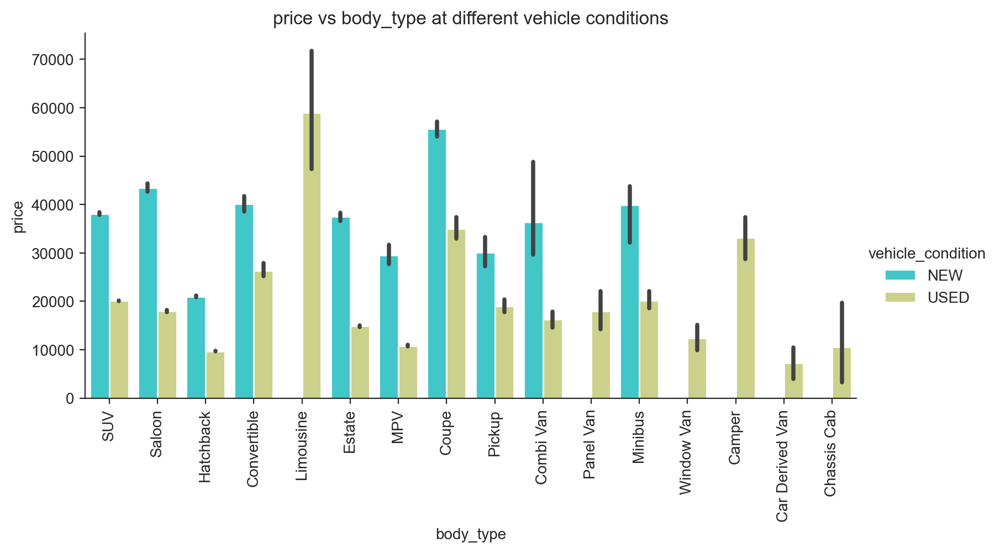

In [48]:
# same as above, but without sorting
plot = sns.catplot(data=df, x="body_type", y="price", hue="vehicle_condition", kind="bar", palette="rainbow", height=4, aspect=2)
plot.set_xticklabels(rotation=90)
plt.title('price vs body_type at different vehicle conditions')
plt.show()

In [49]:
# aggregating 4 hybrid fuel types into one type for a better visualization
less_fuel_type_df = df.copy()
less_fuel_type_df['fuel_type'] = less_fuel_type_df.fuel_type.map({'Petrol Hybrid': 'Hybrid', 'Petrol Plug-in Hybrid': 'Hybrid', 
                                                   'Diesel Hybrid': 'Hybrid', 'Diesel Plug-in Hybrid': 'Hybrid', 
                                                   'Petrol': 'Petrol', 'Diesel': 'Diesel', 'Electric': 'Electric', 
                                                   'Bi Fuel': 'Bi Fuel', 'Natural Gas': 'Natural Gas'})

In [50]:
df_price_fuel = less_fuel_type_df.groupby('fuel_type')[['price']].mean().sort_values('price', ascending=False)
df_price_fuel = df_price_fuel.reset_index()
df_price_fuel.head()

,fuel_type,price
0,Electric,32752.126072
1,Hybrid,26277.330351
2,Petrol,16620.439950
3,Diesel,16505.048387
4,Bi Fuel,14630.524887


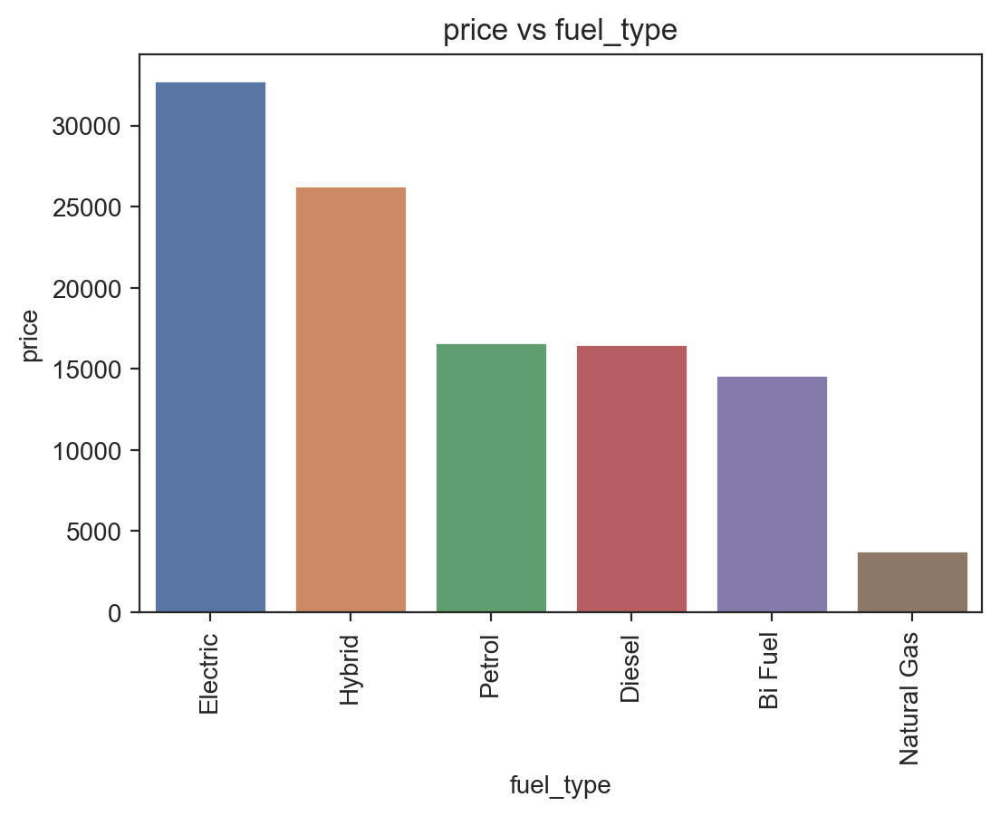

In [51]:
# fix, ax = plt.subplots(figsize=(12,4))
plot = sns.barplot(data=df_price_fuel, x='fuel_type', y='price')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('price vs fuel_type')
plt.show()

According to the graph electric vehicles are the most expensive cars, hybrid cars come after in the ranking and then petrol, diesel and bi fuel vehicles are observed, and this ranking matches with our general knowledge. Although electric and hybrid cars are more expensive than petrol and diesel cars, they have less running cost as they are much more fuel efficient, and this compensates their higher initial cost in the long term.

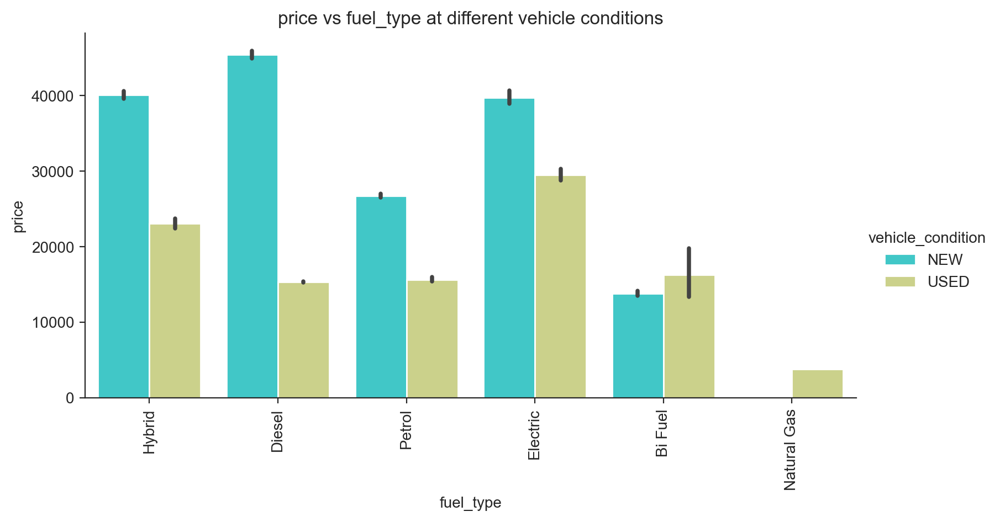

In [52]:
plot = sns.catplot(data=less_fuel_type_df, x="fuel_type", y="price", hue="vehicle_condition", kind="bar", 
                   palette="rainbow", height=4, aspect=2)
plot.set_xticklabels(rotation=90)
plt.title('price vs fuel_type at different vehicle conditions')
plt.show()

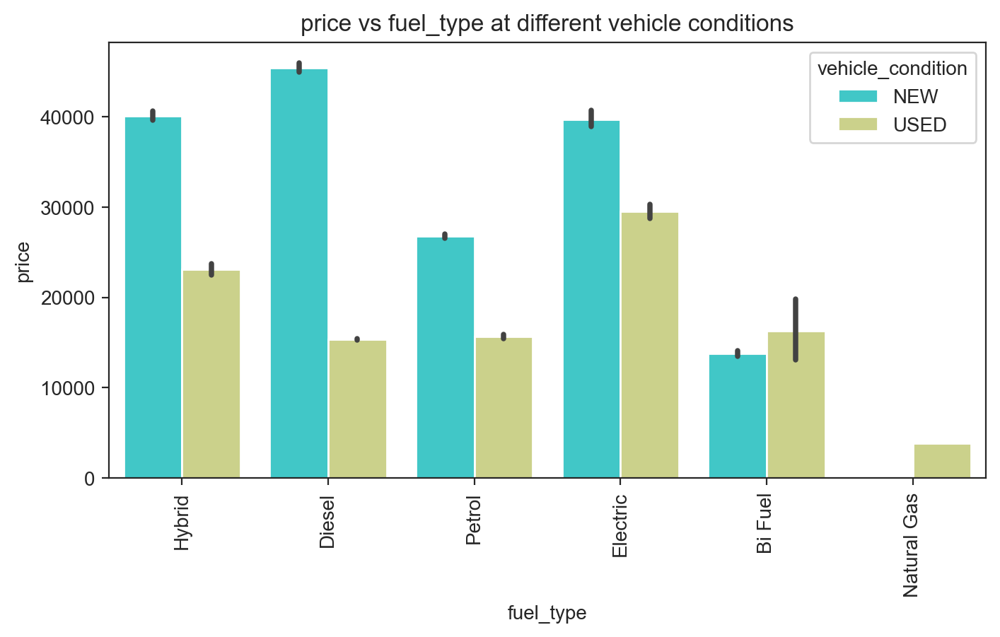

In [53]:
fix, ax = plt.subplots(figsize=(8,4))
plot = sns.barplot(data=less_fuel_type_df, x='fuel_type', y='price', hue='vehicle_condition', palette="rainbow")
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('price vs fuel_type at different vehicle conditions')
plt.show()

When it comes to the new vehicles, diesel vehicles have the highest prices, hybrid and electric cars have the second rank and petrol cars have the third rank.

The interesting point is that the price of used diesel cars drops sharply, in a way that regarding used cars, electric cars have the highest prices and after that hybrid, petrol and diesel cars are observed.

An unexpected phenomenon which is observed in the above graph is that the price of used bi fuel cars is higher than the new ones. The reason has been investigated below.

In [54]:
# the sole standard_make of new bi fuel cars is Dacia
less_fuel_type_df.loc[(less_fuel_type_df.fuel_type=='Bi Fuel') & (less_fuel_type_df.vehicle_condition=='NEW')].standard_make.value_counts()

standard_make
Dacia    146
Name: count, dtype: int64

In [55]:
# when it comes to used bi fuel cars, we see various standard_makes, some of which are expensive brands and most probably
# they have lifted up the average price of used bi fuel cars.
less_fuel_type_df.loc[(less_fuel_type_df.fuel_type=='Bi Fuel') & (less_fuel_type_df.vehicle_condition=='USED')].standard_make.value_counts()

standard_make
Dacia         49
Bentley        8
Volvo          3
Subaru         3
Proton         3
Toyota         2
Vauxhall       1
Chevrolet      1
Mitsubishi     1
Mazda          1
Honda          1
Chrysler       1
Saab           1
Name: count, dtype: int64

In [56]:
new_dacia = less_fuel_type_df.loc[(less_fuel_type_df.fuel_type=='Bi Fuel') & 
                                        (less_fuel_type_df.vehicle_condition=='NEW')].price.mean().round()

used_dacia = less_fuel_type_df.loc[(less_fuel_type_df.fuel_type=='Bi Fuel') & 
                                         (less_fuel_type_df.vehicle_condition=='USED') & 
                                         (less_fuel_type_df.standard_make=='Dacia')].price.mean().round()

used_non_dacia = less_fuel_type_df.loc[(less_fuel_type_df.fuel_type=='Bi Fuel') & 
                                             (less_fuel_type_df.vehicle_condition=='USED') & 
                                             (less_fuel_type_df.standard_make!='Dacia')].price.mean().round()

used_all = less_fuel_type_df.loc[(less_fuel_type_df.fuel_type=='Bi Fuel') & 
                                             (less_fuel_type_df.vehicle_condition=='USED')].price.mean().round()

bifuel_price = pd.DataFrame(data={'new_dacia': new_dacia, 'used_dacia': used_dacia, 
                                  'used_non_dacia': used_non_dacia, 'used_all': used_all}, index=['price'])
bifuel_price                       

,new_dacia,used_dacia,used_non_dacia,used_all
price,13787.0,14005.0,20546.0,16273.0


the above dataframe illustrates that new and used Dacia cars have similar prices (13,787 and 14,005 respectively), but the average price of used_non_dacia cars is much higher (20,546) and this has led to higher prices of used bi fuel cars (16,273).

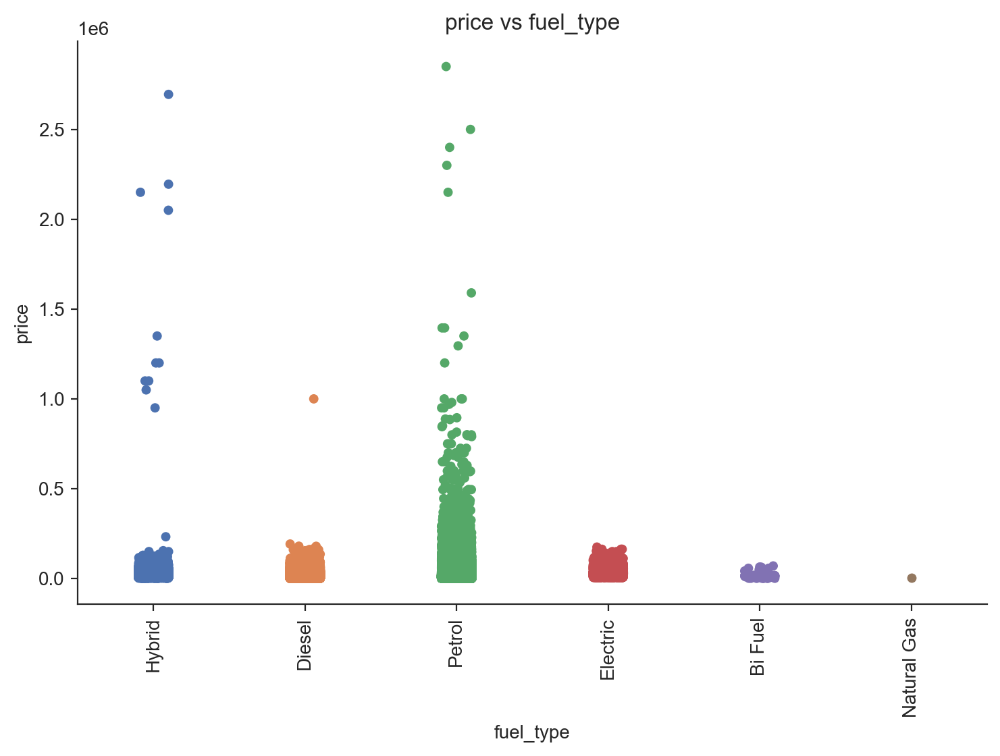

In [57]:
plot = sns.catplot(data=less_fuel_type_df.loc[(less_fuel_type_df.price<5000000) & (less_fuel_type_df.fuel_type.notnull())], x='fuel_type', y='price', hue='fuel_type', height=5, aspect=1.5)
plot.set_xticklabels(rotation=90)
plt.title('price vs fuel_type')
plt.show()

In [58]:
less_fuel_type_df.loc[less_fuel_type_df.price>500000]['fuel_type'].value_counts()

fuel_type
Petrol    70
Hybrid    11
Diesel     1
Name: count, dtype: int64

The graph shows that most of the super expensive cars (price more than 500,000 pounds) use petrol as fuel, and a lower percentage of them are hybrid.

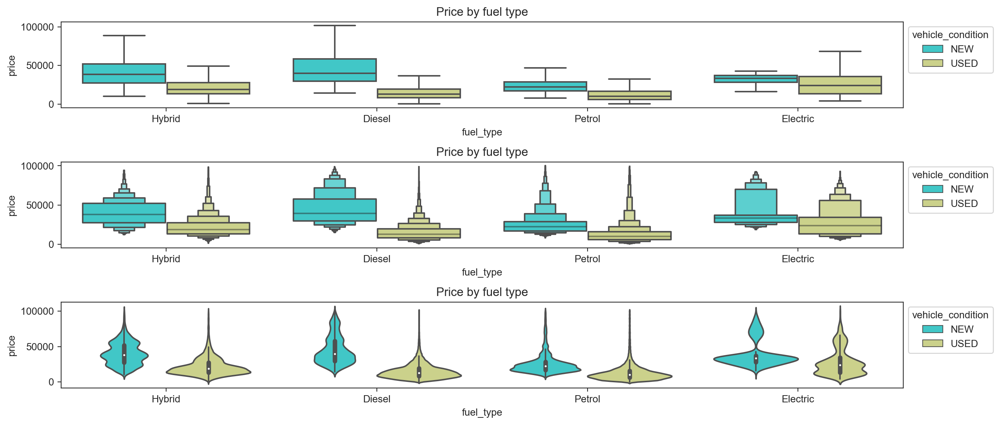

In [60]:
plt.figure(figsize=(14,6))

plt.subplot(3,1,1)
ax0 = sns.boxplot(x='fuel_type', y='price', 
                  data=less_fuel_type_df.loc[less_fuel_type_df.fuel_type.isin(['Petrol', 'Diesel', 'Hybrid', 'Electric'])], 
                  palette='rainbow', hue='vehicle_condition', showfliers=False)
sns.move_legend(ax0, "upper left", bbox_to_anchor=(1, 1))
plt.title("Price by fuel type")

plt.subplot(3,1,2)
ax1 = sns.boxenplot(x='fuel_type', y='price', 
                    data=less_fuel_type_df.loc[(less_fuel_type_df.fuel_type.isin(['Petrol', 'Diesel', 'Hybrid', 'Electric'])) 
                                               & (less_fuel_type_df.price<100000)], 
                    palette='rainbow', hue='vehicle_condition', showfliers=False)
sns.move_legend(ax1, "upper left", bbox_to_anchor=(1, 1))
plt.title("Price by fuel type")

plt.subplot(3,1,3)
ax2 = sns.violinplot(x='fuel_type', y='price', 
                     data=less_fuel_type_df.loc[(less_fuel_type_df.fuel_type.isin(['Petrol', 'Diesel', 'Hybrid', 'Electric'])) 
                                                & (less_fuel_type_df.price<100000)], 
                     palette='rainbow', hue='vehicle_condition', showfliers=False)
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1))
plt.title("Price by fuel type")

plt.tight_layout()
plt.show()

## 2.4 Investigating the relationship between mileage and YoR at different fuel types

In [61]:
df_mileage_fuel = less_fuel_type_df.loc[less_fuel_type_df.fuel_type!='Natural Gas'].groupby('fuel_type')[['mileage']].mean().sort_values('mileage', ascending=False)
df_mileage_fuel = df_mileage_fuel.reset_index()
df_mileage_fuel.head()

,fuel_type,mileage
0,Diesel,49254.590689
1,Petrol,31449.294357
2,Hybrid,23169.594349
3,Electric,10570.905459
4,Bi Fuel,9106.393665


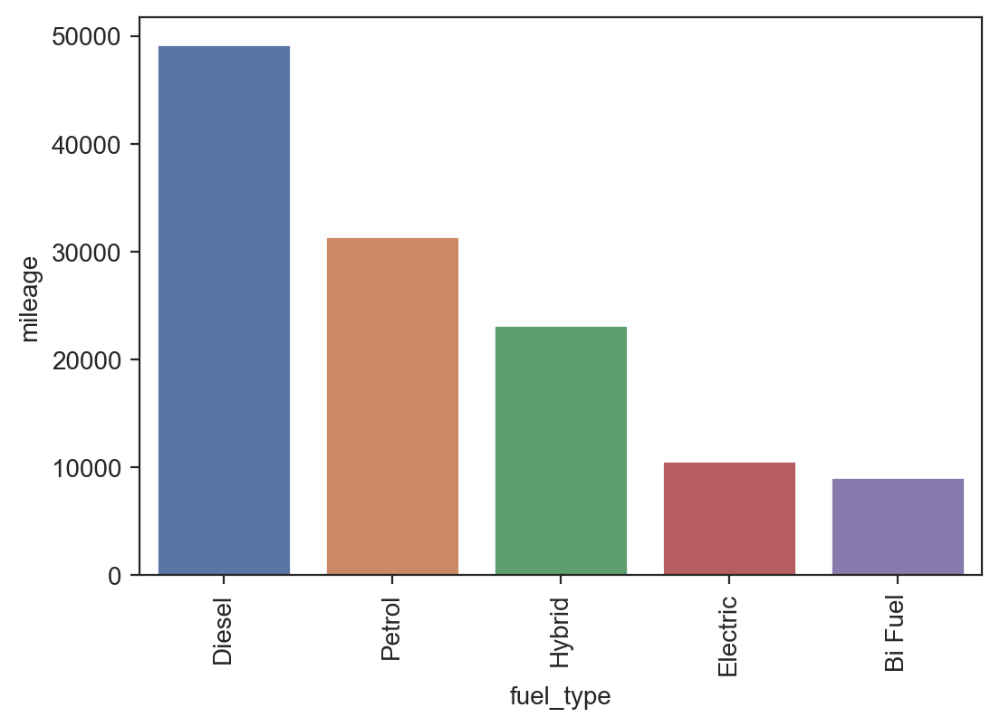

In [62]:
plot = sns.barplot(data=df_mileage_fuel, x='fuel_type', y='mileage')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
# plt.title('mileage vs fuel_type')
plt.show()

On the average diesel cars tend to cover more mileage than other cars, then petrol, hybrid, electric and bi fuel cars fall in the next ranks. A more detailed analysis based on year_of_registration has been carries out as follows.

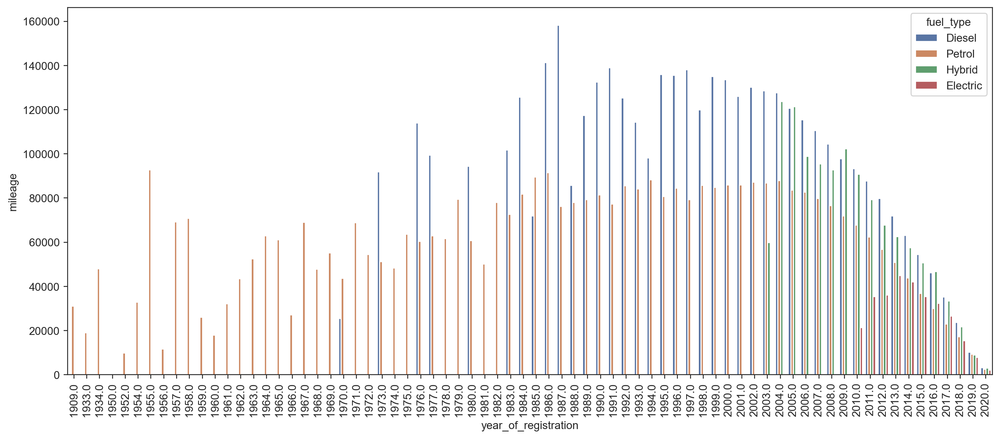

In [63]:
plt.figure(figsize=(15,6))
sns.barplot(data=less_fuel_type_df.loc[(less_fuel_type_df.year_of_registration>1900) & 
                                         (less_fuel_type_df.fuel_type.isin(['Petrol', 'Diesel', 'Hybrid', 'Electric']))], 
                                          x='year_of_registration', y='mileage', hue='fuel_type', errorbar=None)
plt.xticks(rotation=90)
plt.show()

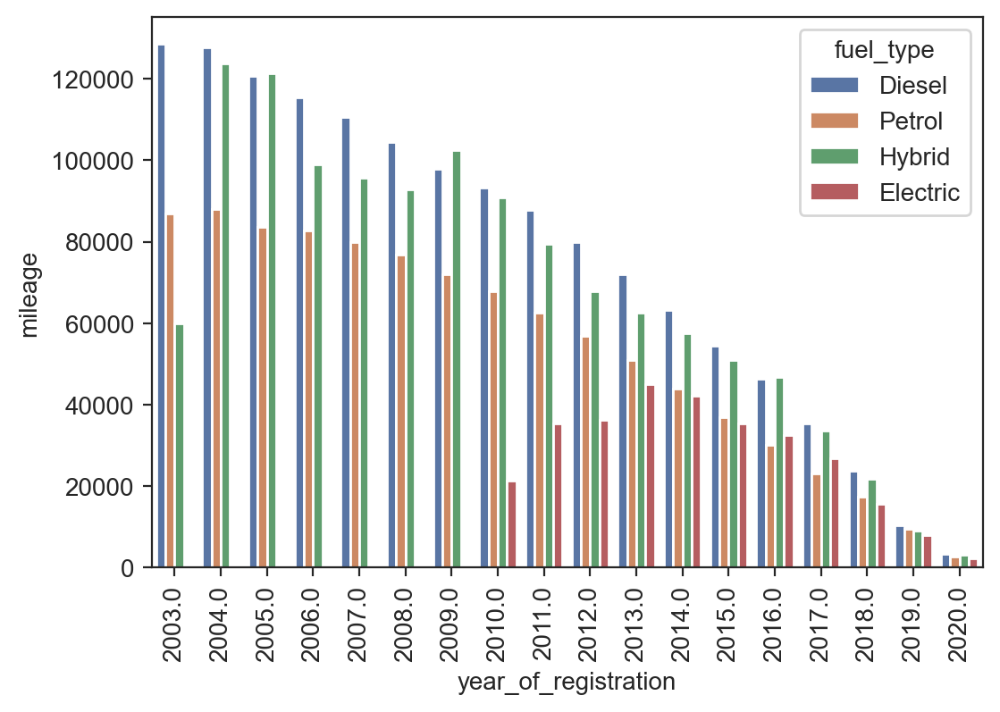

In [64]:
# plt.figure(figsize=(15,6))
sns.barplot(data=less_fuel_type_df.loc[(less_fuel_type_df.year_of_registration>=2003) & 
                                         (less_fuel_type_df.fuel_type.isin(['Petrol', 'Diesel', 'Hybrid', 'Electric']))], 
                                          x='year_of_registration', y='mileage', hue='fuel_type', errorbar=None)
plt.xticks(rotation=90)
# plt.title('Distribution of Fuel Type Against Registration Year')
plt.show()

Prior to 2003 diesel cars tended to travel more mileage than petrol cars, and this is because they are more fuel efficient than petrol cars.

With the advent of hybrid cars at 2003, their mileage sharply increased and it became almost equal to the diesel cars. As hybrid cars are much more fuel efficient, people tend to travel long distances with them.

Electric cars were introduced at 2010 and with advancement in technology in terms of more powerful batteries and horsepower, their mileage has increased over time.

Overall, in the last decade diesel and hybrid cars have covered more mileages, but considering environmental and emission concerns and technological advancements, it can be predicted that hybrid and electric cars will be dominant in the future.

## 2.5 Investigating the relationship between mileage and body type

There are 16 different body types in the dataset, but they can be categorized into a few classes for better analysis and visualization. For example there are a few variants of vans that I grouped them into a single category, or there are a number of body types (Hatchback, SUV, Saloon, Estate, Coupe, Convertible) that are mostly used by families, so I classified them into family car.

In [65]:
less_body_type_df = df.copy()
less_body_type_df['body_type'] = less_body_type_df.body_type.map({'MPV': 'Van', 'Combi Van': 'Van', 
                                                   'Minibus': 'Van', 'Car Derived Van': 'Van', 
                                                   'Panel Van': 'Van', 'Window Van': 'Van', 'Chassis Cab': 'Chassis Cab', 
                                                   'Hatchback': 'Family Car', 'SUV': 'Family Car', 'Saloon': 'Family Car',
                                                   'Estate': 'Family Car', 'Coupe': 'Family Car', 'Convertible': 'Family Car',
                                                   'Pickup': 'Pickup', 'Limousine': 'Limousine', 'Camper': 'Camper'})

In [66]:
df_mileage_body = less_body_type_df.groupby('body_type')[['mileage']].mean().sort_values('mileage', ascending=False)
df_mileage_body = df_mileage_body.reset_index()
df_mileage_body.head(60)

,body_type,mileage
0,Limousine,80093.911950
1,Chassis Cab,55133.333333
2,Camper,53493.558442
3,Pickup,53090.266990
4,Van,46549.201504
5,Family Car,37321.830149


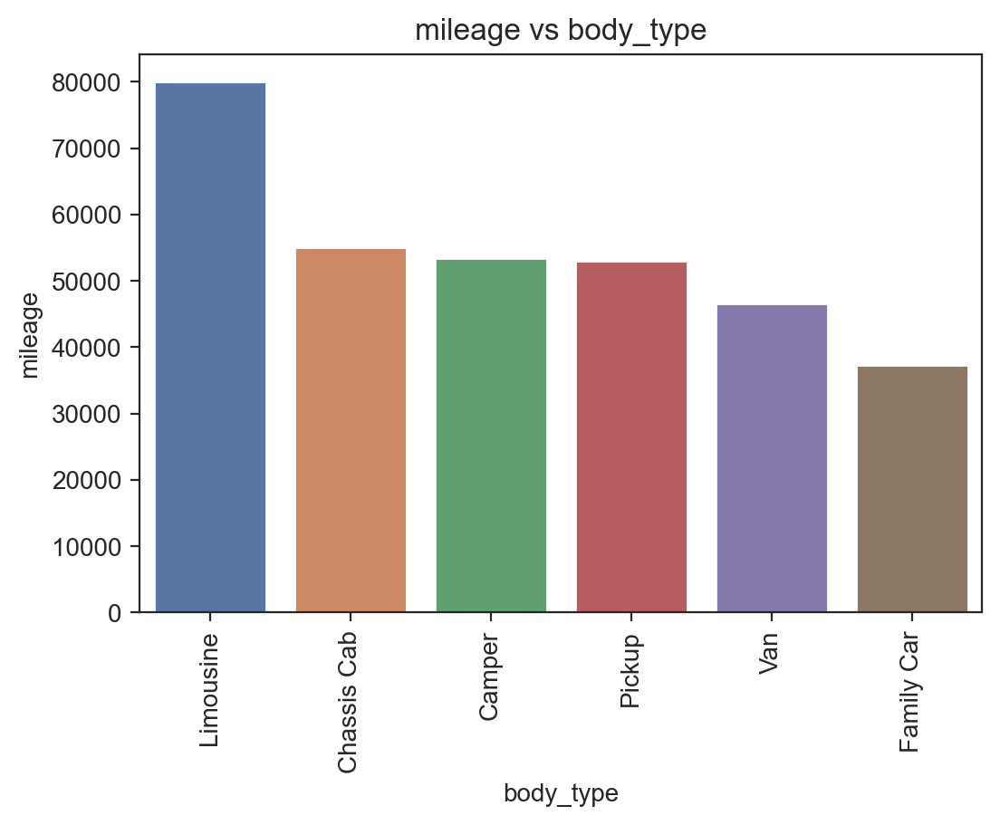

In [67]:
# plt.subplots(figsize=(12,4))
plot = sns.barplot(data=df_mileage_body, x='body_type', y='mileage')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('mileage vs body_type')
plt.show()

The interesting result is that limousines have highest mileage with a significant difference in relation to other body types and this was something that I didn't expect. After a little search I realized that limousines are usually extensively booked and used by high social class people and companies for transportations and ceremonies and this is why they have high mileages. 

The first 5 body types (limousine, chassib cab, camper, pickup and van) are mostly used for transporting passengers and loads and so they usually travel long distances. Family cars which are usually used for commuting to the workplace or for family entertainments have the least mileage. 

## 2.6 Investigating the relationship between standard make and fuel type

In [68]:
less_fuel_df = df.copy()

less_fuel_df['fuel_type'] = less_fuel_df.fuel_type.map({'Petrol Hybrid': 'Hybrid', 'Petrol Plug-in Hybrid': 'Hybrid', 
                                                   'Diesel Hybrid': 'Hybrid', 'Diesel Plug-in Hybrid': 'Hybrid', 
                                                   'Petrol': 'Petrol', 'Diesel': 'Diesel', 'Electric': 'Electric', 
                                                   'Bi Fuel': 'Bi Fuel', 'Natural Gas': 'Natural Gas'})

In [69]:
# slicing the dataframe based on standard_make in a way that there are at least 10 rows in each group
less_fuel_df = less_fuel_df.groupby('standard_make').filter(lambda x: len(x)>=10)

In [70]:
less_fuel_mode = less_fuel_df.pivot_table(index='standard_make', values='fuel_type', aggfunc=lambda x: x.mode()).reset_index()
less_fuel_mode.head()

,standard_make,fuel_type
0,Abarth,Petrol
1,Alfa Romeo,Petrol
2,Alpine,Petrol
3,Aston Martin,Petrol
4,Audi,Diesel


In [71]:
df_fuel_count = pd.DataFrame(less_fuel_mode.fuel_type.value_counts()).reset_index().rename(columns={'count': 'counts'})
df_fuel_count

,fuel_type,counts
0,Petrol,51
1,Diesel,12
2,Hybrid,1
3,Electric,1


In [72]:
print(less_fuel_mode.loc[less_fuel_mode.fuel_type=='Hybrid'])
print(less_fuel_mode.loc[less_fuel_mode.fuel_type=='Electric'])

   standard_make fuel_type
31         Lexus    Hybrid
   standard_make fuel_type
59         Tesla  Electric


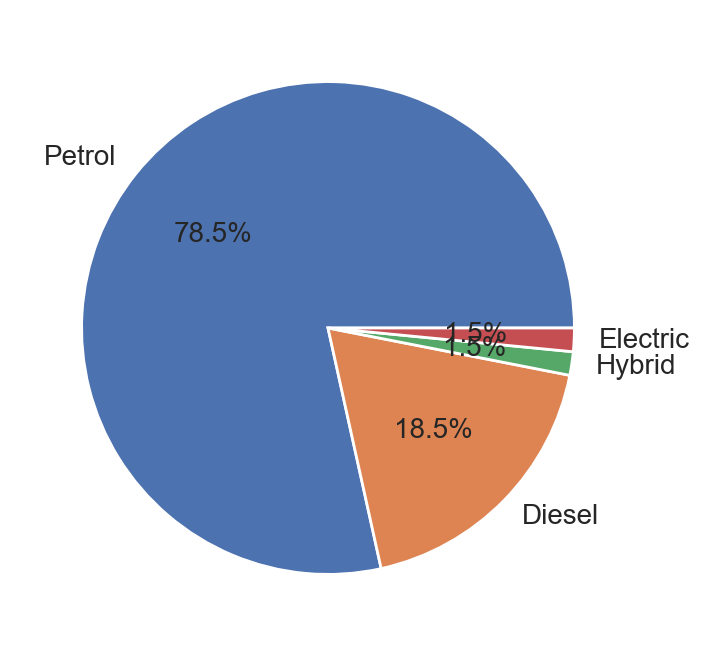

In [73]:
plt.pie(df_fuel_count.counts, labels=df_fuel_count.fuel_type, autopct='%.1f%%')
plt.show()

In this section at first I sliced the car manufacturers with at least 10 adverts, then I investigated the mode of fuel type in each brand. The results show that petrol is the most popular fuel in 78% of car manufacturers, diesel in 18%, hybrid and electric each in only one brand which are Lexus and Tesla respectively. The result matches with a previous analysis in which I sorted different fuel types of cars in all advertisements (figure below).

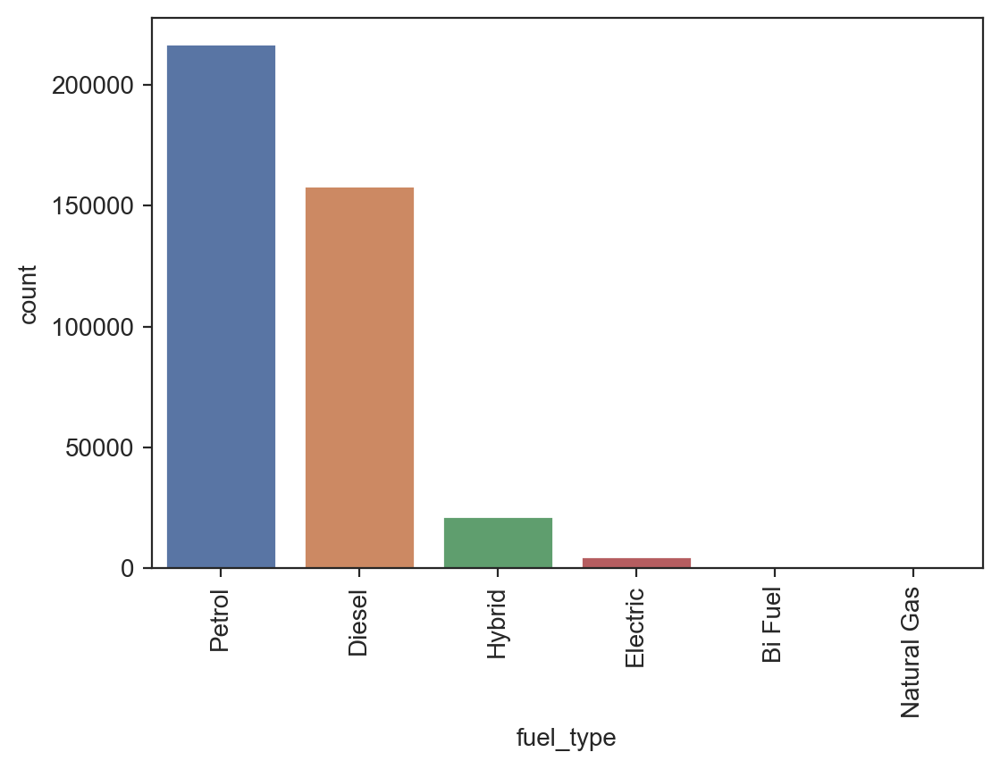

In [74]:
# aggregating 4 hybrid fuel types into one type for a better visualization
less_fuel_type_df = df.copy()
less_fuel_type_df['fuel_type'] = less_fuel_type_df.fuel_type.map({'Petrol Hybrid': 'Hybrid', 'Petrol Plug-in Hybrid': 'Hybrid', 
                                                   'Diesel Hybrid': 'Hybrid', 'Diesel Plug-in Hybrid': 'Hybrid', 
                                                   'Petrol': 'Petrol', 'Diesel': 'Diesel', 'Electric': 'Electric', 
                                                   'Bi Fuel': 'Bi Fuel', 'Natural Gas': 'Natural Gas'})

plot = sns.countplot(data=less_fuel_type_df, x='fuel_type', order=less_fuel_type_df.fuel_type.value_counts().index)
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

## 2.7 Investigating the relationship between standard make and body type

In [75]:
# slicing the dataframe based on standard_make in a way that there are at least 10 rows in each group
body_mode = df.groupby('standard_make').filter(lambda x: len(x)>=10)

In [76]:
len(body_mode)

401874

In [77]:
body_mode = body_mode.pivot_table(index='standard_make', values='body_type', aggfunc=lambda x: x.mode()).reset_index()
body_mode.head()

,standard_make,body_type
0,Abarth,Hatchback
1,Alfa Romeo,Hatchback
2,Alpine,Coupe
3,Aston Martin,Coupe
4,Audi,Hatchback


In [78]:
df_body_count = pd.DataFrame(body_mode.body_type.value_counts()).reset_index().rename(columns={'count': 'counts'})
df_body_count

,body_type,counts
0,Hatchback,24
1,SUV,13
2,Saloon,11
3,Coupe,9
4,Convertible,5
5,MPV,2
6,Pickup,1


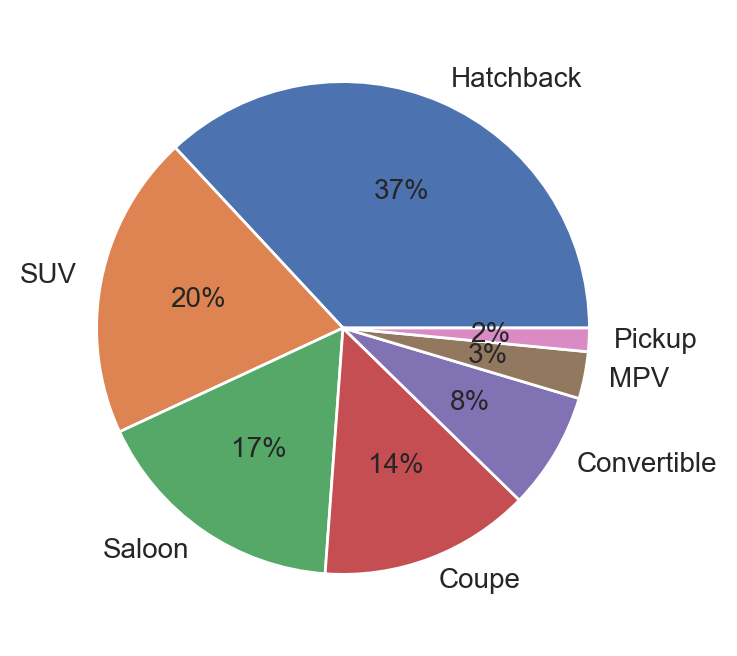

In [79]:
plt.pie(df_body_count.counts, labels=df_body_count.body_type, autopct='%.0f%%')
plt.show()

In this section at first I sliced the car manufacturers with at least 10 adverts, then I investigated the mode of body type in each brand. The results show that in 37% of brands hatchback is produced more than other body types, while this number is 20% for SUV, 17% for saloon, 14% for coupe, 8% for convertibel, 3% for multi purpose van (MPV) and 2% for pickup. The result matches with a previous analysis in which I sorted different body types of cars in all advertisements (figure below).

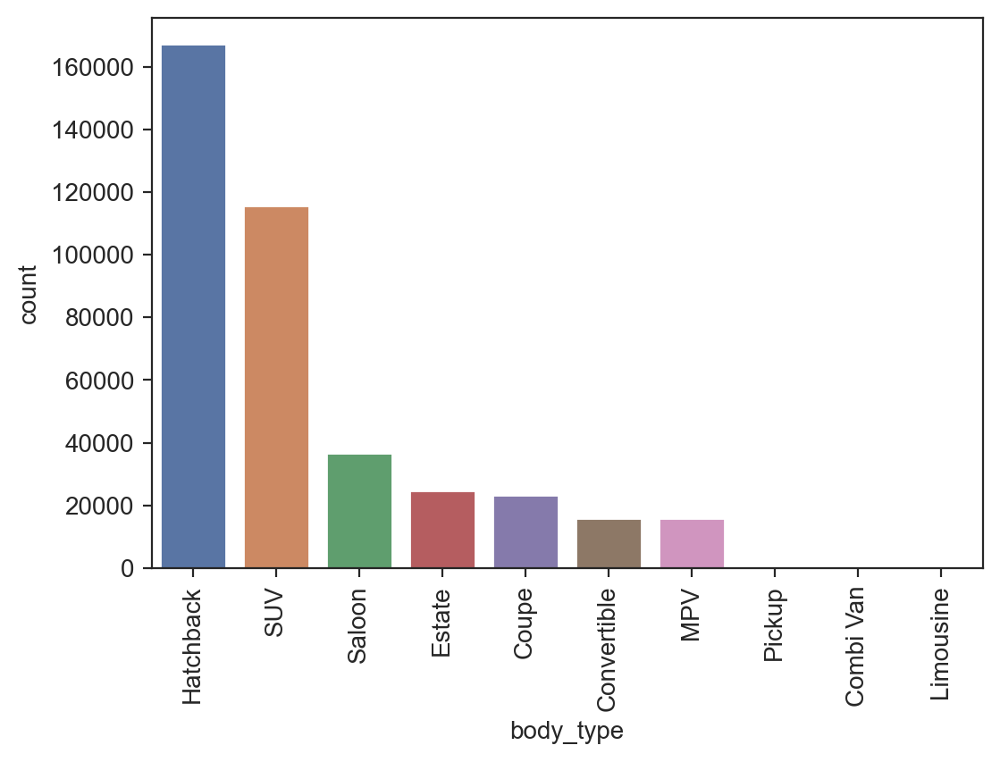

In [80]:
plot = sns.countplot(data=df, x='body_type', order=df.body_type.value_counts().index[:10])
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

## 2.8 Investigating the relationship between standard make and standard colour

In [81]:
# slicing the dataframe based on standard_make in a way that there are at least 10 rows in each group
color_mode = df.groupby('standard_make').filter(lambda x: len(x)>=10)

In [82]:
def mode_or_null(x):
    counts = x.value_counts()
    if len(counts) > 0:
        return counts.index[0]
    else:
        return np.nan

In [83]:
color_mode = color_mode.pivot_table(index='standard_make', values='standard_colour', aggfunc=mode_or_null).reset_index()
color_mode.head()

,standard_make,standard_colour
0,Abarth,Grey
1,Alfa Romeo,Red
2,Alpine,Blue
3,Aston Martin,Black
4,Audi,Black


In [84]:
df_color_count = pd.DataFrame(color_mode.standard_colour.value_counts()).reset_index().rename(columns={'count': 'counts'})
df_color_count

,standard_colour,counts
0,Black,28
1,Blue,9
2,White,9
3,Grey,7
4,Red,5
5,Silver,4
6,Green,3


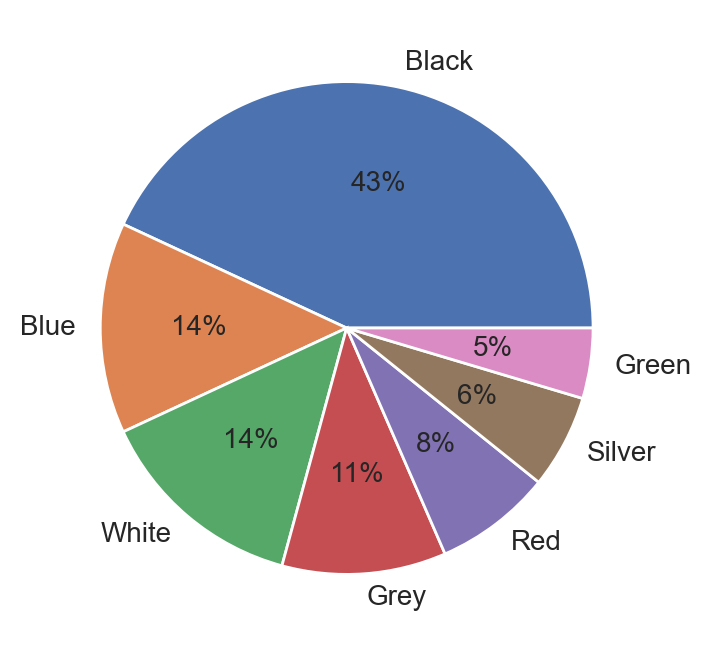

In [85]:
plt.pie(df_color_count.counts, labels=df_color_count.standard_colour, autopct='%.0f%%')
plt.show()

In this section at first I sliced the car manufacturers with at least 10 adverts, then I investigated the mode of color in each brand. The results show that in 43% of brands black color is produced more than other colors. The result matches to a great extent with a previous analysis in which I sorted different colors of cars in all advertisements (figure below).

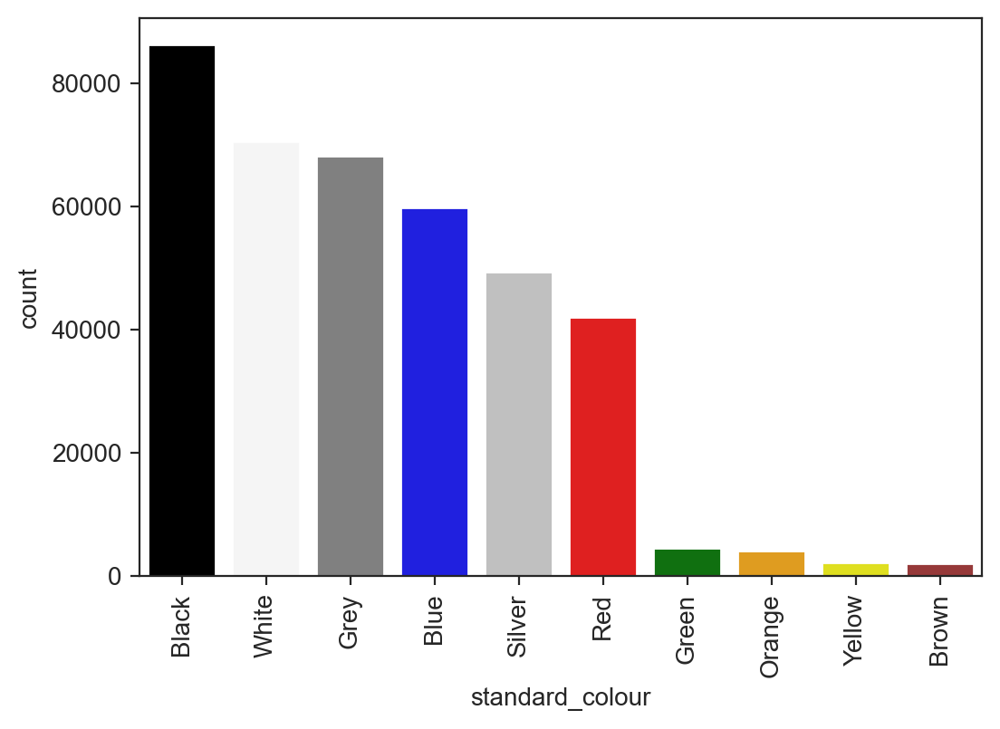

In [86]:
plot = sns.countplot(data=df, x='standard_colour', order=df.standard_colour.value_counts().index[:10], 
                     palette=['Black','Whitesmoke','Grey','Blue','Silver','Red','Green','Orange','Yellow','Brown'])
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

# 3. Data processing and imputing

In [88]:
df2 = df.copy()

In [89]:
df.isnull().sum()

public_reference             0
mileage                    127
reg_code                 31857
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33311
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

## 3.1 Imputing YoR based on reg_code column 

(where year_of_registration is null and reg_code is not null)

In [90]:
df2.reg_code.unique()

array([nan, '61', '17', '16', '64', '13', '08', '19', '60', '69', '66',
       '12', '18', '65', '09', 'B', '10', '14', '03', '67', '63', '15',
       '68', '56', '20', '70', '62', '11', '05', '59', '58', 'W', '02',
       '57', '06', '52', '53', '04', 'J', '07', '55', '51', 'X', 'D', 'S',
       'Y', '54', 'H', 'K', 'E', 'L', 'V', 'M', 'G', 'T', 'N', 'P', 'A',
       'F', 'R', 'C', '94', '85', 'CA', 'm', 'FW', '723xuu', '95', 's',
       '38', 'k', '37', 'p'], dtype=object)

In [91]:
df2.loc[(df2.reg_code.notnull()) & (df2.year_of_registration.isnull())]['reg_code'].unique()

array(['18', '61', '66', '17', '68', '70', '55', '67', '65', '69', '62',
       '20', '15', '56', '94', 'B', '14', '16', 'P', '19', '64', '59',
       '60', 'E', '85', '63', 'R', '12', '51', '13', '54', '09', '10',
       'L', '04', '11', '08', '07', '06', '57', 'CA', '58', 'C', 'Y',
       '05', 'M', 'J', 'H', 'S', '03', '723xuu', '95', '52', 'N', 'F',
       'T', 'V', '02', '53', '38', 'G', 'D', 'A', '37'], dtype=object)

In [92]:
# these objects are meaningless in reg_code (according to the reference provided i.e. Wikipedia)
# so I replaced them by np.nan
df2.loc[df2.reg_code.isin(['37','38','85','94','95','CA','FW','723xuu']), 'reg_code'] = np.nan

In [93]:
# I'm going to use reg_code to impute some of year_of_registration
yor_mode = df2.pivot_table(columns='reg_code', values='year_of_registration', aggfunc=lambda x: x.mode())
yor_mode

reg_code,02,03,04,05,06,07,08,09,10,11,...,S,T,V,W,X,Y,k,m,p,s
year_of_registration,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,...,1998.0,1999.0,1999.0,2000.0,2000.0,2001.0,1992.0,2005.0,1957.0,2001.0


In [94]:
mask = (df2.year_of_registration.isnull()) & (df2.reg_code.notnull())

In [95]:
df2.loc[mask, 'year_of_registration'] = df2.loc[mask, 'reg_code'].apply(lambda x: yor_mode[x])

In [96]:
# checking the result
df2.isnull().sum()

public_reference             0
mileage                    127
reg_code                 31867
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     31579
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

## 3.2 Imputing YoR based on vehicle condition

(where YoR is null and vehicle_condition is NEW --> fill those YoR with 2020)

In [97]:
# there are 31249 rows in which vehicle_condition is new
mile_reg = df2.loc[df.vehicle_condition=='NEW'][['mileage', 'vehicle_condition', 'year_of_registration']]
mile_reg

,mileage,vehicle_condition,year_of_registration
0,0.0,NEW,NaN
17,5.0,NEW,NaN
19,0.0,NEW,NaN
37,0.0,NEW,NaN
44,0.0,NEW,NaN
...,...,...,...
401860,10.0,NEW,NaN
401890,5.0,NEW,NaN
401902,10.0,NEW,NaN
401905,0.0,NEW,NaN


In [98]:
# for these rows the mileage is between 0 and 100 
mile_reg.mileage.min(), mile_reg.mileage.max()

(0.0, 100.0)

In [99]:
# for all of these rows the year_of_registration is null 
mile_reg.year_of_registration.value_counts()

Series([], Name: count, dtype: int64)

In [100]:
# for new vehicles, year_of_registration is imputed by 2020
df2.loc[df2.vehicle_condition=='NEW', 'year_of_registration'] = 2020

In [101]:
# checking the result
df2.loc[df2.vehicle_condition=='NEW'][['year_of_registration']].value_counts()

year_of_registration
2020.0                  31249
Name: count, dtype: int64

## 3.3 Dealing with YoR values which are less than 1900

(in 17 rows YoR is less than 1900, I want to replace them with np.nan)

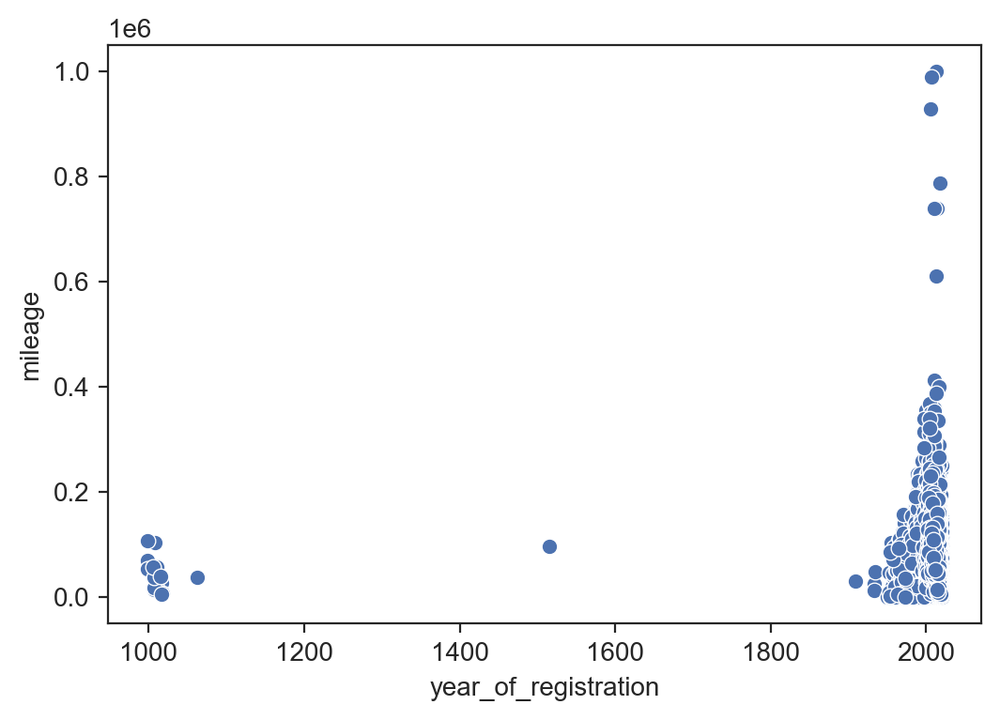

In [102]:
sns.scatterplot(data=df2, x='year_of_registration', y='mileage')
plt.show()

In [103]:
# some of 'year_of_registration' are less than 1900, I want to replace them with np.nan
df2.loc[df2.year_of_registration<1900]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
59010,202006270588110,14000.0,07,Blue,Toyota,Prius,USED,1007.0,7000,Hatchback,False,Petrol Hybrid
69516,202010155035879,96659.0,65,Black,Audi,A4 Avant,USED,1515.0,10385,Estate,False,Diesel
84501,202009163810376,37771.0,63,Black,Smart,fortwo,USED,1063.0,4785,Coupe,False,Petrol
114737,202008102305925,30000.0,59,Red,Toyota,AYGO,USED,1009.0,4695,Hatchback,False,Petrol
120858,202010064654489,27200.0,66,Black,MINI,Clubman,USED,1016.0,18990,Estate,False,Diesel
190556,202010205206488,58470.0,10,Black,Fiat,Punto Evo,USED,1010.0,3785,Hatchback,False,Petrol
199830,202009013167637,23000.0,59,Silver,MINI,Hatch,USED,1009.0,5995,Hatchback,False,Petrol
199987,202010225311657,104000.0,08,Silver,BMW,1 Series,USED,1008.0,4395,Convertible,False,Petrol
201616,202010134937656,8600.0,68,Silver,BMW,M2,USED,1018.0,41990,Coupe,False,Petrol
201626,202010155037484,69346.0,64,Red,Mazda,Mazda3,USED,999.0,8795,Saloon,False,Petrol


In [104]:
len(df2.loc[df2.year_of_registration<1900])

17

In [105]:
# replacing YoR<1900 with np.nan
df2.loc[df2.year_of_registration<1900, 'year_of_registration'] = np.nan

In [106]:
# checking the result
df2.loc[df2.year_of_registration<1900]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


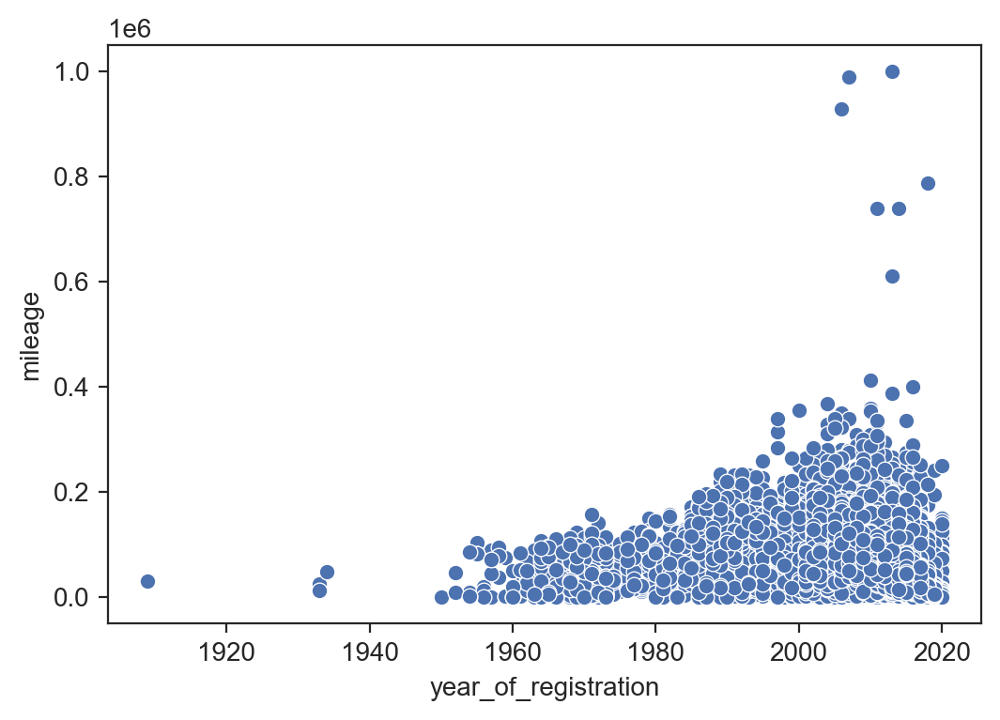

In [107]:
sns.scatterplot(data=df2, x='year_of_registration', y='mileage')
plt.show()

## 3.4 Identifying the outliers of mileage and replace them with reasonable values based on YoR

creating a new column 'mile_per_year', identify the outliers and replace the corresponding mileages with mean of mileage based on YoR

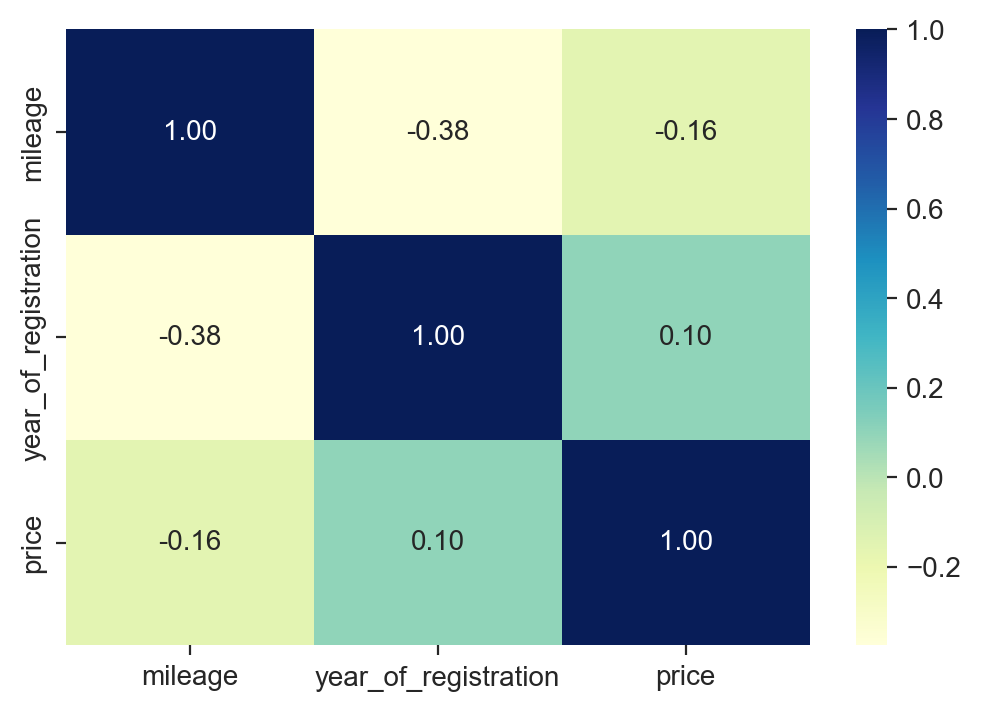

In [108]:
# at first I want to investigate the relationship between mileage and year_of_registration
# based on this graph there is a correlation between mileage and year_of_registration
num_feat = ['mileage', 'year_of_registration', 'price']
plt.subplots(figsize=(6,4))
sns.heatmap(df[num_feat].corr(), cmap='YlGnBu', annot=True, fmt='.2f')
plt.show()

In [109]:
mile_reg = df2.groupby('year_of_registration')[['mileage']].mean().sort_values('year_of_registration', ascending=False)
mile_reg = mile_reg.reset_index()
mile_reg.head()

,year_of_registration,mileage
0,2020.0,1365.984228
1,2019.0,9635.597368
2,2018.0,19431.064244
3,2017.0,28826.595593
4,2016.0,39378.159317


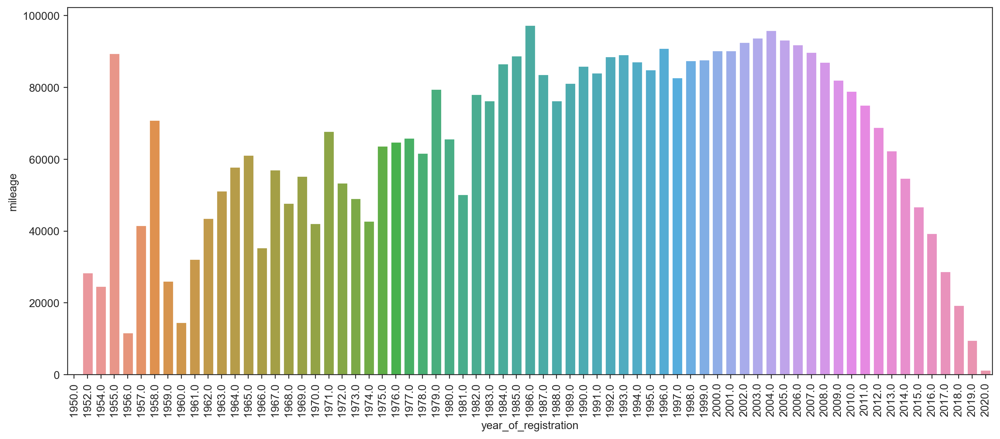

In [110]:
plt.figure(figsize=(15,6))
plot = sns.barplot(data=mile_reg.loc[mile_reg.year_of_registration>1940], x='year_of_registration', y='mileage')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()
# 1940 < year_of_registration < 2004: as year_of_registration increases, mileage increases as well. probably because 
# the use of car was growing and was becoming as a daily routine during that period and in addition, more advanced car were
# produced which were capable of taking more mileages.

# 2004 <= year_of_registration <= 2020: as year_of_registration increases, mileage decreases. the reasosn is obvious and 
# this is because the cars have been used for less time.

# overall, we can make use of this relationship to fill the missing values in these two columns

In [111]:
# I want to check mile_per_year, identify the outliers and replace them with mean of mileage based on year_of_registration
# adding a new column named mile_per_year
df2['mile_per_year'] = df2['mileage'] / (np.max(df2['year_of_registration']) - df2['year_of_registration'] + 0.5)

In [112]:
# there are 2 rows in which mileage==0, but mile_per_year!=0, and the reason is that in these 2 rows
# year_of_registration is null
df2.loc[(df2.mileage==0) & (df2.mile_per_year!=0)] [['mileage','year_of_registration','mile_per_year']]

,mileage,year_of_registration,mile_per_year
24939,0.0,NaN,NaN
249080,0.0,NaN,NaN


In [113]:
# for the above 2 rows I assign 0 to mile_per_year
df2.loc[(df2.mileage==0) & (df2.year_of_registration.isnull()), 'mile_per_year'] = 0

In [114]:
# checking the result
df2.loc[(df2.mileage==0) & (df2.mile_per_year!=0)]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,mile_per_year


In [115]:
# I assume that mile_per_year>100000 are outliers
high_mpy = df2.loc[df2.mile_per_year>100000][['mileage', 'year_of_registration', 'mile_per_year']].sort_values('mile_per_year', ascending=False)
high_mpy

,mileage,year_of_registration,mile_per_year
157710,250000.0,2020.0,500000.0
131508,788072.0,2018.0,315228.8
85334,152000.0,2020.0,304000.0
164023,150000.0,2020.0,300000.0
148395,149000.0,2020.0,298000.0
...,...,...,...
389802,52300.0,2020.0,104600.0
239779,51231.0,2020.0,102462.0
246811,51000.0,2020.0,102000.0
393602,51000.0,2020.0,102000.0


In [116]:
# there are 67 cars with mile_per_year>100000, 62 of which year_of_registration=2020 which seems implausible
high_mpy.year_of_registration.value_counts()

year_of_registration
2020.0    62
2019.0     2
2018.0     1
2013.0     1
2014.0     1
Name: count, dtype: int64

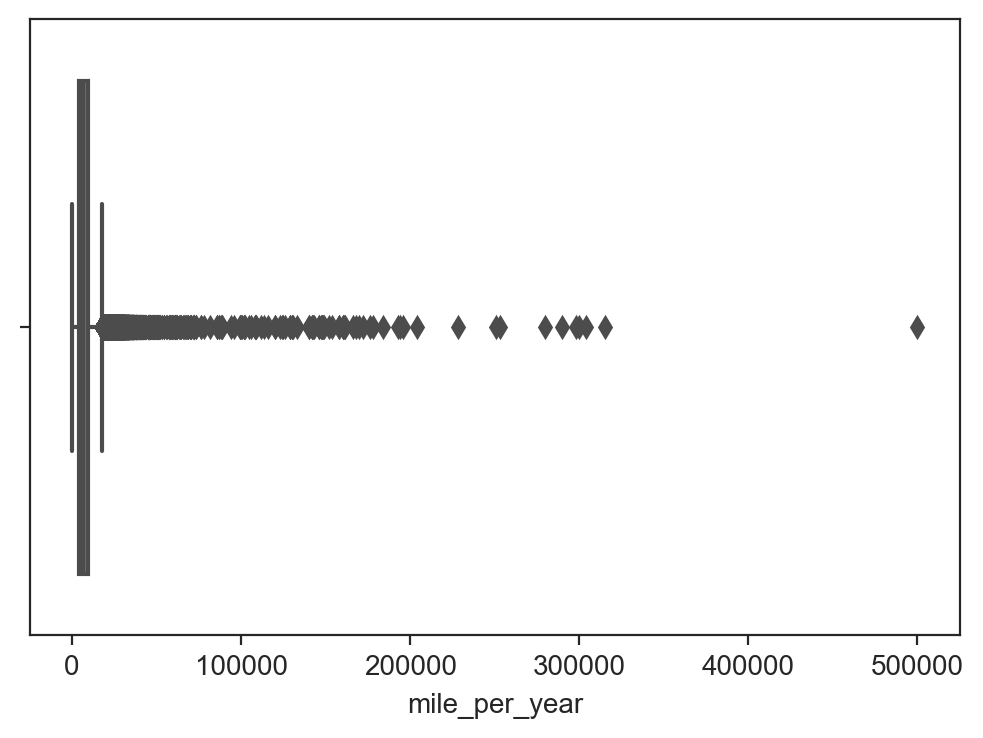

In [117]:
sns.boxplot(data=df2, x='mile_per_year')
plt.show()

In [118]:
mean_mile = df2.pivot_table(columns='year_of_registration', values='mileage', aggfunc='mean')
mean_mile

year_of_registration,1909.0,1933.0,1934.0,1950.0,1952.0,1954.0,1955.0,1956.0,1957.0,1958.0,...,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0
mileage,31172.0,19172.5,48000.0,367.0,28500.0,24722.0,89552.666667,11714.666667,41626.8,70923.0,...,75108.432077,68945.301767,62463.049316,54803.233103,46835.115521,39378.159317,28826.595593,19431.064244,9635.597368,1365.984228


In [119]:
mask = df2.mile_per_year > 100000

In [120]:
df2.loc[mask, 'mileage'] = df2.loc[mask, 'year_of_registration'].apply(lambda x: mean_mile[x])

In [121]:
# checking the result (mileage column has changed)
df2.loc[df2.mile_per_year>100000][['mileage', 'year_of_registration', 'mile_per_year']].sort_values('mile_per_year', ascending=False)

,mileage,year_of_registration,mile_per_year
157710,1365.984228,2020.0,500000.0
131508,19431.064244,2018.0,315228.8
85334,1365.984228,2020.0,304000.0
164023,1365.984228,2020.0,300000.0
148395,1365.984228,2020.0,298000.0
...,...,...,...
389802,1365.984228,2020.0,104600.0
239779,1365.984228,2020.0,102462.0
246811,1365.984228,2020.0,102000.0
393602,1365.984228,2020.0,102000.0


## 3.5 Imputing mileage in rows in which both mileage and YoR are null

There are 12 rows in which both mileage and year_of_registration are null. I fill these mileages with mean of all mileages

This step is necessary, otherwise the next step would have thrown an error

In [122]:
# there are 12 rows in which both mileage and year_of_registration are null
# I want to fill these mileages with mean of all mileages
df2.loc[(df2.mileage.isnull()) & (df2.year_of_registration.isnull())]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,mile_per_year
4766,202003238706011,NaN,NaN,Grey,Subaru,Outback,USED,NaN,35995,Estate,False,Petrol,NaN
17416,202008192672386,NaN,NaN,Grey,SKODA,Octavia,USED,NaN,25085,Estate,False,Petrol,NaN
93455,202008192672367,NaN,NaN,Black,SKODA,Kodiaq,USED,NaN,36959,SUV,False,Petrol,NaN
123787,202008192672361,NaN,NaN,Blue,SKODA,Kamiq,USED,NaN,24009,SUV,False,Petrol,NaN
148120,201912095178280,NaN,NaN,White,MG,MG HS,USED,NaN,23495,SUV,False,Petrol,NaN
174280,202008192672364,NaN,NaN,Blue,SKODA,Fabia,USED,NaN,16395,Hatchback,False,Petrol,NaN
209969,202003238706010,NaN,NaN,Blue,Subaru,Forester,USED,NaN,38995,SUV,False,Petrol Hybrid,NaN
266435,202008192672362,NaN,NaN,Grey,SKODA,Fabia,USED,NaN,16395,Hatchback,False,Petrol,NaN
310919,202008192672353,NaN,NaN,Silver,SKODA,Kamiq,USED,NaN,24350,SUV,False,Petrol,NaN
343306,202008192672363,NaN,NaN,Silver,SKODA,Karoq,USED,NaN,25250,SUV,False,Petrol,NaN


In [123]:
mask = (df2.mileage.isnull()) & (df2.year_of_registration.isnull())
df2.loc[mask, 'mileage'] = df2.loc[mask, 'mileage'].fillna(df2.mileage.mean())

In [124]:
# cheching the result
df2.loc[(df2.mileage.isnull()) & (df2.year_of_registration.isnull())]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,mile_per_year


In [125]:
df2.isnull().sum()

public_reference             0
mileage                    115
reg_code                 31867
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration       347
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
mile_per_year              460
dtype: int64

## 3.6 Imputing the remaining null mileages based on YoR

In [126]:
# replace the remaining null mileages with mean of mileage based on year_of_registration
# (filling the previous 12 rows of mileages was necessary, otherwise this cell would have thrown an error, because both
# mileage and year_of_registration were null)
mean_mile = df2.pivot_table(columns='year_of_registration', values='mileage', aggfunc='mean')
mean_mile

year_of_registration,1909.0,1933.0,1934.0,1950.0,1952.0,1954.0,1955.0,1956.0,1957.0,1958.0,...,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0
mileage,31172.0,19172.5,48000.0,367.0,28500.0,24722.0,89552.666667,11714.666667,41626.8,70923.0,...,75108.432077,68945.301767,62414.122485,54774.360831,46835.115521,39378.159317,28826.595593,19411.096432,9624.989737,1282.517009


In [127]:
mask = df2.mileage.isnull()
df2.loc[mask, 'mileage'] = df2.loc[mask, 'year_of_registration'].apply(lambda x: mean_mile[x])

In [128]:
# cheching the result (after this step there is no null mileage)
df2.isnull().sum()

public_reference             0
mileage                      0
reg_code                 31867
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration       347
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
mile_per_year              460
dtype: int64

## 3.7 Imputing the null YoRs based on bins of mileage

In [129]:
# filling the null year_of_registration based on bins of mileage
# Define milage bins
mile_bins = [0,100,500,1000,5000,10000,20000,30000,40000,50000,75000,100000,150000,200000,300000,np.inf] 
mile_labels = ['0-100','100-500','500-1k','1k-5k','5k-10k','10k-20k','20k-30k','30k-40k','40k-50k','50k-75k','75k-100k','100k-150k','150k-200k','200k-300k','300k+']

# Adding a new column (bin the 'mileage' column)
df2['mile_bin'] = pd.cut(df2.mileage, bins=mile_bins, labels=mile_labels, right=False, include_lowest=True)

In [130]:
df2.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,mile_per_year,mile_bin
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,2020.0,73970,SUV,False,Petrol Plug-in Hybrid,0.000000,0-100
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel,11392.631579,100k-150k
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol,2228.571429,5k-10k
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel,10000.000000,40k-50k
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel,11636.363636,50k-75k


In [131]:
# mile_bin is category. this method doesn't work on category, we should convert it to object
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype   
---  ------                 --------------   -----   
 0   public_reference       402005 non-null  int64   
 1   mileage                402005 non-null  float64 
 2   reg_code               370138 non-null  object  
 3   standard_colour        396627 non-null  object  
 4   standard_make          402005 non-null  object  
 5   standard_model         402005 non-null  object  
 6   vehicle_condition      402005 non-null  object  
 7   year_of_registration   401658 non-null  float64 
 8   price                  402005 non-null  int64   
 9   body_type              401168 non-null  object  
 10  crossover_car_and_van  402005 non-null  bool    
 11  fuel_type              401404 non-null  object  
 12  mile_per_year          401545 non-null  float64 
 13  mile_bin               402005 non-null  category
dtypes: bool(1), category

In [132]:
# converting mile_bin to object. without this, we'll get an error
df2['mile_bin'] = df2.mile_bin.astype(object)

In [133]:
year_reg_mode = df2.groupby('mile_bin')[['year_of_registration']].agg(lambda x: x.mode()).T
# or: year_reg_mode = df2.pivot_table(columns='mile_bin', values='year_of_registration', aggfunc=lambda x: x.mode())
year_reg_mode

mile_bin,0-100,100-500,100k-150k,10k-20k,150k-200k,1k-5k,200k-300k,20k-30k,300k+,30k-40k,40k-50k,500-1k,50k-75k,5k-10k,75k-100k
year_of_registration,2020.0,2020.0,2010.0,2017.0,2007.0,2020.0,2006.0,2017.0,"[2010.0, 2011.0]",2017.0,2016.0,2020.0,2014.0,2019.0,2012.0


In [134]:
mask = df2.year_of_registration.isnull()

In [135]:
# filling the null year_of_registration based on bins of mileage
df2.loc[mask,'year_of_registration'] = df2.loc[mask,'mile_bin'].apply(lambda x: year_reg_mode[x])
# if we had let mile_bin as category, we would have got an error in this step

In [137]:
# checking the result
df2.isnull().sum()

public_reference             0
mileage                      0
reg_code                 31867
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration         0
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
mile_per_year              460
mile_bin                     0
dtype: int64

In [138]:
# after imputing missing values of year_of_registration, convert it from float64 to integer 
# (before imputing missing values, it throws an error)
df2['year_of_registration'] = df2['year_of_registration'].astype('int')

In [139]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                402005 non-null  float64
 2   reg_code               370138 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   402005 non-null  int32  
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
 12  mile_per_year          401545 non-null  float64
 13  mile_bin               402005 non-null  object 
dtypes: bool(1), float64(2), int32(1), in

## 3.8 Dealing with price outliers

There are 6 rows in which price is equal to 9,999,999 which seems unreasonable. I drop these rows

In [140]:
# there are 6 rows in which price is equal to 9,999,999 which seems unreasonable. we will drop these rows so we can 
# have higher confidence with the results, as the price is what we want to predict, we need more realistic data.
df2.loc[df2.price>2000000].sort_values('price')

# there are 9 rows with price>2,000,000 and one row with price>3,000,000 and then 6 rows with price=9,999,999. 
# the gap between prices seems unplausible.

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,mile_per_year,mile_bin
294287,202010155036207,2200.0,NaN,Red,Ferrari,LaFerrari,USED,2014,2049950,Coupe,False,Petrol Hybrid,338.461538,1k-5k
145819,202007070959470,6170.0,63,Red,Ferrari,LaFerrari,USED,2013,2150000,Coupe,False,Petrol Plug-in Hybrid,822.666667,5k-10k
323760,202007151264168,1382.0,15,Red,Ferrari,LaFerrari,USED,2015,2150000,Coupe,False,Petrol,251.272727,1k-5k
378068,202006150151007,2247.0,64,Red,Ferrari,LaFerrari,USED,2014,2195000,Coupe,False,Petrol Plug-in Hybrid,345.692308,1k-5k
72681,202007010711087,475.0,15,Yellow,Ferrari,LaFerrari,USED,2015,2299950,Coupe,False,Petrol,86.363636,100-500
94033,202007020778467,1900.0,18,White,Pagani,Huayra,USED,2018,2400000,Convertible,False,Petrol,760.000000,1k-5k
223835,202007081011555,1000.0,67,Blue,Bugatti,Chiron,USED,2018,2500000,Coupe,False,Petrol,400.000000,1k-5k
64910,202006039766650,189.0,NaN,Black,McLaren,P1,USED,2020,2695000,Coupe,False,Petrol Plug-in Hybrid,NaN,100-500
51741,202002257718775,4400.0,14,Black,Bugatti,Veyron,USED,2014,2850000,Coupe,False,Petrol,676.923077,1k-5k
198060,202008252907180,300.0,17,NaN,Ferrari,LaFerrari,USED,2017,3799995,NaN,False,NaN,85.714286,100-500


In [141]:
df2 = df2.drop(df2.loc[df2.price==9999999].index)

In [142]:
# checking the result
df2.loc[df2.price>5000000]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,mile_per_year,mile_bin


## 3.9 Check for duplicates and unreasonable zeros 

check for duplicates

In [69]:
# Check for all duplicates, exclusive of the first occurrence
len(df2[df2.duplicated(keep='first')])

0

check number of rows with zeros

In [143]:
# check for unreasonable zeros
for i in df2.columns:
    print(i, len(df2.loc[df2[i]==0]))

public_reference 0
mileage 16207
reg_code 0
standard_colour 0
standard_make 0
standard_model 0
vehicle_condition 0
year_of_registration 0
price 0
body_type 0
crossover_car_and_van 400204
fuel_type 0
mile_per_year 16207
mile_bin 0


## 3.10 Imputing the standard colour based on the combination of standard make and standard model

In [144]:
df2.isnull().sum()

public_reference             0
mileage                      0
reg_code                 31861
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration         0
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
mile_per_year              454
mile_bin                     0
dtype: int64

In [145]:
def mode_or_null(x):
    counts = x.value_counts()
    if len(counts) > 0:
        return counts.index[0]
    else:
        return np.nan

In [146]:
def mode_or_unknown(x):
    counts = x.value_counts()
    if len(counts) > 0:
        return counts.index[0]
    else:
        return 'unknown'

In [147]:
# I want to impute the standard_colour column based on standard_make and standard_model
# adding a new column to the DF

df2['standard_make_model'] = df2['standard_make'] + '_' + df2['standard_model']

In [148]:
df2.head(1)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,mile_per_year,mile_bin,standard_make_model
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,2020,73970,SUV,False,Petrol Plug-in Hybrid,0.0,0-100,Volvo_XC90


In [149]:
# finding mode of color based on standard_make and standard_model
color_mode = df2.groupby(['standard_make', 'standard_model'])[['standard_colour']].agg(mode_or_null) # result: 1217 rows
# color_mode = df2.groupby(['standard_make', 'standard_model'])[['standard_colour']].agg(mode_or_unknown) # result: 1217 rows
# color_mode = df2.pivot_table(index=['standard_make', 'standard_model'], values='standard_colour', aggfunc=mode_or_null) # result: 1193 rows
# color_mode = df2.pivot_table(index=['standard_make', 'standard_model'], values='standard_colour', aggfunc=mode_or_unknown) # result: 1217 rows
color_mode

standard_colour
standard_make standard_model                
AC            Cobra                    White
AK            Cobra                     Grey
Abarth        124 Spider                 Red
              500                      White
              500C                      Grey
...                                      ...
Westfield     Se                       Black
              Sei                      Black
              Sport                      NaN
Wolseley      6/110                   Maroon
Zenos         E10                Multicolour

[1212 rows x 1 columns]

In [150]:
color_mode.standard_colour.isnull().sum()

24

In [151]:
color_mode = color_mode.reset_index()
color_mode

,standard_make,standard_model,standard_colour
0,AC,Cobra,White
1,AK,Cobra,Grey
2,Abarth,124 Spider,Red
3,Abarth,500,White
4,Abarth,500C,Grey
...,...,...,...
1207,Westfield,Se,Black
1208,Westfield,Sei,Black
1209,Westfield,Sport,NaN
1210,Wolseley,6/110,Maroon


In [152]:
color_mode = df2.groupby(['standard_make', 'standard_model'])[['standard_colour']].agg(mode_or_null)
color_mode = color_mode.reset_index()
color_mode['standard_make_model'] = color_mode['standard_make'] + '_' + color_mode['standard_model']

In [153]:
# adding a new column to the above DF
color_mode['standard_make_model'] = color_mode['standard_make'] + '_' + color_mode['standard_model']
color_mode

,standard_make,standard_model,standard_colour,standard_make_model
0,AC,Cobra,White,AC_Cobra
1,AK,Cobra,Grey,AK_Cobra
2,Abarth,124 Spider,Red,Abarth_124 Spider
3,Abarth,500,White,Abarth_500
4,Abarth,500C,Grey,Abarth_500C
...,...,...,...,...
1207,Westfield,Se,Black,Westfield_Se
1208,Westfield,Sei,Black,Westfield_Sei
1209,Westfield,Sport,NaN,Westfield_Sport
1210,Wolseley,6/110,Maroon,Wolseley_6/110


In [155]:
# replacing nan of above DF in standard_colour column with mode of color based on standard_make
color_mode2 = df2.groupby('standard_make')[['standard_colour']].agg(mode_or_null) # result: 110 rows
# color_mode2 = df2.groupby('standard_make')[['standard_colour']].agg(mode_or_unknown) # result: 110 rows
# color_mode2 = df2.pivot_table(index='standard_make', values='standard_colour', aggfunc=mode_or_null) # result: 108 rows
# color_mode2 = df2.pivot_table(index='standard_make', values='standard_colour', aggfunc=mode_or_unknown) # result: 110 rows
color_mode2

,standard_colour
standard_make,
AC,White
AK,Grey
Abarth,Grey
Aixam,Grey
Alfa Romeo,Red
...,...
Volkswagen,Black
Volvo,Grey
Westfield,Black


In [157]:
color_mode2.standard_colour.isnull().sum()

2

In [158]:
df2.standard_colour.value_counts().index[0]

'Black'

In [159]:
# replacing nan in the above DF based on standard_colour of the overall DF
mask = color_mode2.standard_colour.isnull()
color_mode2.loc[mask, 'standard_colour'] = df2.standard_colour.value_counts().index[0]

In [160]:
# checking the result
color_mode2.standard_colour.isnull().sum()

0

In [161]:
mask = color_mode.standard_colour.isnull()

In [162]:
color_mode2 = color_mode2.T
color_mode.loc[mask, 'standard_colour'] = color_mode.loc[mask, 'standard_make'].apply(lambda x: color_mode2[x])

In [163]:
# checking the result
color_mode.standard_colour.isnull().sum()

0

In [164]:
color_mode = color_mode.drop(columns=['standard_make', 'standard_model'])
color_mode

,standard_colour,standard_make_model
0,White,AC_Cobra
1,Grey,AK_Cobra
2,Red,Abarth_124 Spider
3,White,Abarth_500
4,Grey,Abarth_500C
...,...,...
1207,Black,Westfield_Se
1208,Black,Westfield_Sei
1209,Black,Westfield_Sport
1210,Maroon,Wolseley_6/110


In [165]:
color_mode = color_mode.set_index('standard_make_model')
color_mode

,standard_colour
standard_make_model,
AC_Cobra,White
AK_Cobra,Grey
Abarth_124 Spider,Red
Abarth_500,White
Abarth_500C,Grey
...,...
Westfield_Se,Black
Westfield_Sei,Black
Westfield_Sport,Black


In [166]:
color_mode = color_mode.T
color_mode

standard_make_model,AC_Cobra,AK_Cobra,Abarth_124 Spider,Abarth_500,Abarth_500C,Abarth_595,Abarth_595C,Abarth_695,Abarth_695C,Abarth_Grande Punto,...,Volvo_XC60,Volvo_XC70,Volvo_XC90,Westfield_1600,Westfield_Roadster,Westfield_Se,Westfield_Sei,Westfield_Sport,Wolseley_6/110,Zenos_E10
standard_colour,White,Grey,Red,White,Grey,Grey,Grey,Grey,Multicolour,Black,...,Grey,Black,Grey,Yellow,Black,Black,Black,Black,Maroon,Multicolour


In [167]:
df2.standard_colour.isnull().sum()

5378

In [168]:
# replacing nan of df2.standard_colour with mode of color based on standard_make_model
mask = df2.standard_colour.isnull()

In [169]:
df2.loc[mask, 'standard_colour'] = df2.loc[mask, 'standard_make_model'].apply(lambda x: color_mode[x])

In [170]:
# checking the result
df2.standard_colour.isnull().sum()

0

## 3.11 Imputing the body type based on the combination of standard make and standard model

In [171]:
# I want to impute the body_type column based on standard_make and standard_model
body_mode = df2.groupby(['standard_make', 'standard_model'])[['body_type']].agg(mode_or_null) # result: 1217 rows
# body_mode = df2.groupby(['standard_make', 'standard_model'])[['body_type']].agg(mode_or_unknown) # result: 1217 rows
# body_mode = df2.pivot_table(index=['standard_make', 'standard_model'], values='body_type', aggfunc=mode_or_null) # result: 1194 rows
# body_mode = df2.pivot_table(index=['standard_make', 'standard_model'], values='body_type', aggfunc=mode_or_unknown) # result: 1217 rows
body_mode

body_type
standard_make standard_model             
AC            Cobra           Convertible
AK            Cobra           Convertible
Abarth        124 Spider      Convertible
              500               Hatchback
              500C            Convertible
...                                   ...
Westfield     Se              Convertible
              Sei             Convertible
              Sport           Convertible
Wolseley      6/110                Saloon
Zenos         E10             Convertible

[1212 rows x 1 columns]

In [172]:
body_mode.body_type.isnull().sum()

23

In [173]:
body_mode = body_mode.reset_index()
body_mode

,standard_make,standard_model,body_type
0,AC,Cobra,Convertible
1,AK,Cobra,Convertible
2,Abarth,124 Spider,Convertible
3,Abarth,500,Hatchback
4,Abarth,500C,Convertible
...,...,...,...
1207,Westfield,Se,Convertible
1208,Westfield,Sei,Convertible
1209,Westfield,Sport,Convertible
1210,Wolseley,6/110,Saloon


In [174]:
# adding a new column to the above DF
body_mode['standard_make_model'] = body_mode['standard_make'] + '_' + body_mode['standard_model']
body_mode

,standard_make,standard_model,body_type,standard_make_model
0,AC,Cobra,Convertible,AC_Cobra
1,AK,Cobra,Convertible,AK_Cobra
2,Abarth,124 Spider,Convertible,Abarth_124 Spider
3,Abarth,500,Hatchback,Abarth_500
4,Abarth,500C,Convertible,Abarth_500C
...,...,...,...,...
1207,Westfield,Se,Convertible,Westfield_Se
1208,Westfield,Sei,Convertible,Westfield_Sei
1209,Westfield,Sport,Convertible,Westfield_Sport
1210,Wolseley,6/110,Saloon,Wolseley_6/110


In [176]:
# replacing nan of above DF in body_type column with mode of body_type based on standard_make
body_mode2 = df2.groupby('standard_make')[['body_type']].agg(mode_or_null) # result: 110 rows
# body_mode2 = df2.groupby('standard_make')[['body_type']].agg(mode_or_unknown) # result: 110 rows
# body_mode2 = df2.pivot_table(index='standard_make', values='body_type', aggfunc=mode_or_null) # result: 107 rows
# body_mode2 = df2.pivot_table(index='standard_make', values='body_type', aggfunc=mode_or_unknown) # result: 110 rows
body_mode2

,body_type
standard_make,
AC,Convertible
AK,Convertible
Abarth,Hatchback
Aixam,Hatchback
Alfa Romeo,Hatchback
...,...
Volkswagen,Hatchback
Volvo,SUV
Westfield,Convertible


In [178]:
body_mode2.body_type.isnull().sum()

3

In [179]:
df2.body_type.value_counts().index[0]

'Hatchback'

In [180]:
# replacing nan in the above DF based on body_type of the overall DF
mask = body_mode2.body_type.isnull()
body_mode2.loc[mask, 'body_type'] = df2.body_type.value_counts().index[0]

In [181]:
# checking the result
body_mode2.body_type.isnull().sum()

0

In [182]:
mask = body_mode.body_type.isnull()

In [183]:
body_mode2 = body_mode2.T
body_mode.loc[mask, 'body_type'] = body_mode.loc[mask, 'standard_make'].apply(lambda x: body_mode2[x])

In [184]:
# checking the result
body_mode.body_type.isnull().sum()

0

In [185]:
body_mode = body_mode.drop(columns=['standard_make', 'standard_model'])
body_mode

,body_type,standard_make_model
0,Convertible,AC_Cobra
1,Convertible,AK_Cobra
2,Convertible,Abarth_124 Spider
3,Hatchback,Abarth_500
4,Convertible,Abarth_500C
...,...,...
1207,Convertible,Westfield_Se
1208,Convertible,Westfield_Sei
1209,Convertible,Westfield_Sport
1210,Saloon,Wolseley_6/110


In [186]:
body_mode = body_mode.set_index('standard_make_model')
body_mode

,body_type
standard_make_model,
AC_Cobra,Convertible
AK_Cobra,Convertible
Abarth_124 Spider,Convertible
Abarth_500,Hatchback
Abarth_500C,Convertible
...,...
Westfield_Se,Convertible
Westfield_Sei,Convertible
Westfield_Sport,Convertible


In [187]:
body_mode = body_mode.T
body_mode

standard_make_model,AC_Cobra,AK_Cobra,Abarth_124 Spider,Abarth_500,Abarth_500C,Abarth_595,Abarth_595C,Abarth_695,Abarth_695C,Abarth_Grande Punto,...,Volvo_XC60,Volvo_XC70,Volvo_XC90,Westfield_1600,Westfield_Roadster,Westfield_Se,Westfield_Sei,Westfield_Sport,Wolseley_6/110,Zenos_E10
body_type,Convertible,Convertible,Convertible,Hatchback,Convertible,Hatchback,Convertible,Hatchback,Convertible,Hatchback,...,SUV,Estate,SUV,Convertible,Convertible,Convertible,Convertible,Convertible,Saloon,Convertible


In [188]:
df2.body_type.isnull().sum()

837

In [189]:
# replacing nan of df2.body_type with mode of body_type based on standard_make_model
mask = df2.body_type.isnull()

In [190]:
df2.loc[mask, 'body_type'] = df2.loc[mask, 'standard_make_model'].apply(lambda x: body_mode[x])

In [191]:
# checking the result
df2.body_type.isnull().sum()

0

## 3.12 Imputing the fuel type based on the combination of standard make and standard model

In [192]:
fuel_mode = df2.groupby(['standard_make', 'standard_model'])[['fuel_type']].agg(mode_or_null) # result: 1217 rows
# fuel_mode = df2.groupby(['standard_make', 'standard_model'])[['fuel_type']].agg(mode_or_unknown) # result: 1217 rows
# fuel_mode = df2.pivot_table(index=['standard_make', 'standard_model'], values='fuel_type', aggfunc=mode_or_null) # result: 1202 rows
# fuel_mode = df2.pivot_table(index=['standard_make', 'standard_model'], values='fuel_type', aggfunc=mode_or_unknown) # result: 1217 rows
fuel_mode

fuel_type
standard_make standard_model          
AC            Cobra             Petrol
AK            Cobra             Petrol
Abarth        124 Spider        Petrol
              500               Petrol
              500C              Petrol
...                                ...
Westfield     Se                Petrol
              Sei               Petrol
              Sport             Petrol
Wolseley      6/110             Petrol
Zenos         E10               Petrol

[1212 rows x 1 columns]

In [193]:
fuel_mode.fuel_type.isnull().sum()

15

In [194]:
fuel_mode = fuel_mode.reset_index()
fuel_mode

,standard_make,standard_model,fuel_type
0,AC,Cobra,Petrol
1,AK,Cobra,Petrol
2,Abarth,124 Spider,Petrol
3,Abarth,500,Petrol
4,Abarth,500C,Petrol
...,...,...,...
1207,Westfield,Se,Petrol
1208,Westfield,Sei,Petrol
1209,Westfield,Sport,Petrol
1210,Wolseley,6/110,Petrol


In [195]:
# adding a new column to the above DF
fuel_mode['standard_make_model'] = fuel_mode['standard_make'] + '_' + fuel_mode['standard_model']
fuel_mode

,standard_make,standard_model,fuel_type,standard_make_model
0,AC,Cobra,Petrol,AC_Cobra
1,AK,Cobra,Petrol,AK_Cobra
2,Abarth,124 Spider,Petrol,Abarth_124 Spider
3,Abarth,500,Petrol,Abarth_500
4,Abarth,500C,Petrol,Abarth_500C
...,...,...,...,...
1207,Westfield,Se,Petrol,Westfield_Se
1208,Westfield,Sei,Petrol,Westfield_Sei
1209,Westfield,Sport,Petrol,Westfield_Sport
1210,Wolseley,6/110,Petrol,Wolseley_6/110


In [197]:
# replacing nan of above DF in fuel_type column with mode of fuel_type based on standard_make
fuel_mode2 = df2.groupby('standard_make')[['fuel_type']].agg(mode_or_null) # result: 110 rows
# fuel_mode2 = df2.groupby('standard_make')[['fuel_type']].agg(mode_or_unknown) # result: 110 rows
# fuel_mode2 = df2.pivot_table(index='standard_make', values='fuel_type', aggfunc=mode_or_null) # result: 110 rows, because there is no null while it counts the data
# fuel_mode2 = df2.pivot_table(index='standard_make', values='fuel_type', aggfunc=mode_or_unknown) # result: 110 rows
fuel_mode2

,fuel_type
standard_make,
AC,Petrol
AK,Petrol
Abarth,Petrol
Aixam,Petrol
Alfa Romeo,Petrol
...,...
Volkswagen,Petrol
Volvo,Diesel
Westfield,Petrol


In [199]:
fuel_mode2.fuel_type.isnull().sum()

0

In [200]:
# imputing fuel_mode DF
mask = fuel_mode.fuel_type.isnull()

In [201]:
fuel_mode2 = fuel_mode2.T
fuel_mode.loc[mask, 'fuel_type'] = fuel_mode.loc[mask, 'standard_make'].apply(lambda x: fuel_mode2[x])

In [202]:
# checking the result
fuel_mode.fuel_type.isnull().sum()

0

In [203]:
fuel_mode = fuel_mode.drop(columns=['standard_make', 'standard_model'])
fuel_mode

,fuel_type,standard_make_model
0,Petrol,AC_Cobra
1,Petrol,AK_Cobra
2,Petrol,Abarth_124 Spider
3,Petrol,Abarth_500
4,Petrol,Abarth_500C
...,...,...
1207,Petrol,Westfield_Se
1208,Petrol,Westfield_Sei
1209,Petrol,Westfield_Sport
1210,Petrol,Wolseley_6/110


In [204]:
fuel_mode = fuel_mode.set_index('standard_make_model')
fuel_mode

,fuel_type
standard_make_model,
AC_Cobra,Petrol
AK_Cobra,Petrol
Abarth_124 Spider,Petrol
Abarth_500,Petrol
Abarth_500C,Petrol
...,...
Westfield_Se,Petrol
Westfield_Sei,Petrol
Westfield_Sport,Petrol


In [205]:
fuel_mode = fuel_mode.T
fuel_mode

standard_make_model,AC_Cobra,AK_Cobra,Abarth_124 Spider,Abarth_500,Abarth_500C,Abarth_595,Abarth_595C,Abarth_695,Abarth_695C,Abarth_Grande Punto,...,Volvo_XC60,Volvo_XC70,Volvo_XC90,Westfield_1600,Westfield_Roadster,Westfield_Se,Westfield_Sei,Westfield_Sport,Wolseley_6/110,Zenos_E10
fuel_type,Petrol,Petrol,Petrol,Petrol,Petrol,Petrol,Petrol,Petrol,Petrol,Petrol,...,Diesel,Diesel,Diesel,Petrol,Petrol,Petrol,Petrol,Petrol,Petrol,Petrol


In [206]:
df2.fuel_type.isnull().sum()

601

In [207]:
# replacing nan of df2.fuel_type with mode of fuel_type based on standard_make_model
mask = df2.fuel_type.isnull()

In [208]:
df2.loc[mask, 'fuel_type'] = df2.loc[mask, 'standard_make_model'].apply(lambda x: fuel_mode[x])

In [209]:
# checking the result
df2.fuel_type.isnull().sum()

0

In [210]:
df2.isnull().sum()

public_reference             0
mileage                      0
reg_code                 31861
standard_colour              0
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration         0
price                        0
body_type                    0
crossover_car_and_van        0
fuel_type                    0
mile_per_year              454
mile_bin                     0
standard_make_model          0
dtype: int64

### Investigating correlation of the features before and after EDA 

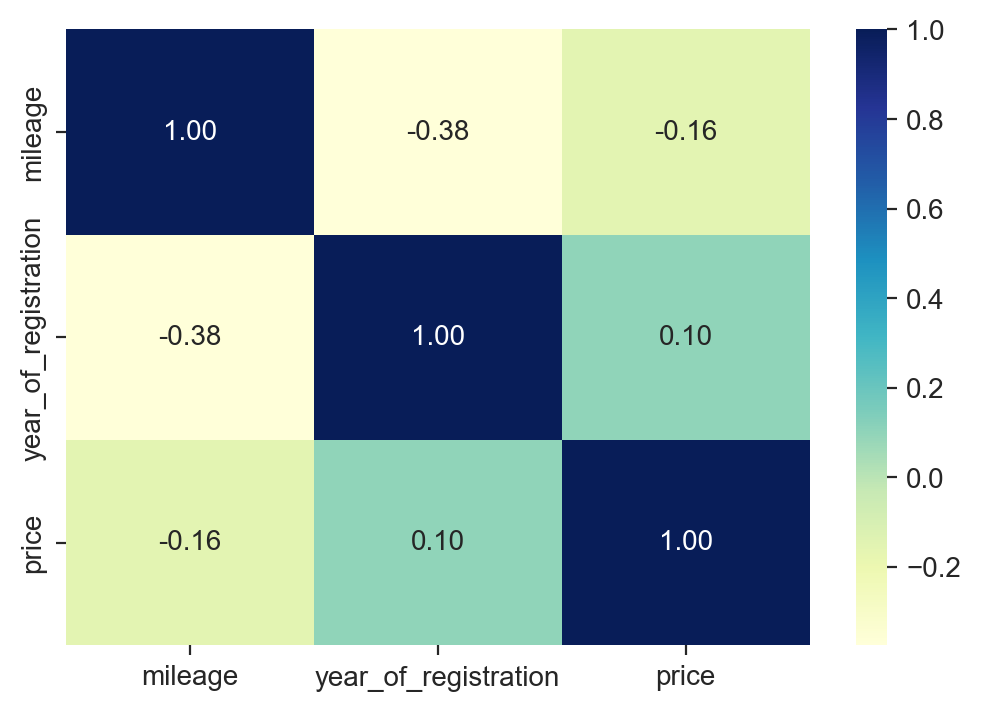

In [211]:
num_feat = ['mileage', 'year_of_registration', 'price']
plt.subplots(figsize=(6,4))
sns.heatmap(df[num_feat].corr(), cmap='YlGnBu', annot=True, fmt='.2f')
plt.show()

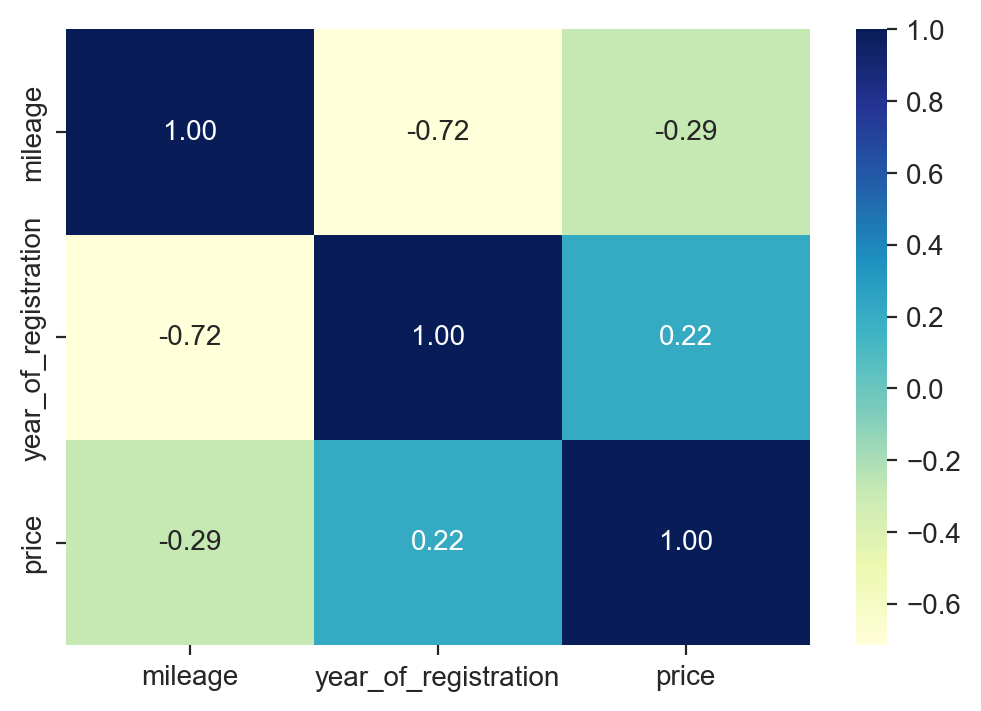

In [212]:
num_feat = ['mileage', 'year_of_registration', 'price']
plt.subplots(figsize=(6,4))
sns.heatmap(df2[num_feat].corr(), cmap='YlGnBu', annot=True, fmt='.2f')
plt.show()

After EDA the correlation between numerical columns has improved. For example the correlation between price and mileage has changes from -0.16 to -0.29, and between price and year of registration has increased from 0.1 to 0.22.

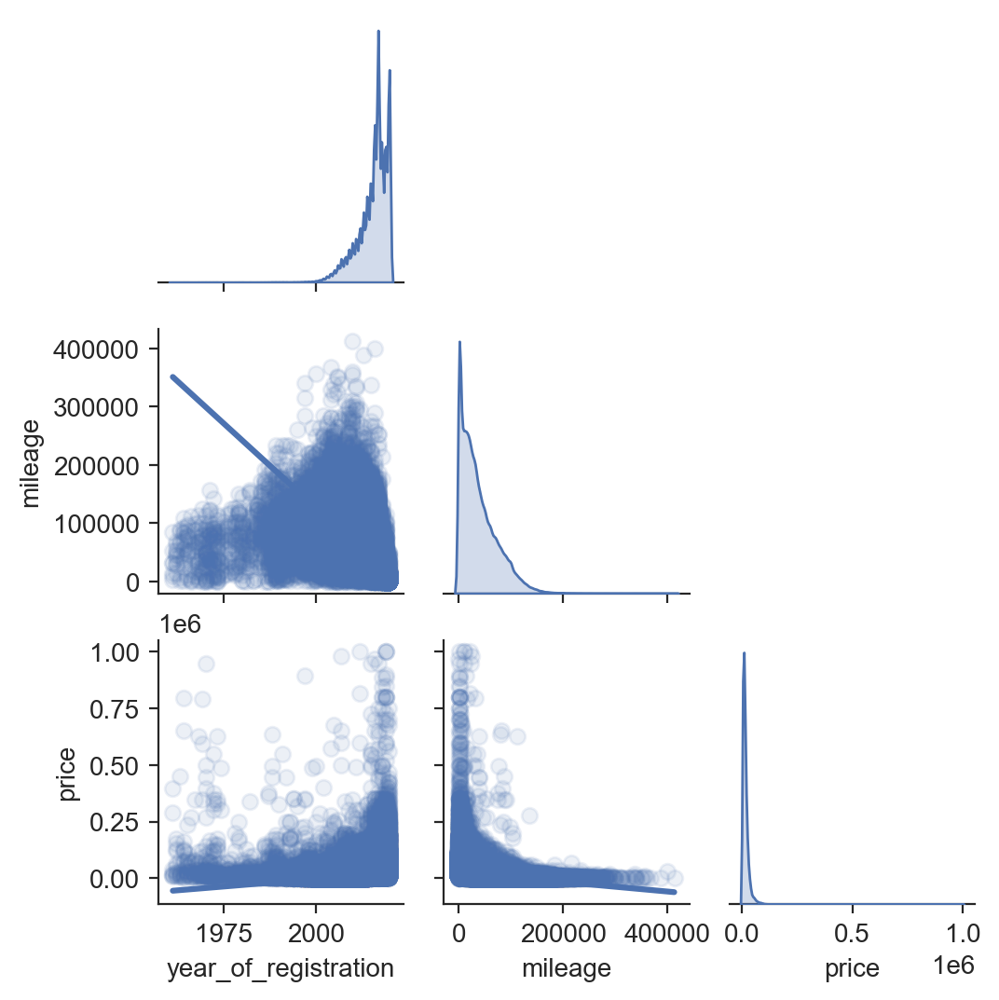

In [186]:
# Plot pairwise relationships 
num_feat = ['year_of_registration', 'mileage', 'price']
df_pairplot = df2[num_feat]
df_pairplot = df_pairplot.loc[(df_pairplot.mileage<500000) & (df_pairplot.year_of_registration>1960) & (df_pairplot.price<1000000)]
sns.pairplot(data=df_pairplot, plot_kws=dict(scatter_kws=dict(alpha=0.1)), height=1.8, corner=True, kind='reg', diag_kind='kde')
plt.show()

### exporting and importing data

In [141]:
#Export file as modified versions:
df2.to_csv('data/autotrader/adverts_afterEDA.csv', index=False)

In [5]:
#Importing the modified version
df2 = pd.read_csv('data/autotrader/adverts_afterEDA.csv')

# 4. Target encoding and modelling

In [6]:
seed=1

In [7]:
# dropping columns not used in target encoding and modelling
df3 = df2.drop(columns=['public_reference', 'reg_code', 'mile_per_year', 'mile_bin', 'standard_make_model'])

In [8]:
X = df3.drop(columns='price')
y = df3['price']

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed)

In [10]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((301499, 9), (100500, 9), (301499,), (100500,))

In [11]:
cat_feat = ['standard_colour', 'standard_make', 'standard_model', 'vehicle_condition', 'body_type', 'crossover_car_and_van', 'fuel_type']

In [12]:
num_feat = ['mileage', 'year_of_registration']

In [13]:
# instantiate TargetEncoder
tar_enc = TargetEncoder(target_type='continuous').set_output(transform='pandas')
# we have to use .set_output(transform='pandas') to have a DF as output

In [14]:
# fit only on training data
tar_enc.fit(X_train[cat_feat], y_train)

TargetEncoder(target_type='continuous')

In [15]:
# transform X_train[cat_feat]
X_train_enc = tar_enc.transform(X_train[cat_feat])

In [16]:
# transform X_test[cat_feat]
X_test_enc = tar_enc.transform(X_test[cat_feat])

In [17]:
X_train = pd.concat([X_train_enc, X_train[num_feat]], axis=1)
X_test = pd.concat([X_test_enc, X_test[num_feat]], axis=1)

In [18]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((301499, 9), (100500, 9), (301499,), (100500,))

In [19]:
X = pd.concat([X_train, X_test], axis=0)
y = pd.concat([y_train, y_test], axis=0)
X.shape, y.shape

((401999, 9), (401999,))

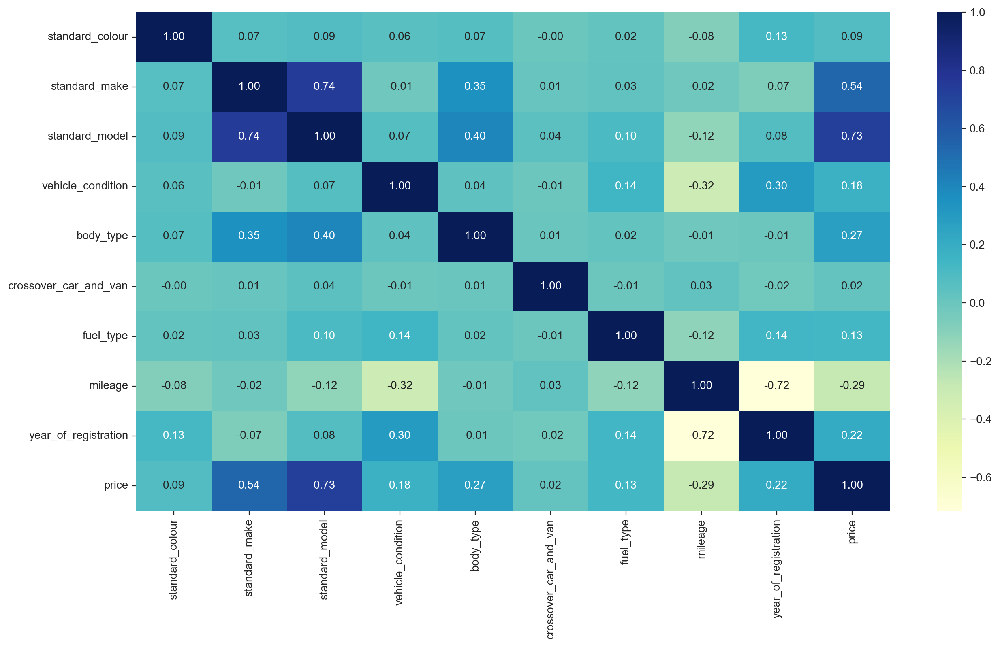

In [20]:
# Investigating correlation of the features after target encoding 
all_data_enc = pd.concat([X, y], axis=1)
plt.subplots(figsize=(15,8))
sns.heatmap(all_data_enc.corr(), cmap='YlGnBu', annot=True, fmt='.2f')
plt.show()

### scaling: standardization and normalization

In [21]:
# Scaling the X predictors, StandardScaler (standardization)
standard_scaler = StandardScaler().set_output(transform='pandas') # instantiate scaler
X_train_scaled_standard  = standard_scaler.fit_transform(X_train) # fit and transform scaler to the training data
X_test_scaled_standard  = standard_scaler.transform(X_test) # only transform scaler to the test data
# concatenating X_train_scaled and X_test_scaled
X_scaled_standard = pd.concat([X_train_scaled_standard, X_test_scaled_standard], axis=0)

In [22]:
# Scaling the X predictors, MinMaxScaler (normalization)
normal_scaler = MinMaxScaler().set_output(transform='pandas') # instantiate scaler
X_train_scaled_normal  = normal_scaler.fit_transform(X_train) # fit and transform scaler to the training data
X_test_scaled_normal  = normal_scaler.transform(X_test) # only transform scaler to the test data
# concatenating X_train_scaled and X_test_scaled
X_scaled_normal = pd.concat([X_train_scaled_normal, X_test_scaled_normal], axis=0)

### Effect of scaling on the data

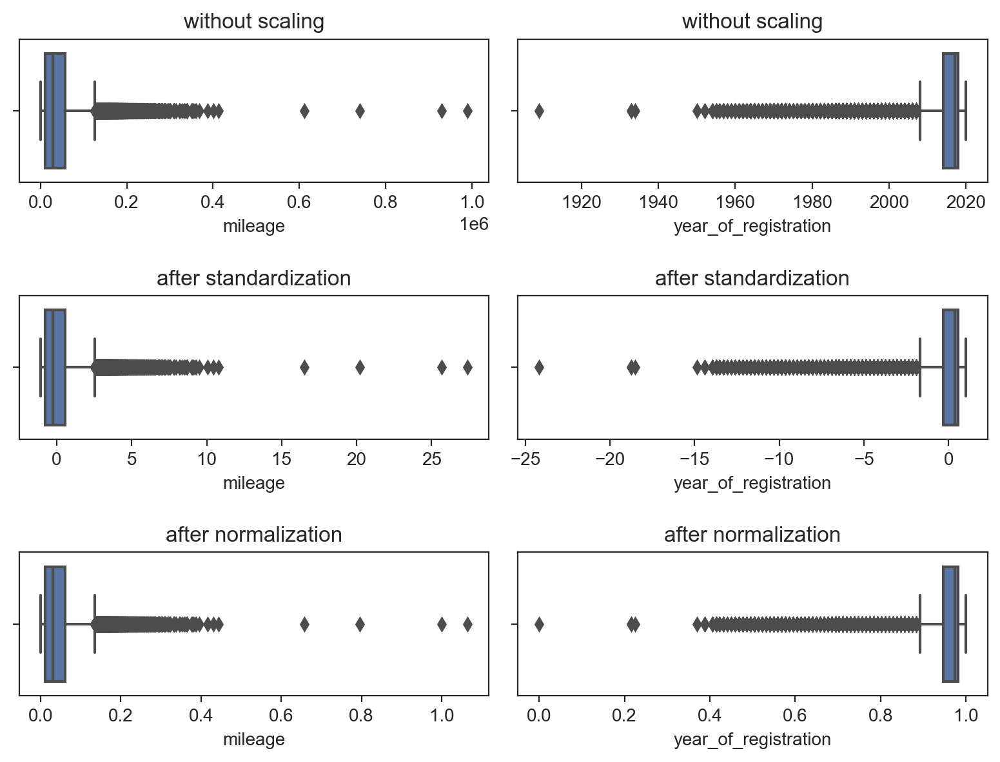

In [247]:
plt.figure(figsize = (8, 6))

plt.subplot(3,2,1)
sns.boxplot(data=df2, x='mileage')
plt.title('without scaling')

plt.subplot(3,2,2)
sns.boxplot(data=df2, x='year_of_registration')
plt.title('without scaling')

plt.subplot(3,2,3)
sns.boxplot(data=pd.concat([X_scaled_standard, y], axis=1), x='mileage')
plt.title('after standardization')

plt.subplot(3,2,4)
sns.boxplot(data=pd.concat([X_scaled_standard, y], axis=1), x='year_of_registration')
plt.title('after standardization')

plt.subplot(3,2,5)
sns.boxplot(data=pd.concat([X_scaled_normal, y], axis=1), x='mileage')
plt.title('after normalization')

plt.subplot(3,2,6)
sns.boxplot(data=pd.concat([X_scaled_normal, y], axis=1), x='year_of_registration')
plt.title('after normalization')

plt.tight_layout(h_pad=2)
plt.show()

Standardization transforms the data so that the scale is the same for all columns. For standardization at first we should subtract the mean of each column from each element, and then divide the result by standard deviation of that column.

Normalization brings all data between 0 and 1. For normalization at first we should subtract the minimum of each column from each element, and then divide the result by the difference between maximum and minimum of that column.

As we see in the above figure, the data range is very diverse without scaling, but after standardization they will have the same scale (whether positive or negative), and after normalization they will fall between 0 and 1.

### modelling

### Defining functions for fitting the models and evaluation

In [5]:
# Create function to evaluate the model
def show_scores(model, X_train, y_train):
    
    """ This function calculates r_squared, MAE and RMSE for training and test datasets """
    
    train_preds = model.predict(X_train)
    test_preds = model.predict(X_test)
    
    scores = {"Training R^2": round(model.score(X_train, y_train), 4), #or: "Training R^2": r2_score (y_train, train_preds)
              "Test R^2": round(model.score(X_test, y_test), 4), #or: "Test R^2": r2_score (y_test, test_preds)
              "Training MAE": round(mean_absolute_error(y_train, train_preds), 4),
              "Test MAE": round(mean_absolute_error(y_test, test_preds), 4),
              "Training RMSE": round(np.sqrt(mean_squared_error(y_train, train_preds)), 4),
              "Test RMSE": round(np.sqrt(mean_squared_error(y_test, test_preds)), 4)}
    
    return pd.DataFrame(scores, index=['Score'])

In [6]:
# Create function to evaluate the model using cross validation
def show_scores_cv(model, X_train, y_train):
    
    """ This function calculates training and test cross validated r_squared, MAE and RMSE """
    
    seed = 1
    np.random.seed(seed)
    
    r2_cv_scores = cross_validate(model, X_train, y_train, cv=KFold(5, random_state=seed, shuffle=True), 
                                  return_train_score=True)
    mae_cv_scores = cross_validate(model, X_train, y_train, cv=KFold(5, random_state=seed, shuffle=True), 
                                   return_train_score=True, scoring='neg_mean_absolute_error')
    rmse_cv_scores = cross_validate(model, X_train, y_train, cv=KFold(5, random_state=seed, shuffle=True), 
                                    return_train_score=True, scoring='neg_root_mean_squared_error')

    cv_scores = {"Cross Val Training R^2": [round(r2_cv_scores['train_score'].mean(), 4)],
                 "Cross Val Test R^2": [round(r2_cv_scores['test_score'].mean(), 4)],
                 "Cross Val Training MAE": [round(-mae_cv_scores['train_score'].mean(), 4)],
                 "Cross Val Test MAE": [round(-mae_cv_scores['test_score'].mean(), 4)],
                 "Cross Val Training RMSE": [round(-rmse_cv_scores['train_score'].mean(), 4)],
                 "Cross Val Test RMSE": [round(-rmse_cv_scores['test_score'].mean(), 4)]}

    return pd.DataFrame(cv_scores, index=['Score'])

In [7]:
def fit_eval(model, X_train, X_train_scaled_standard, X_train_scaled_normal, y_train):
   
    """ This function fits and evaluates the model """

    seed=1
    np.random.seed(seed)
    splits = 5

    X_train_all = [X_train, X_train_scaled_standard, X_train_scaled_normal]
    mean_r2_scores_train = []
    mean_r2_scores_test = []
    mean_mae_scores_train = []
    mean_mae_scores_test = []
    mean_rmse_scores_train = []
    mean_rmse_scores_test = []

    for i in range(len(X_train_all)):
        model.fit(X_train_all[i], y_train)
       
        r2_scores = cross_validate(model, X_train_all[i], y_train, cv=KFold(n_splits=splits, random_state=seed, 
                                        shuffle=True), return_train_score=True) #default is r2
        mae_scores = cross_validate(model, X_train_all[i], y_train, cv=KFold(n_splits=splits, random_state=seed, 
                                        shuffle=True), scoring='neg_mean_absolute_error', return_train_score=True)
        rmse_scores = cross_validate(model, X_train_all[i], y_train, cv=KFold(n_splits=splits, random_state=seed, 
                                        shuffle=True), scoring='neg_root_mean_squared_error', return_train_score=True)
        
        mean_r2_scores_train.append(round(r2_scores['train_score'].mean(), 4))
        mean_r2_scores_test.append(round(r2_scores['test_score'].mean(), 4))
        
        mean_mae_scores_train.append(round(-mae_scores['train_score'].mean(), 4))
        mean_mae_scores_test.append(round(-mae_scores['test_score'].mean(), 4))
        
        mean_rmse_scores_train.append(round(-rmse_scores['train_score'].mean(), 4))
        mean_rmse_scores_test.append(round(-rmse_scores['test_score'].mean(), 4))

    eval_df = pd.DataFrame(data={'Cross Val Training R^2': mean_r2_scores_train, 
                                 'Cross Val Test R^2': mean_r2_scores_test, 
                                 'Cross Val Training MAE': mean_mae_scores_train, 
                                 'Cross Val Test MAE': mean_mae_scores_test,
                                 'Cross Val Training RMSE': mean_rmse_scores_train, 
                                 'Cross Val Test RMSE': mean_rmse_scores_test}, 
                                  index = ['Original','Standardized', 'Normalized'])
    return eval_df

## Fitting and evaluation of models

### knnr - normal and scaled data

In [511]:
knnr = KNeighborsRegressor(n_jobs=-1)
knnr.fit(X_train, y_train)

KNeighborsRegressor(n_jobs=-1)

In [512]:
show_scores(knnr, X_train, y_train)

,Training R^2,Test R^2,Training MAE,Test MAE,Training RMSE,Test RMSE
Score,0.8353,0.7261,2413.9206,2955.0511,10506.4125,13499.2405


In [513]:
fit_eval(knnr, X_train, X_train_scaled_standard, X_train_scaled_normal, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Original,0.8244,0.7304,2449.0989,3022.6511,10840.8635,13389.0615
Standardized,0.8216,0.7353,2004.9405,2485.8504,10920.9620,13224.3813
Normalized,0.7981,0.6755,2291.5722,2865.7015,11625.0124,14682.8844


### knnr hyperparameter tuning - normal data

In [450]:
# defaults: n_neighbors=5, leaf_size=30
param_grid = {'n_neighbors' : np.linspace(3, 20, 18, dtype=int),
              'leaf_size': [10,20,30,40,50]}

In [451]:
knnr = KNeighborsRegressor(n_jobs=-1)
knnr_gs = GridSearchCV(knnr, param_grid, return_train_score=True, cv=KFold(5, random_state=seed, shuffle=True))

In [452]:
%%time
knnr_gs_results = knnr_gs.fit(X_train, y_train)

CPU times: total: 8min 57s
Wall time: 52min 2s


In [453]:
knnr_gs_df = pd.DataFrame(knnr_gs_results.cv_results_)

In [454]:
knnr_gs_df.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_leaf_size', 'param_n_neighbors', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score'],
      dtype='object')

In [471]:
(
    knnr_gs_df[['param_n_neighbors', 'param_leaf_size',
    'mean_train_score', 'std_train_score',
    'mean_test_score', 'std_test_score', 'rank_test_score']]
    .sort_values('rank_test_score')
).head(20)

,param_n_neighbors,param_leaf_size,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
41,8,30,0.788843,0.008816,0.743690,0.058875,1
59,8,40,0.788843,0.008816,0.743690,0.058875,1
77,8,50,0.788843,0.008816,0.743690,0.058875,1
23,8,20,0.788846,0.008812,0.743685,0.058888,4
5,8,10,0.788841,0.008817,0.743676,0.058889,5
58,7,40,0.794823,0.010200,0.743637,0.059016,6
76,7,50,0.794823,0.010200,0.743637,0.059016,6
40,7,30,0.794823,0.010200,0.743637,0.059016,6
4,7,10,0.794817,0.010182,0.743629,0.059027,9
22,7,20,0.794823,0.010190,0.743602,0.059013,10


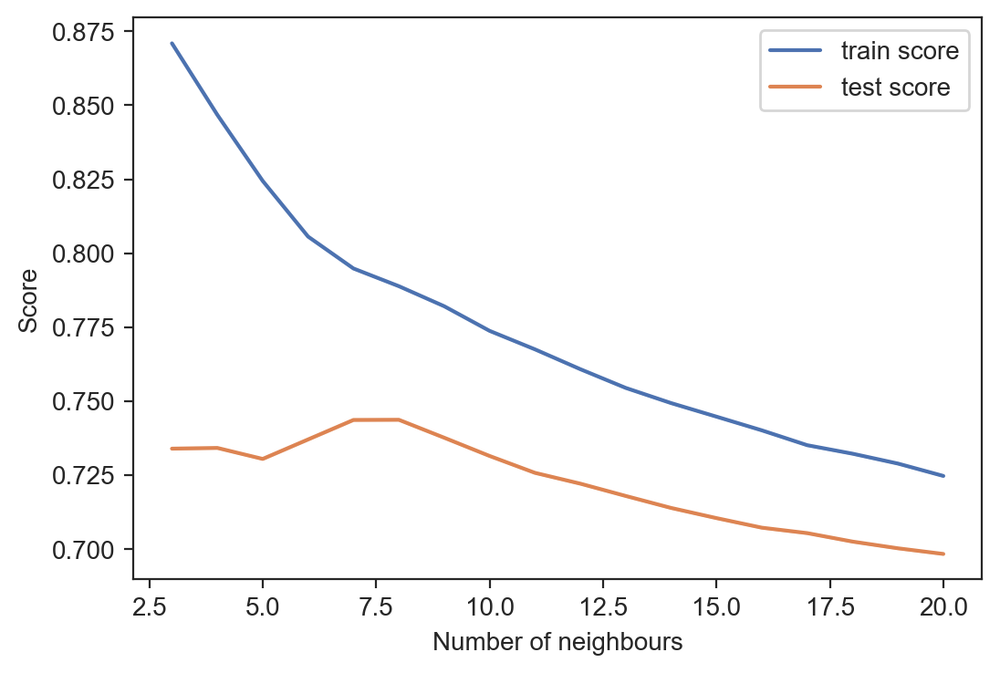

In [802]:
sns.lineplot(data=knnr_gs_df, x='param_n_neighbors', y='mean_train_score', label='train score')
sns.lineplot(data=knnr_gs_df, x='param_n_neighbors', y='mean_test_score', label='test score')
plt.xlabel('Number of neighbours')
plt.ylabel('Score')
plt.legend()
plt.show()

In [1047]:
knnr_gs_results.best_params_

{'leaf_size': 30, 'n_neighbors': 8}

In [29]:
knnr_best = KNeighborsRegressor(n_neighbors=8, n_jobs=-1)

In [30]:
knnr_best.fit(X_train, y_train)

KNeighborsRegressor(n_jobs=-1, n_neighbors=8)

In [474]:
show_scores_cv(knnr_best, X_train, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.7888,0.7437,2632.4233,2990.4984,11894.9833,13050.4869


We see a little improvement in the test results compared with model without hyperparameter tuning:
* Cross validated test R^2 changed from 0.7304 to 0.7437
* Cross validated test MAE changed from 3022 to 2990
* Cross validated test RMSE changed from 13389 to 13050

In [31]:
# cross validation the best model over the entire data
knnr_best_results = show_scores_cv(knnr_best, X, y)
knnr_best_results

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.781,0.7279,2589.7703,2942.4542,12099.0146,13383.673


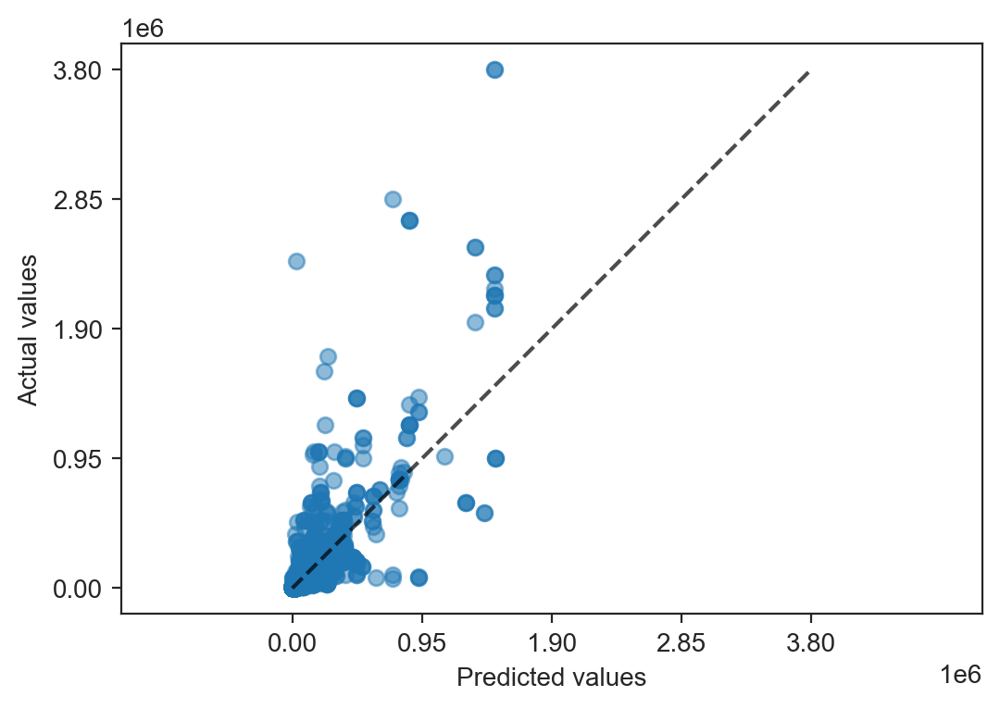

In [1253]:
PredictionErrorDisplay.from_estimator(
    knnr_best, X, y, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample=0.9999)
plt.show()

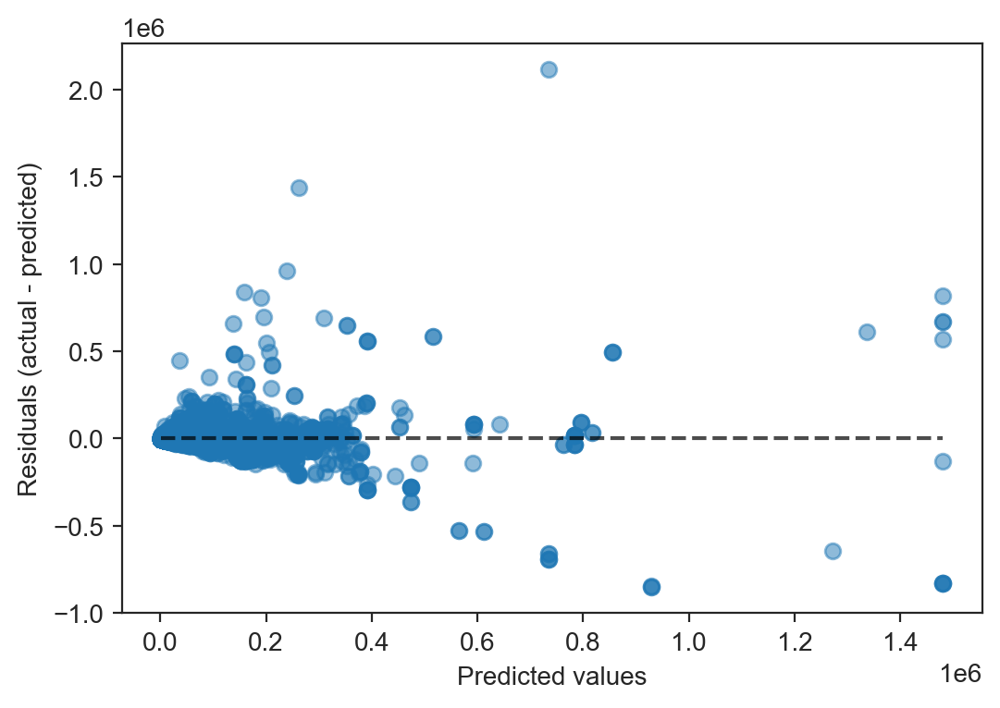

In [1254]:
PredictionErrorDisplay.from_estimator(
    knnr_best, X, y, kind="residual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample=0.9999)
plt.show()

### knnr - fine-grained evaluation

In [1337]:
knnr_y_pred = pd.DataFrame(knnr_best.predict(X)).rename(columns={0: 'knnr_y_pred'})

In [1357]:
knnr_df = pd.concat([df2, knnr_y_pred], axis=1)

In [1358]:
knnr_df = knnr_df.drop(columns=['mile_per_year', 'standard_make_model', 'public_reference', 'reg_code', 'crossover_car_and_van'])

In [1359]:
knnr_df['error_pct'] = (abs(knnr_df['price'] - knnr_df['knnr_y_pred']) / knnr_df['price'] *100).round(0)
knnr_df.head()

,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,fuel_type,mile_bin,knnr_y_pred,error_pct
0,0.0,Grey,Volvo,XC90,NEW,2020,73970,SUV,Petrol Plug-in Hybrid,0-100,6441.375,91.0
1,108230.0,Blue,Jaguar,XF,USED,2011,7000,Saloon,Diesel,100k-150k,3628.250,48.0
2,7800.0,Grey,SKODA,Yeti,USED,2017,14000,SUV,Petrol,5k-10k,9018.125,36.0
3,45000.0,Brown,Vauxhall,Mokka,USED,2016,7995,Hatchback,Diesel,40k-50k,14891.625,86.0
4,64000.0,Grey,Land Rover,Range Rover Sport,USED,2015,26995,SUV,Diesel,50k-75k,43977.375,63.0


In [1360]:
knnr_df.loc[knnr_df.error_pct>40000]

,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,fuel_type,mile_bin,knnr_y_pred,error_pct
496,110526.0,Blue,Citroen,Xsara Picasso,USED,2005,990,MPV,Diesel,100k-150k,796471.250,80352.0
17841,124000.0,Silver,SKODA,Fabia,USED,2008,799,Hatchback,Petrol,100k-150k,377448.125,47140.0
21232,49000.0,White,Toyota,AYGO,USED,2012,1995,Hatchback,Petrol,40k-50k,928056.250,46419.0
29078,69900.0,Black,Smart,Roadster,USED,2004,3000,Convertible,Petrol,50k-75k,1271208.750,42274.0
62582,98000.0,Blue,Citroen,Xsara Picasso,USED,2004,799,MPV,Diesel,75k-100k,355598.750,44405.0
75731,81000.0,White,Fiat,500,USED,2011,2695,Hatchback,Petrol,75k-100k,1480578.125,54838.0
116308,128000.0,Silver,Citroen,Xsara Picasso,USED,2002,200,MPV,Diesel,100k-150k,83211.875,41506.0


In [1545]:
knnr_error_vehicle_cond = knnr_df.groupby('vehicle_condition')[['error_pct']].mean().reset_index()
knnr_error_vehicle_cond

,vehicle_condition,error_pct
0,NEW,64.588275
1,USED,175.893794


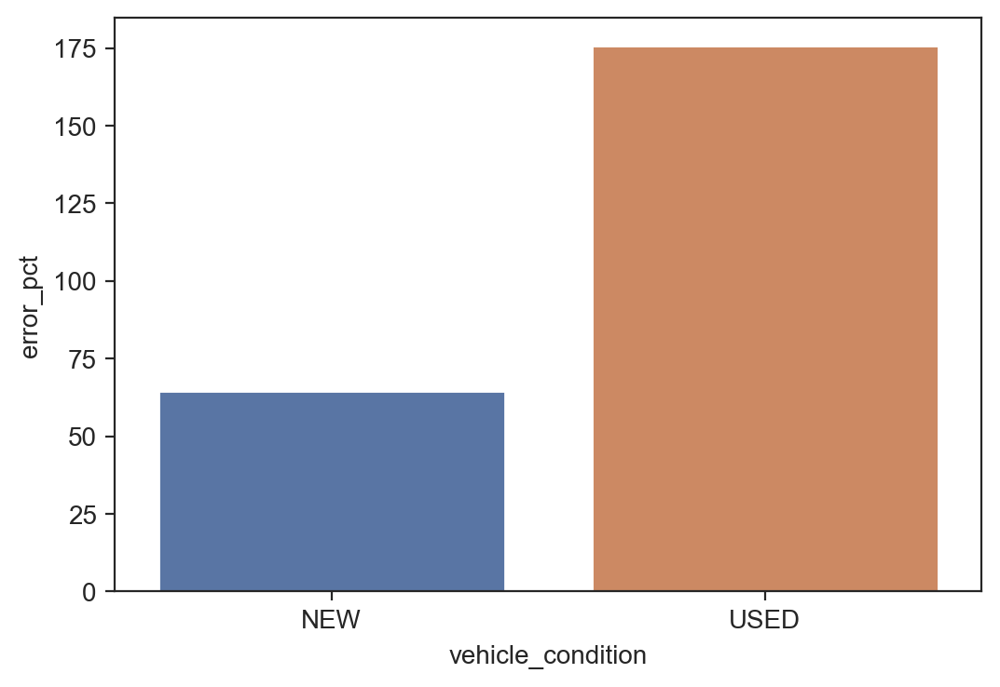

In [1534]:
sns.barplot(data=knnr_error_vehicle_cond, x='vehicle_condition', y='error_pct')
plt.show()

In [1372]:
knnr_error_yor = knnr_df.groupby('year_of_registration')[['error_pct']].mean()\
    .reset_index().sort_values('year_of_registration', ascending=False)
knnr_error_yor.head()

,year_of_registration,error_pct
71,2020,65.045758
70,2019,69.494273
69,2018,80.780935
68,2017,84.325227
67,2016,95.557846


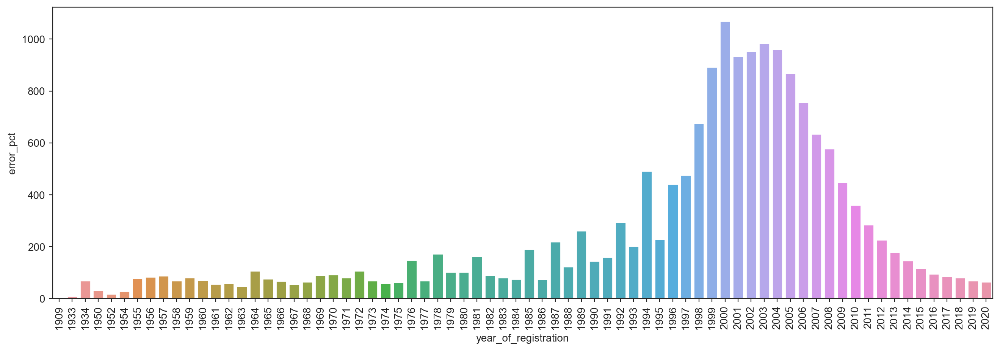

In [1377]:
plt.subplots(figsize=(16,5))
plot = sns.barplot(data=knnr_error_yor, x='year_of_registration', y='error_pct')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

In [1395]:
knnr_error_mile_bin = knnr_df.groupby('mile_bin')[['error_pct']].mean().reset_index().sort_values('mile_bin')
knnr_error_mile_bin = knnr_error_mile_bin.reindex([0,1,11,5,13,3,7,9,10,12,14,2,4,6,8])
knnr_error_mile_bin

,mile_bin,error_pct
0,0-100,65.408082
1,100-500,69.513696
11,500-1k,69.457680
5,1k-5k,70.241467
13,5k-10k,76.818406
3,10k-20k,85.181467
7,20k-30k,97.406551
9,30k-40k,114.991707
10,40k-50k,146.342475
12,50k-75k,218.766145


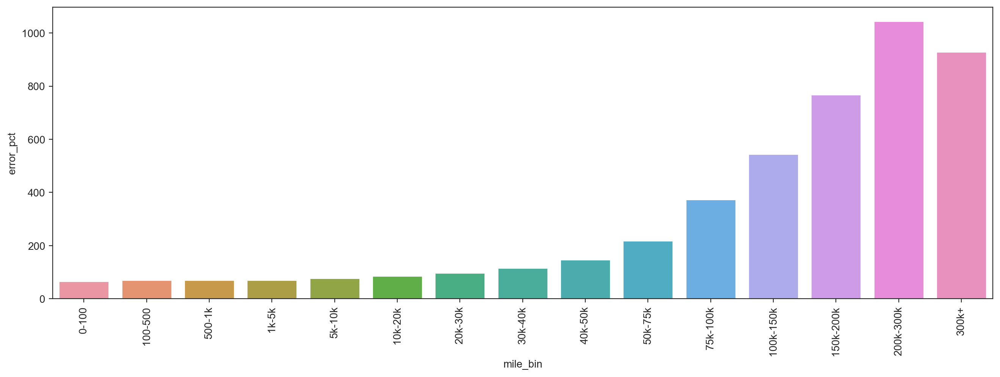

In [1396]:
plt.subplots(figsize=(16,5))
plot = sns.barplot(data=knnr_error_mile_bin, x='mile_bin', y='error_pct')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

In [1100]:
print(knnr_df.error_pct.mean().round())
print(len(knnr_df.loc[knnr_df.error_pct>25]))
print(len(knnr_df.loc[knnr_df.error_pct>50]))

167.0
324775
245426


In [1153]:
df_error_make = knnr_df.groupby('standard_make')[['error_pct']].mean().round().sort_values('standard_make', ascending=True)
df_error_make = df_error_make.reset_index()
df_error_make.head()

,standard_make,error_pct
0,AC,96.0
1,AK,85.0
2,Abarth,92.0
3,Aixam,266.0
4,Alfa Romeo,192.0


In [1154]:
df_count_make = pd.DataFrame(knnr_df.standard_make.value_counts()).sort_values('standard_make')
df_count_make = df_count_make.reset_index()
df_count_make = df_count_make.rename(columns={'count': 'counts'})
df_count_make.head()

,standard_make,counts
0,AC,3
1,AK,1
2,Abarth,1165
3,Aixam,2
4,Alfa Romeo,1617


In [1155]:
df_error_make ['counts'] = df_count_make['counts']
df_error_make.head()

,standard_make,error_pct,counts
0,AC,96.0,3
1,AK,85.0,1
2,Abarth,92.0,1165
3,Aixam,266.0,2
4,Alfa Romeo,192.0,1617


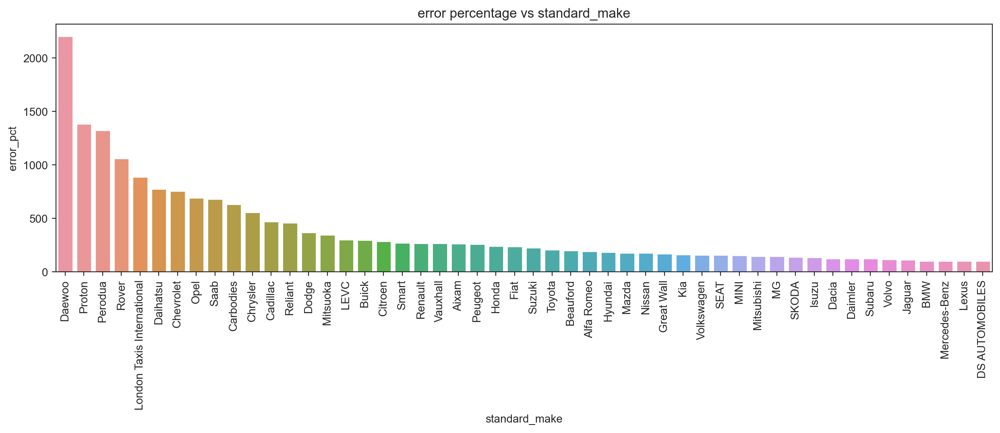

In [1165]:
fix, ax = plt.subplots(figsize=(15,4))
plot = sns.barplot(data=df_error_make.sort_values('error_pct', ascending=False).head(50), x='standard_make', y='error_pct')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('error percentage vs standard_make')
plt.show()

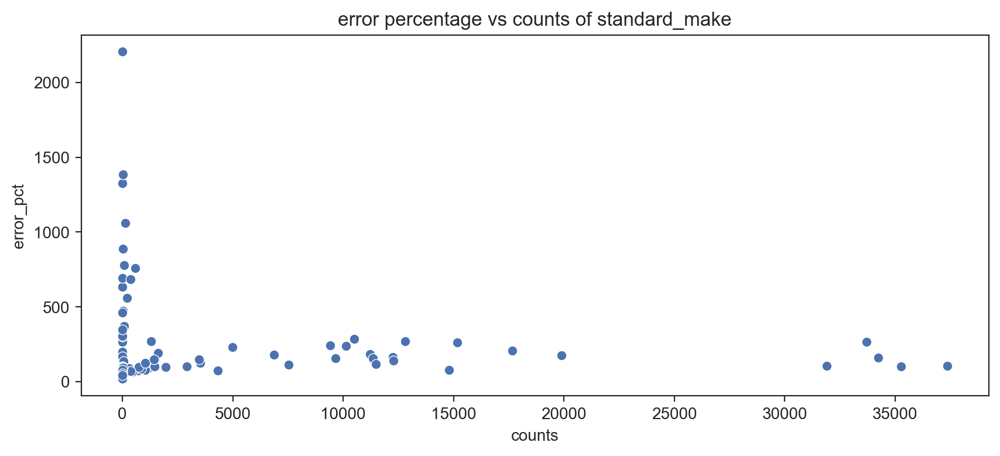

In [1174]:
fix, ax = plt.subplots(figsize=(10,4))
plot = sns.scatterplot(data=df_error_make, x='counts', y='error_pct')
plt.title('error percentage vs counts of standard_make')
plt.show()

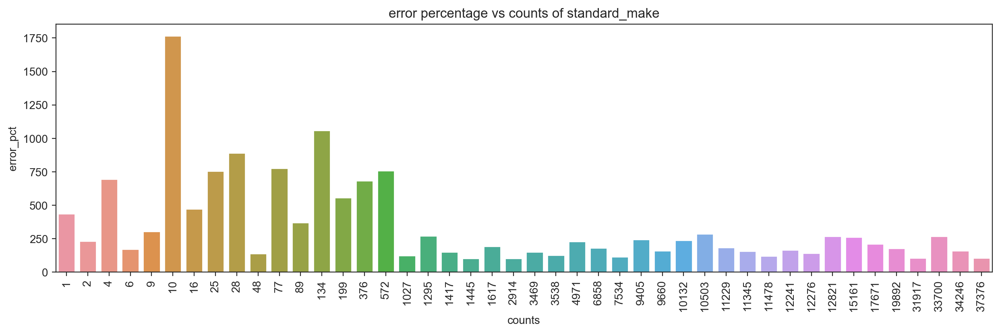

In [1185]:
fix, ax = plt.subplots(figsize=(15,4))
plot = sns.barplot(data=df_error_make.sort_values('error_pct', ascending=False).head(50), x='counts', y='error_pct', errorbar=None)
plt.title('error percentage vs counts of standard_make')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

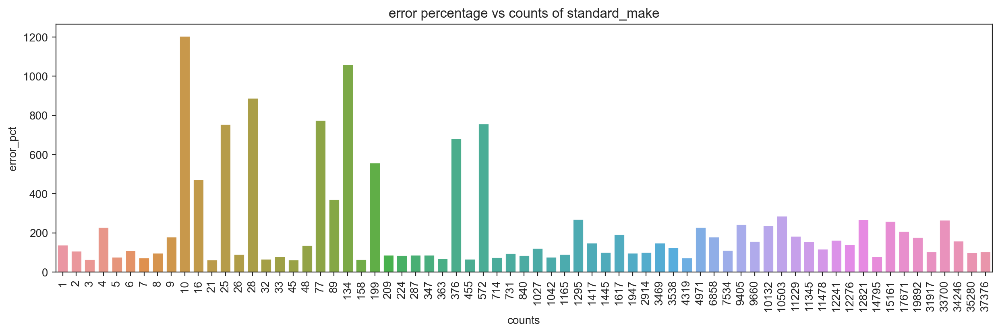

In [1184]:
fix, ax = plt.subplots(figsize=(15,4))
plot = sns.barplot(data=df_error_make, x='counts', y='error_pct', errorbar=None)
plt.title('error percentage vs counts of standard_make')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

In [1209]:
df_error_model = knnr_df.groupby('standard_model')[['error_pct']].mean().round().sort_values('standard_model', ascending=True)
df_error_model = df_error_model.reset_index()
df_error_model.head()

,standard_model,error_pct
0,1 Series,122.0
1,10,69.0
2,100,228.0
3,1000,41.0
4,1007,1604.0


In [1210]:
df_count_model = pd.DataFrame(knnr_df.standard_model.value_counts()).sort_values('standard_model')
df_count_model = df_count_model.reset_index()
df_count_model = df_count_model.rename(columns={'count': 'counts'})
df_count_model.head()

,standard_model,counts
0,1 Series,7455
1,10,1
2,100,2
3,1000,1
4,1007,20


In [1211]:
df_error_model ['counts'] = df_count_model['counts']
df_error_model.head()

,standard_model,error_pct,counts
0,1 Series,122.0,7455
1,10,69.0,1
2,100,228.0,2
3,1000,41.0,1
4,1007,1604.0,20


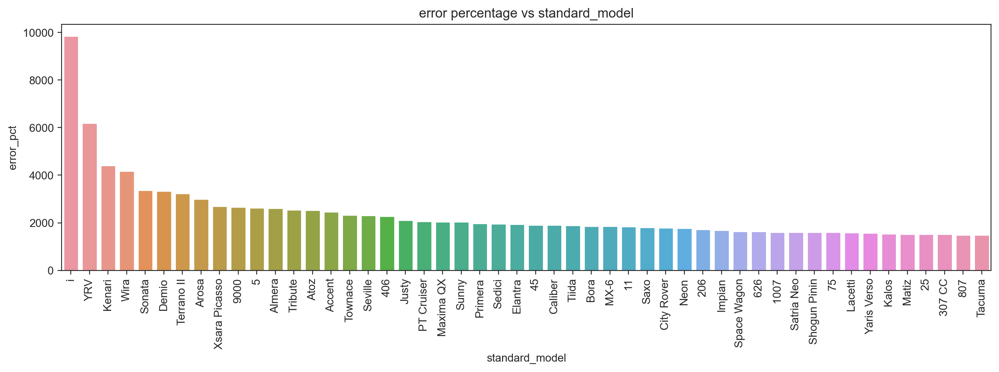

In [1201]:
fix, ax = plt.subplots(figsize=(15,4))
plot = sns.barplot(data=df_error_model.sort_values('error_pct', ascending=False).head(50), x='standard_model', y='error_pct')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('error percentage vs standard_model')
plt.show()

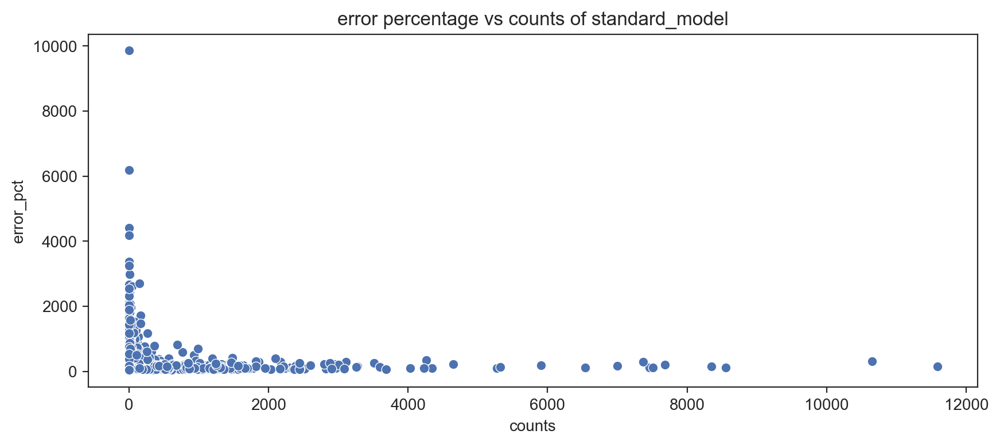

In [1202]:
fix, ax = plt.subplots(figsize=(10,4))
plot = sns.scatterplot(data=df_error_model, x='counts', y='error_pct')
plt.title('error percentage vs counts of standard_model')
plt.show()

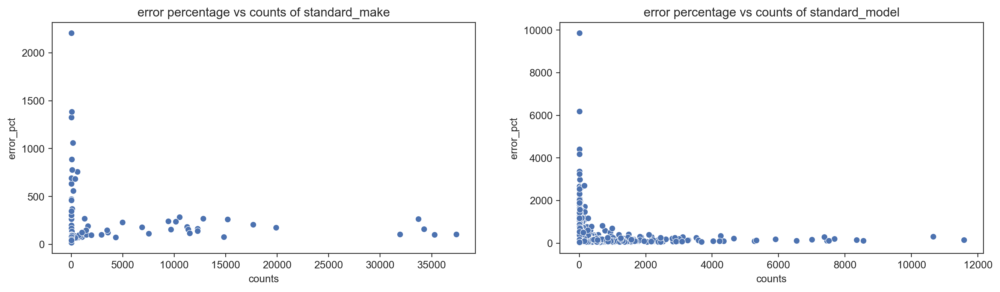

In [1206]:
fig, axs = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(data=df_error_make, x='counts', y='error_pct', ax=axs[0])
sns.scatterplot(data=df_error_model, x='counts', y='error_pct', ax=axs[1])
axs[0].title.set_text('error percentage vs counts of standard_make')
axs[1].title.set_text('error percentage vs counts of standard_model')
plt.show()

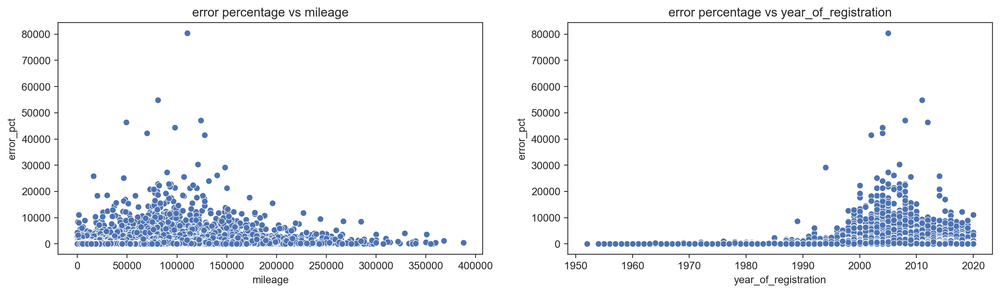

In [1217]:
fig, axs = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(data=knnr_df.loc[knnr_df.mileage<400000], x='mileage', y='error_pct', ax=axs[0])
sns.scatterplot(data=knnr_df.loc[knnr_df.year_of_registration>1950], x='year_of_registration', y='error_pct', ax=axs[1])
axs[0].title.set_text('error percentage vs mileage')
axs[1].title.set_text('error percentage vs year_of_registration')
plt.show()

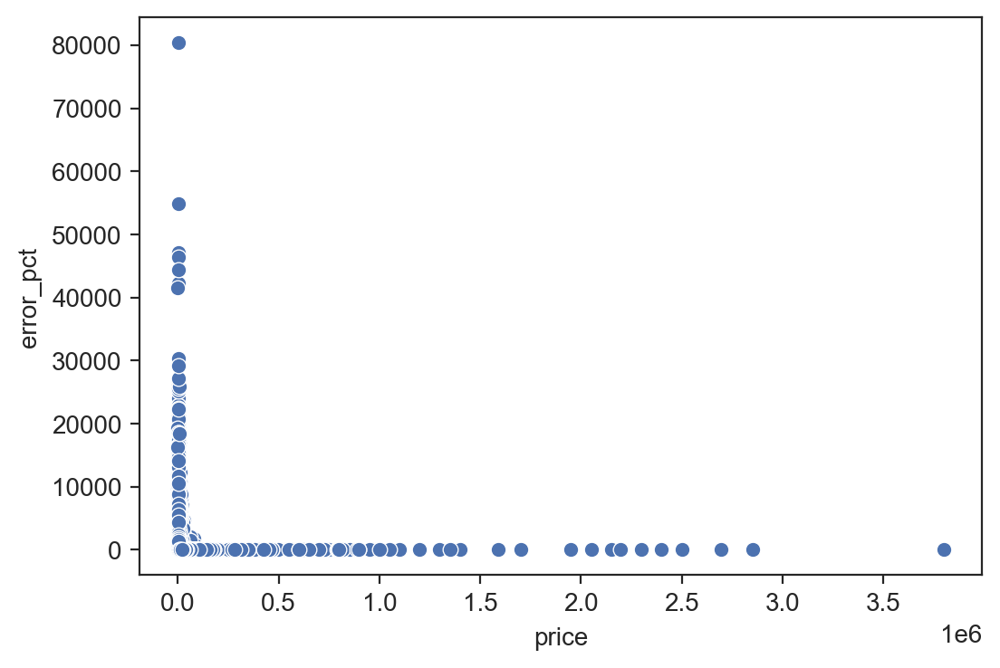

In [1223]:
sns.scatterplot(data=knnr_df, x='price', y='error_pct')
plt.show()

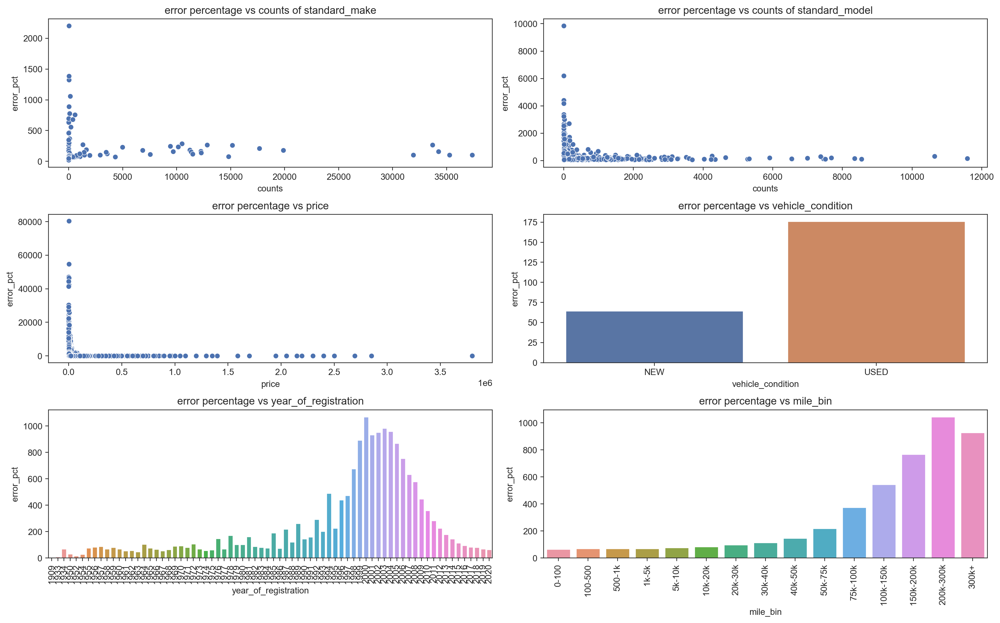

In [1453]:
plt.figure(figsize=(16,10))

plt.subplot(3,2,1)
sns.scatterplot(data=df_error_make, x='counts', y='error_pct')
plt.title("error percentage vs counts of standard_make")

plt.subplot(3,2,2)
sns.scatterplot(data=df_error_model, x='counts', y='error_pct')
plt.title("error percentage vs counts of standard_model")

plt.subplot(3,2,3)
sns.scatterplot(data=knnr_df, x='price', y='error_pct')
plt.title("error percentage vs price")

plt.subplot(3,2,4)
sns.barplot(data=knnr_error_vehicle_cond, x='vehicle_condition', y='error_pct')
plt.title("error percentage vs vehicle_condition")

plt.subplot(3,2,5)
plot = sns.barplot(data=knnr_error_yor, x='year_of_registration', y='error_pct')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title("error percentage vs year_of_registration")

plt.subplot(3,2,6)
plot = sns.barplot(data=knnr_error_mile_bin, x='mile_bin', y='error_pct')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title("error percentage vs mile_bin")

plt.tight_layout()
plt.show()

In [1550]:
def fine_grain_eval(model, X, y):  
    
    """ This function carries out fine-grained evaluation. """
    
    raw_df = pd.concat([X, y], axis=1)
    
    y_pred = pd.DataFrame(model.predict(X)).rename(columns={0: 'y_pred'})

    model_df = pd.concat([raw_df, y_pred], axis=1)

    model_df['error_pct'] = (abs(model_df['price'] - model_df['y_pred']) / model_df['price'] *100).round(0)
    
    model_df['mile_bin'] = df2['mile_bin']

    df_error_make = model_df.groupby('standard_make')[['error_pct']].mean().round()\
                    .sort_values('standard_make', ascending=True)
    df_error_make = df_error_make.reset_index()

    df_count_make = pd.DataFrame(model_df.standard_make.value_counts()).sort_values('standard_make')
    df_count_make = df_count_make.reset_index()
    df_count_make = df_count_make.rename(columns={'count': 'counts'})

    df_error_make ['counts'] = df_count_make['counts']

    df_error_model = model_df.groupby('standard_model')[['error_pct']].mean().round()\
                    .sort_values('standard_model', ascending=True)
    df_error_model = df_error_model.reset_index()

    df_count_model = pd.DataFrame(model_df.standard_model.value_counts()).sort_values('standard_model')
    df_count_model = df_count_model.reset_index()
    df_count_model = df_count_model.rename(columns={'count': 'counts'})

    df_error_model ['counts'] = df_count_model['counts']
    
    df_error_vehicle_cond = model_df.groupby('vehicle_condition')[['error_pct']].mean()
    df_error_vehicle_cond = df_error_vehicle_cond.reset_index()
    
    df_error_yor = model_df.groupby('year_of_registration')[['error_pct']].mean()\
    .reset_index().sort_values('year_of_registration', ascending=False)
    
    df_error_mile_bin = model_df.groupby('mile_bin')[['error_pct']].mean().reset_index().sort_values('mile_bin')
    df_error_mile_bin = df_error_mile_bin.reindex([0,1,11,5,13,3,7,9,10,12,14,2,4,6,8])

    plt.figure(figsize=(16,10))

    plt.subplot(3,2,1)
    sns.scatterplot(data=df_error_make, x='counts', y='error_pct')
    plt.title("error percentage vs counts of standard_make")

    plt.subplot(3,2,2)
    sns.scatterplot(data=df_error_model, x='counts', y='error_pct')
    plt.title("error percentage vs counts of standard_model")

    plt.subplot(3,2,3)
    sns.scatterplot(data=knnr_df, x='price', y='error_pct')
    plt.title("error percentage vs price")

    plt.subplot(3,2,4)
    plot = sns.barplot(data=df_error_vehicle_cond, x='vehicle_condition', y='error_pct')
    plot.set_xticks(plot.get_xticks(), labels=['USED','NEW'])
    plt.title("error percentage vs vehicle_condition")

    plt.subplot(3,2,5)
    plot = sns.barplot(data=df_error_yor, x='year_of_registration', y='error_pct')
    plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
    plt.title("error percentage vs year_of_registration")

    plt.subplot(3,2,6)
    plot = sns.barplot(data=df_error_mile_bin, x='mile_bin', y='error_pct')
    plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
    plt.title("error percentage vs mile_bin")

    plt.tight_layout()
    plt.show()

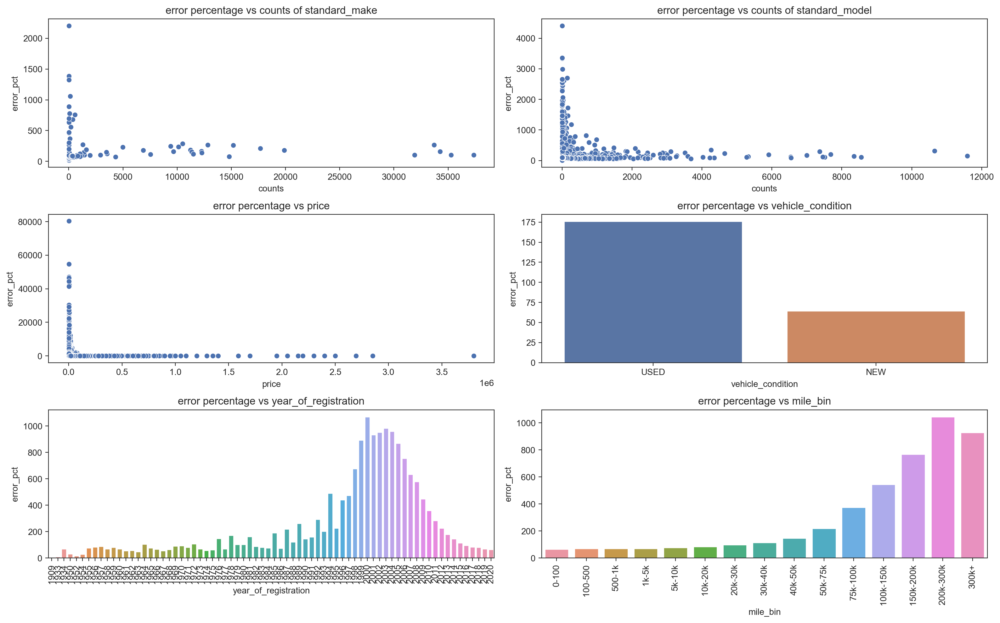

In [1552]:
fine_grain_eval(knnr_best, X, y)

### knnr hyperparameter tuning - standardized data

In [466]:
# defaults: n_neighbors=5, leaf_size=30
param_grid_scaled = {'n_neighbors' : np.linspace(3, 20, 18, dtype=int),
                     'leaf_size': [10,20,30,40,50]}

In [467]:
knnr_scaled = KNeighborsRegressor(n_jobs=-1)
knnr_gs_scaled = GridSearchCV(knnr_scaled, param_grid_scaled, return_train_score=True, cv=KFold(5, random_state=seed, shuffle=True))

In [468]:
%%time
knnr_gs_scaled_results = knnr_gs_scaled.fit(X_train_scaled_standard, y_train)

CPU times: total: 9min 9s
Wall time: 2h 54min 30s


In [469]:
knnr_gs_scaled_df = pd.DataFrame(knnr_gs_scaled_results.cv_results_)

In [476]:
(
    knnr_gs_scaled_df[['param_n_neighbors', 'param_leaf_size',
    'mean_train_score', 'std_train_score',
    'mean_test_score', 'std_test_score', 'rank_test_score']]
    .sort_values('rank_test_score')
).head(20)

,param_n_neighbors,param_leaf_size,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
19,4,20,0.842618,0.016115,0.736045,0.062852,1
73,4,50,0.842615,0.016137,0.736035,0.062829,2
37,4,30,0.842615,0.016137,0.736035,0.062829,2
55,4,40,0.842615,0.016137,0.736035,0.062829,2
1,4,10,0.842589,0.016111,0.735955,0.062902,5
2,5,10,0.821591,0.016858,0.735424,0.059437,6
20,5,20,0.821587,0.016852,0.735276,0.059474,7
74,5,50,0.821581,0.016861,0.735269,0.059472,8
38,5,30,0.821581,0.016861,0.735269,0.059472,8
56,5,40,0.821581,0.016861,0.735269,0.059472,8


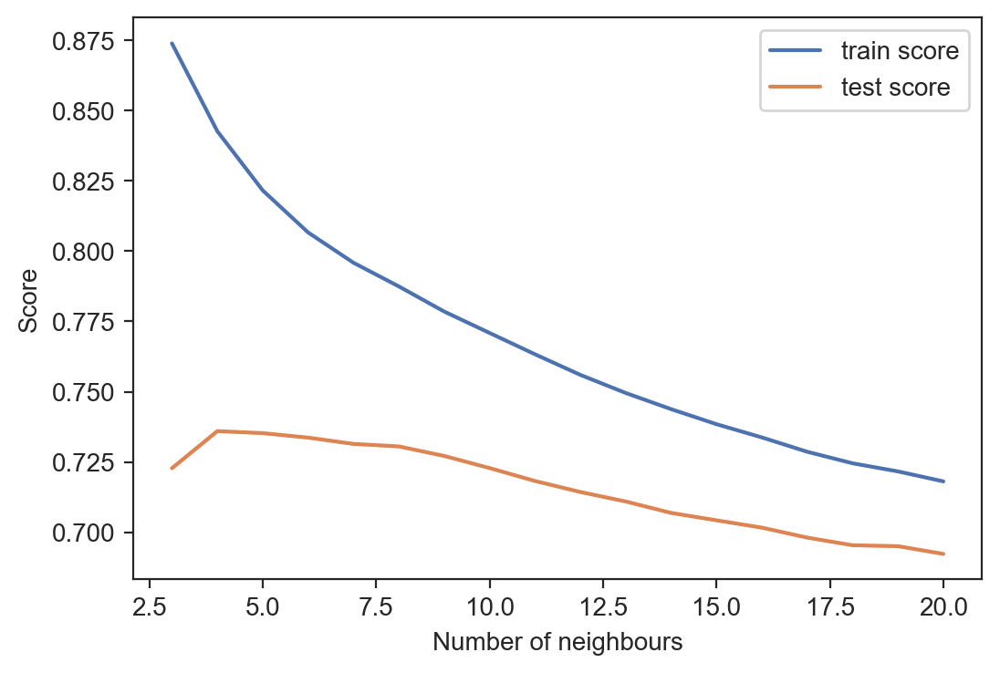

In [803]:
sns.lineplot(data=knnr_gs_scaled_df, x='param_n_neighbors', y='mean_train_score', label='train score')
sns.lineplot(data=knnr_gs_scaled_df, x='param_n_neighbors', y='mean_test_score', label='test score')
plt.xlabel('Number of neighbours')
plt.ylabel('Score')
plt.legend()
plt.show()

In [478]:
knnr_gs_scaled_results.best_params_

{'leaf_size': 20, 'n_neighbors': 4}

For cases with n_neighbors = 4 or 5 the difference between train and test scores is around 0.1 which is a little high. 
So I choose n_neighbors = 6 and leaf_size = 30 (which is the default leaf_size amount) as the best hyperparameters, as the above-mentioned difference is 0.07 which seem acceptable.

In [32]:
knnr_best_scaled = KNeighborsRegressor(n_neighbors=6, n_jobs=-1)

In [33]:
knnr_best_scaled.fit(X_train_scaled_standard, y_train)

KNeighborsRegressor(n_jobs=-1, n_neighbors=6)

In [481]:
show_scores_cv(knnr_best_scaled, X_train_scaled_standard, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.8066,0.7337,2084.6436,2492.5567,11375.302,13262.7196


We observe no considerable change in the test results compared with standardized model without hyperparameter tuning:
* Cross validated test R^2 changed from 0.7353 to 0.7337
* Cross validated test MAE changed from 2485 to 2492
* Cross validated test RMSE changed from 13224 to 13262

In [34]:
# cross validation the best model over the entire data
knnr_best_scaled_results = show_scores_cv(knnr_best_scaled, X_scaled_standard, y)
knnr_best_scaled_results

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.813,0.7445,2015.6271,2408.5326,11179.0674,12985.8705


### knnr hyperparameter tuning - normalized data

In [593]:
# defaults: n_neighbors=5, leaf_size=30
param_grid_normal = {'n_neighbors' : np.linspace(3, 15, 13, dtype=int)}

In [594]:
knnr_normal = KNeighborsRegressor(n_jobs=-1)
knnr_gs_normal = GridSearchCV(knnr_normal, param_grid_normal, return_train_score=True, cv=KFold(5, random_state=seed, shuffle=True))

In [595]:
%%time
knnr_gs_normal_results = knnr_gs_normal.fit(X_train_scaled_normal, y_train)

CPU times: total: 1min 21s
Wall time: 51min 36s


In [596]:
knnr_gs_normal_df = pd.DataFrame(knnr_gs_normal_results.cv_results_)

In [597]:
(
    knnr_gs_normal_df[['param_n_neighbors',
    'mean_train_score', 'std_train_score',
    'mean_test_score', 'std_test_score', 'rank_test_score']]
    .sort_values('rank_test_score')
).head(20)

,param_n_neighbors,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
0,3,0.851328,0.008139,0.683254,0.055571,1
1,4,0.818547,0.008687,0.679788,0.052368,2
2,5,0.798085,0.012049,0.675462,0.053940,3
3,6,0.778469,0.013174,0.671716,0.056861,4
4,7,0.757743,0.014239,0.662669,0.057878,5
5,8,0.741095,0.014456,0.653902,0.056981,6
6,9,0.724667,0.014563,0.643536,0.055943,7
7,10,0.710312,0.014675,0.634731,0.053723,8
8,11,0.698216,0.013702,0.628766,0.054574,9
9,12,0.686326,0.012933,0.622030,0.053350,10


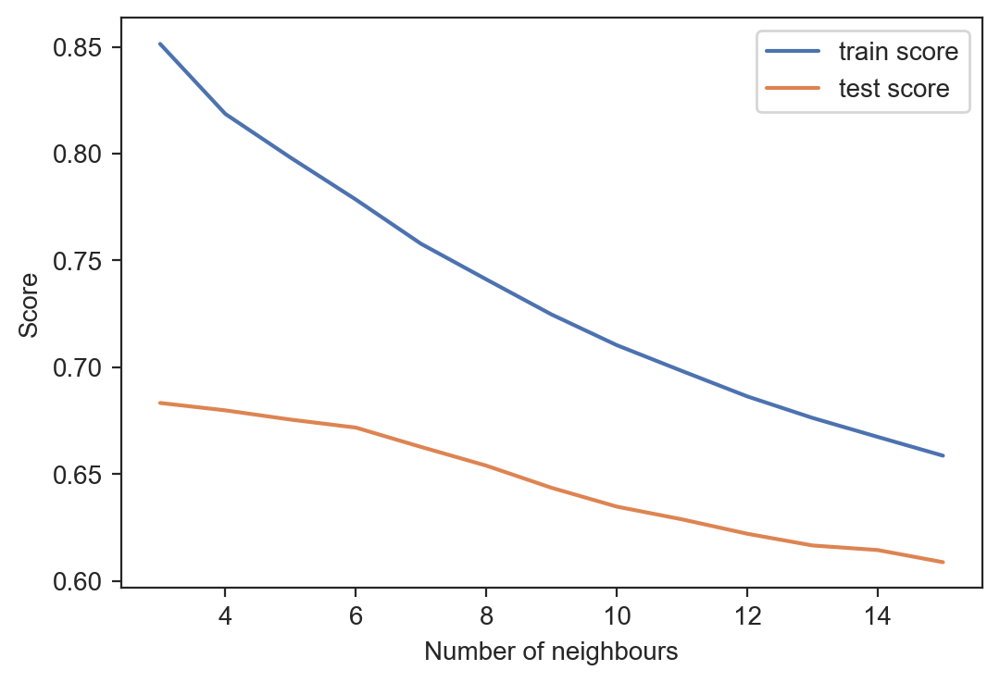

In [805]:
sns.lineplot(data=knnr_gs_normal_df, x='param_n_neighbors', y='mean_train_score', label='train score')
sns.lineplot(data=knnr_gs_normal_df, x='param_n_neighbors', y='mean_test_score', label='test score')
plt.xlabel('Number of neighbours')
plt.ylabel('Score')
plt.legend()
plt.show()

For cases with n_neighbors = 3 or 4 or 5 the difference between train and test scores is more than 0.1 which is a little high. 
So I choose n_neighbors = 6 as the best hyperparameters, as the above-mentioned difference is 0.1 which seems acceptable.

In [35]:
knnr_best_normal = KNeighborsRegressor(n_neighbors=6, n_jobs=-1)

In [36]:
knnr_best_normal.fit(X_train_scaled_normal, y_train)

KNeighborsRegressor(n_jobs=-1, n_neighbors=6)

In [600]:
show_scores_cv(knnr_best_normal, X_train_scaled_normal, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.7785,0.6717,2395.9917,2882.6479,12176.4144,14774.5413


We observe no considerable change in the test results compared with normalized model without hyperparameter tuning:

* Cross validated test R^2 changed from 0.6755 to 0.6717
* Cross validated test MAE changed from 2865 to 2882
* Cross validated test RMSE changed from 14682 to 14774

In [37]:
# cross validation the best model over the entire data
knnr_best_normal_results = show_scores_cv(knnr_best_normal, X_scaled_normal, y)
knnr_best_normal_results

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.782,0.705,2294.7297,2759.1173,12073.9463,14035.3346


In [38]:
pd.concat([knnr_best_results.rename(index={'Score': 'Original'}), 
           knnr_best_scaled_results.rename(index={'Score': 'Standardized'}),
           knnr_best_normal_results.rename(index={'Score': 'Normalized'})], axis=0)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Original,0.781,0.7279,2589.7703,2942.4542,12099.0146,13383.6730
Standardized,0.813,0.7445,2015.6271,2408.5326,11179.0674,12985.8705
Normalized,0.782,0.7050,2294.7297,2759.1173,12073.9463,14035.3346


As illustrated in the above dataframe, standardizing data has improved the performance of knnr in a way that all three r_squared, MAE and RMSE have improved. 

So the best knnr model is the standardized model with hyperparameter n_neighbors = 6

### knnr feature importance

knn does not provide a prediction for the importance or coefficients of variables. Since if the data are properly scaled, it will merely be the points that are all close without regards to any given variable. They should all be equally useful for determining which points are neighbors in hyper-dimensional space.

### Decision tree - normal and scaled data

In [830]:
dtr = DecisionTreeRegressor(random_state=seed)
dtr.fit(X_train, y_train)

DecisionTreeRegressor(random_state=1)

In [515]:
show_scores(dtr, X_train, y_train)

,Training R^2,Test R^2,Training MAE,Test MAE,Training RMSE,Test RMSE
Score,0.9979,0.6725,193.9595,2556.8965,1197.2757,14763.401


In [516]:
fit_eval(dtr, X_train, X_train_scaled_standard, X_train_scaled_normal, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Original,0.998,0.7058,181.9497,2600.8960,1158.3823,13786.2408
Standardized,0.998,0.7069,181.9497,2598.5888,1158.3823,13762.6335
Normalized,0.998,0.7058,181.9497,2601.3165,1158.3823,13787.3484


There is a noticeable overfitting in the results (high difference between train and test scores), that will be eliminated by hyperparameter tuning.

### Decision tree hyperparameter tuning - normal data

In [306]:
# defaults: max_depth=None, min_samples_leaf=1, min_samples_split=2
# param_grid = {'max_depth': np.linspace(2, 15, 14, dtype=int)}
param_grid = {'max_depth': np.linspace(3, 20, 18, dtype=int), 
              'min_samples_leaf': np.linspace(1, 19, 10, dtype=int), 
              'min_samples_split': np.linspace(2, 40, 20, dtype=int)}

In [307]:
dtr = DecisionTreeRegressor()
dtr_gs = GridSearchCV(dtr, param_grid, return_train_score=True, cv=KFold(5, random_state=seed, shuffle=True))

In [308]:
%%time
dtr_gs_results = dtr_gs.fit(X_train, y_train)

CPU times: total: 4h 20min 39s
Wall time: 4h 20min 40s


In [316]:
dtr_gs_df = pd.DataFrame(dtr_gs_results.cv_results_)

In [317]:
dtr_gs_df.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'param_min_samples_leaf', 'param_min_samples_split',
       'params', 'split0_test_score', 'split1_test_score', 'split2_test_score',
       'split3_test_score', 'split4_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'split3_train_score',
       'split4_train_score', 'mean_train_score', 'std_train_score'],
      dtype='object')

In [519]:
dtr_gs_df = dtr_gs_df[['param_max_depth', 'param_min_samples_leaf', 'param_min_samples_split',
    'mean_train_score', 'std_train_score',
    'mean_test_score', 'std_test_score', 'rank_test_score']].sort_values('rank_test_score')
    
dtr_gs_df.head()

,param_max_depth,param_min_samples_leaf,param_min_samples_split,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
2820,17,3,2,0.898649,0.014265,0.763202,0.053639,1
2220,14,3,2,0.891021,0.013969,0.762515,0.054495,2
2420,15,3,2,0.894304,0.014128,0.762442,0.054237,3
2221,14,3,4,0.891021,0.013969,0.762304,0.054363,4
3021,18,3,4,0.900052,0.014256,0.762218,0.053394,5


There is a little overfitting in the top results. So I define a new column which is the difference between train and test scores to help me select hyperparameters with the least overfitting.

In [520]:
dtr_gs_df['tarin_test_diff'] = dtr_gs_df['mean_train_score'] - dtr_gs_df['mean_test_score']

In [553]:
dtr_gs_df.loc[dtr_gs_df.tarin_test_diff<0.1].head(30)

,param_max_depth,param_min_samples_leaf,param_min_samples_split,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score,tarin_test_diff
3030,18,3,22,0.840198,0.021682,0.753762,0.061710,30,0.086436
3430,20,3,22,0.841075,0.021684,0.753668,0.061714,32,0.087407
3230,19,3,22,0.840739,0.021700,0.753665,0.061650,33,0.087075
3429,20,3,20,0.843317,0.022031,0.753542,0.062301,36,0.089774
2830,17,3,22,0.839458,0.021670,0.753459,0.061586,37,0.085998
3029,18,3,20,0.842385,0.022026,0.753445,0.062036,38,0.088940
3229,19,3,20,0.842954,0.022041,0.753422,0.062131,39,0.089532
3028,18,3,18,0.845839,0.023215,0.753377,0.061936,41,0.092462
3228,19,3,18,0.846458,0.023218,0.753256,0.061901,43,0.093202
2630,16,3,22,0.838311,0.021692,0.753253,0.061667,44,0.085058


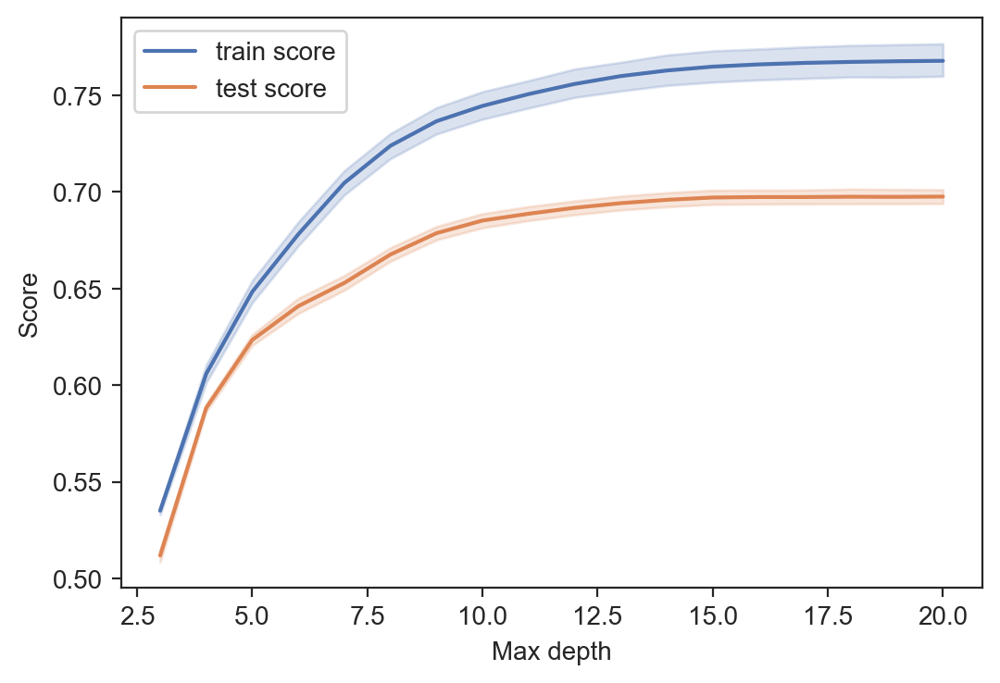

In [806]:
sns.lineplot(data=dtr_gs_df, x='param_max_depth', y='mean_train_score', label='train score')
sns.lineplot(data=dtr_gs_df, x='param_max_depth', y='mean_test_score', label='test score')
plt.xlabel('Max depth')
plt.ylabel('Score')
plt.legend()
plt.show()

As we see hyperparameter tuning eliminated overfitting. I choose max_depth = 15, min_samples_leaf = 3, min_samples_split = 22 as the best hyperparameters, because the difference between train and test scores is 0.08 that seems plausible, and the model is less complicated than the model with max_depth = 18

In [39]:
dtr_best = DecisionTreeRegressor(max_depth=15, min_samples_leaf=3, min_samples_split=22, random_state=seed)

In [40]:
dtr_best.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=15, min_samples_leaf=3, min_samples_split=22,
                      random_state=1)

In [556]:
show_scores_cv(dtr_best, X_train, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.8367,0.7526,2119.0811,2380.0189,10446.1883,12814.9412


We observe a significant improvement in the results compared with the model without hyperparameter tuning:
* Cross validated test R^2 changed from 0.7058 to 0.7526
* Cross validated test MAE changed from 2600 to 2380
* Cross validated test RMSE changed from 13786 to 12814

In [41]:
# cross validation the best model over the entire data
dtr_best_results = show_scores_cv(dtr_best, X, y)
dtr_best_results

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.8364,0.7452,2114.0852,2327.7963,10451.9501,12891.49


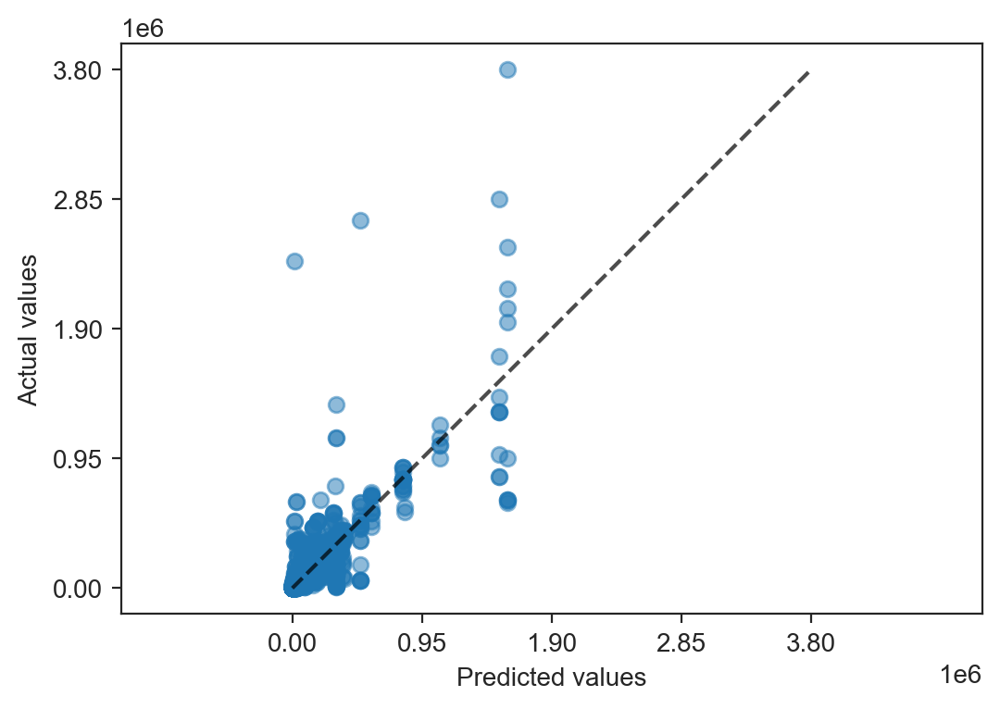

In [1257]:
PredictionErrorDisplay.from_estimator(
    dtr_best, X, y, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample=0.9999)
plt.show()

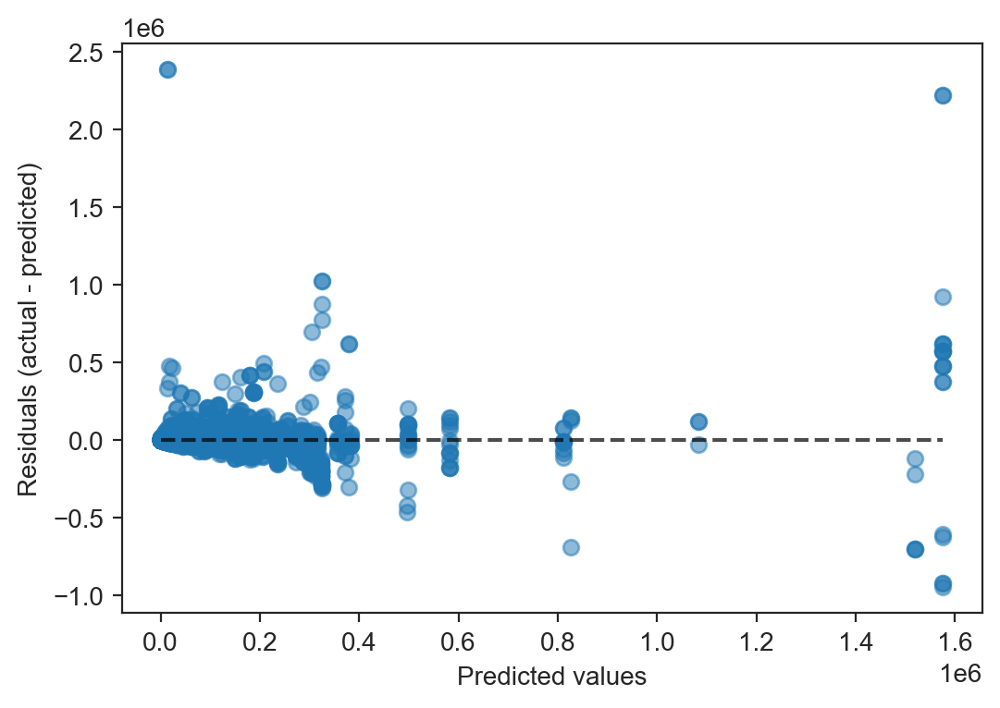

In [1258]:
PredictionErrorDisplay.from_estimator(
    dtr_best, X, y, kind="residual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample=0.9999)
plt.show()

### Decision tree - fine-grained evaluation

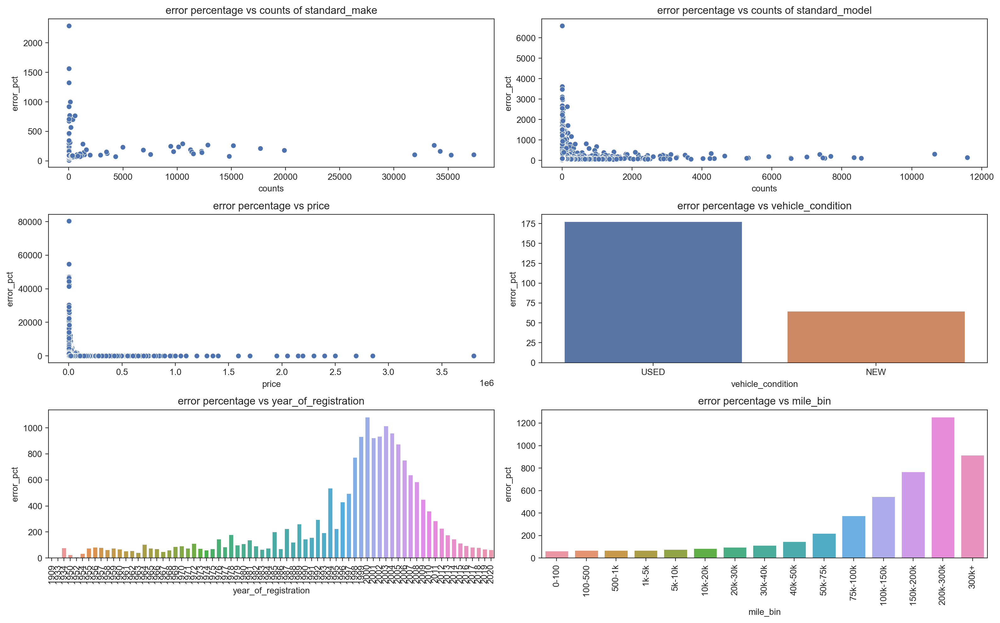

In [1554]:
fine_grain_eval(dtr_best, X, y)

In [1267]:
dtr_y_pred = pd.DataFrame(dtr_best.predict(X)).rename(columns={0: 'dtr_y_pred'})
dtr_df = pd.concat([df2, dtr_y_pred], axis=1)
dtr_df = dtr_df.drop(columns=['mile_per_year', 'mile_bin', 'standard_make_model', 'public_reference', 'reg_code', 'crossover_car_and_van', 'vehicle_condition'])
dtr_df['error_pct'] = (abs(dtr_df['price'] - dtr_df['dtr_y_pred']) / dtr_df['price'] *100).round(0)
print(dtr_df.error_pct.mean().round())
print(len(dtr_df.loc[dtr_df.error_pct>25]))
print(len(dtr_df.loc[dtr_df.error_pct>50]))

169.0
325711
247611


In [1268]:
dtr_df.loc[dtr_df.error_pct>40000]

,mileage,standard_colour,standard_make,standard_model,year_of_registration,price,body_type,fuel_type,dtr_y_pred,error_pct
496,110526.0,Blue,Citroen,Xsara Picasso,2005,990,MPV,Diesel,8.118179e+05,81902.0
17841,124000.0,Silver,SKODA,Fabia,2008,799,Hatchback,Petrol,3.826086e+05,47786.0
21232,49000.0,White,Toyota,AYGO,2012,1995,Hatchback,Petrol,1.518571e+06,76019.0
29078,69900.0,Black,Smart,Roadster,2004,3000,Convertible,Petrol,1.575879e+06,52429.0
68444,222296.0,Blue,Mercedes-Benz,E Class,2003,1995,Estate,Diesel,1.518571e+06,76019.0
75731,81000.0,White,Fiat,500,2011,2695,Hatchback,Petrol,1.575879e+06,58374.0
214118,78000.0,Black,Mitsubishi,i,2007,2000,Hatchback,Petrol,8.266633e+05,41233.0
272441,107000.0,Blue,Hyundai,i30,2009,2000,Hatchback,Diesel,1.083317e+06,54066.0


### Decision tree hyperparameter tuning - standardized data

In [53]:
# defaults: max_depth=None, min_samples_leaf=1, min_samples_split=2
# param_grid = {'max_depth': [3,4,5,6], 'min_samples_leaf': [10, 20, 30], 'min_samples_split': [10, 20, 30]}
param_grid_scaled = {'max_depth': np.linspace(3, 20, 18, dtype=int), 
                     'min_samples_leaf': np.linspace(2, 6, 5, dtype=int), 
                     'min_samples_split': np.linspace(14, 24, 6, dtype=int)}

In [54]:
dtr_scaled = DecisionTreeRegressor(random_state=seed)
dtr_gs_scaled = GridSearchCV(dtr_scaled, param_grid_scaled, return_train_score=True, cv=KFold(5, random_state=seed, shuffle=True))

In [55]:
%%time
dtr_gs_scaled_results = dtr_gs_scaled.fit(X_train_scaled_standard, y_train)

CPU times: total: 42min 21s
Wall time: 42min 24s


In [56]:
dtr_gs_scaled_df = pd.DataFrame(dtr_gs_scaled_results.cv_results_)

In [57]:
dtr_gs_scaled_df = dtr_gs_scaled_df[['param_max_depth', 'param_min_samples_leaf', 'param_min_samples_split',
    'mean_train_score', 'std_train_score',
    'mean_test_score', 'std_test_score', 'rank_test_score']].sort_values('rank_test_score')
    
dtr_gs_scaled_df.head(50)

,param_max_depth,param_min_samples_leaf,param_min_samples_split,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
484,19,2,22,0.854563,0.017894,0.766255,0.063911,1
514,20,2,22,0.854942,0.017883,0.766199,0.063928,2
454,18,2,22,0.853954,0.017865,0.766107,0.063786,3
524,20,4,18,0.838447,0.021914,0.766099,0.064127,4
513,20,2,20,0.857559,0.018471,0.766059,0.064313,5
464,18,4,18,0.837554,0.021899,0.766055,0.064026,6
424,17,2,22,0.853090,0.017834,0.766044,0.063698,7
453,18,2,20,0.856490,0.018454,0.766041,0.064171,8
483,19,2,20,0.857133,0.018475,0.766011,0.064162,9
390,16,2,14,0.867518,0.015456,0.766003,0.065374,10


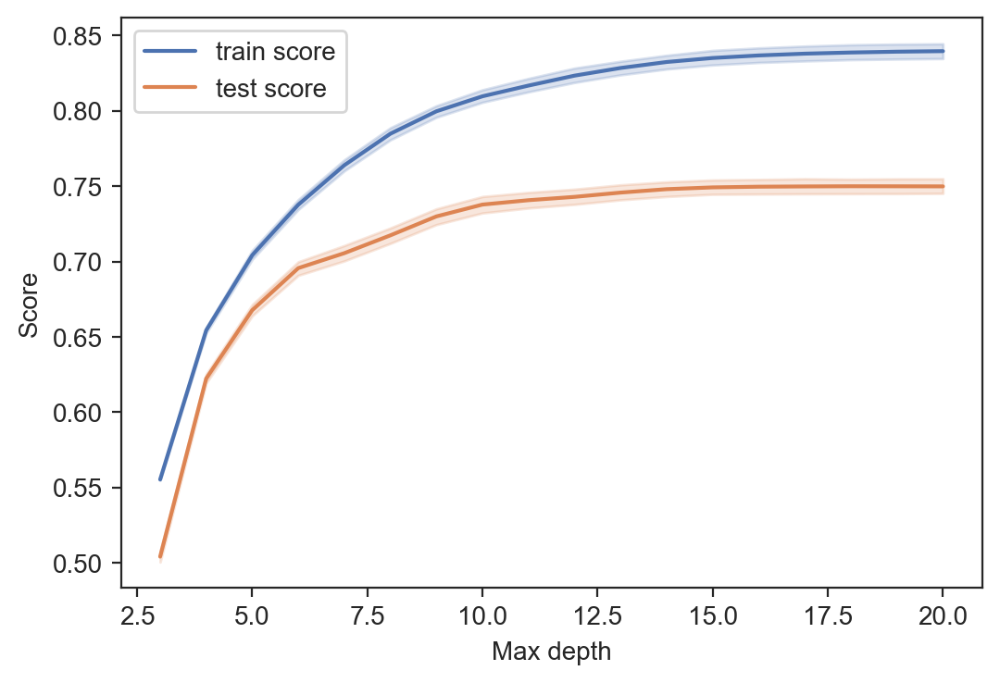

In [64]:
sns.lineplot(data=dtr_gs_scaled_df, x='param_max_depth', y='mean_train_score', label='train score')
sns.lineplot(data=dtr_gs_scaled_df, x='param_max_depth', y='mean_test_score', label='test score')
plt.xlabel('Max depth')
plt.ylabel('Score')
plt.legend()
plt.show()

As we see hyperparameter tuning eliminated overfitting. I choose max_depth = 15, min_samples_leaf = 4, min_samples_split = 18 as the best hyperparameters, because the difference between train and test scores is 0.07 that seems plausible, and the model is less complicated than the model with max_depth = 19

In [42]:
dtr_best_scaled = DecisionTreeRegressor(max_depth=15, min_samples_leaf=4, min_samples_split=18, random_state=seed)

In [43]:
dtr_best_scaled.fit(X_train_scaled_standard, y_train)

DecisionTreeRegressor(max_depth=15, min_samples_leaf=4, min_samples_split=18,
                      random_state=1)

In [561]:
show_scores_cv(dtr_best_scaled, X_train_scaled_standard, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.8339,0.7649,2108.7058,2370.2178,10535.3682,12485.732


We observe a significant improvement in the results compared with standardized model without hyperparameter tuning:
* Cross validated test R^2 changed from 0.7069 to 0.7649
* Cross validated test MAE changed from 2598 to 2370
* Cross validated test RMSE changed from 13762 to 12485

In [44]:
# cross validation the best model over the entire data
dtr_best_scaled_results = show_scores_cv(dtr_best_scaled, X_scaled_standard, y)
dtr_best_scaled_results

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.8285,0.7426,2110.5498,2333.2105,10699.9688,12987.5543


### Decision tree hyperparameter tuning - normalized data

In [39]:
# defaults: max_depth=None, min_samples_leaf=1, min_samples_split=2
# param_grid = {'max_depth': [3,4,5,6], 'min_samples_leaf': [10, 20, 30], 'min_samples_split': [10, 20, 30]}
param_grid_normal = {'max_depth': np.linspace(3, 20, 18, dtype=int), 
                     'min_samples_leaf': np.linspace(2, 6, 5, dtype=int), 
                     'min_samples_split': np.linspace(14, 28, 8, dtype=int)}

In [40]:
dtr_normal = DecisionTreeRegressor(random_state=seed)
dtr_gs_normal = GridSearchCV(dtr_normal, param_grid_normal, return_train_score=True, cv=KFold(5, random_state=seed, shuffle=True))

In [41]:
%%time
dtr_gs_normal_results = dtr_gs_normal.fit(X_train_scaled_normal, y_train)

CPU times: total: 53min 14s
Wall time: 53min 16s


In [50]:
dtr_gs_normal_df = pd.DataFrame(dtr_gs_normal_results.cv_results_)

In [51]:
dtr_gs_normal_df = dtr_gs_normal_df[['param_max_depth', 'param_min_samples_leaf', 'param_min_samples_split',
    'mean_train_score', 'std_train_score',
    'mean_test_score', 'std_test_score', 'rank_test_score']].sort_values('rank_test_score')
    
dtr_gs_normal_df.head(20)

,param_max_depth,param_min_samples_leaf,param_min_samples_split,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
698,20,4,18,0.838447,0.021914,0.767814,0.064777,1
618,18,4,18,0.837554,0.021899,0.767770,0.064671,2
699,20,4,20,0.833774,0.021604,0.767706,0.065045,3
658,19,4,18,0.838100,0.021924,0.767693,0.064691,4
619,18,4,20,0.832930,0.021578,0.767675,0.064965,5
659,19,4,20,0.833450,0.021607,0.767665,0.064974,6
578,17,4,18,0.836779,0.021895,0.767635,0.064639,7
579,17,4,20,0.832203,0.021552,0.767570,0.064935,8
644,19,2,22,0.854563,0.017894,0.767300,0.064647,9
660,19,4,22,0.831424,0.021474,0.767295,0.064651,10


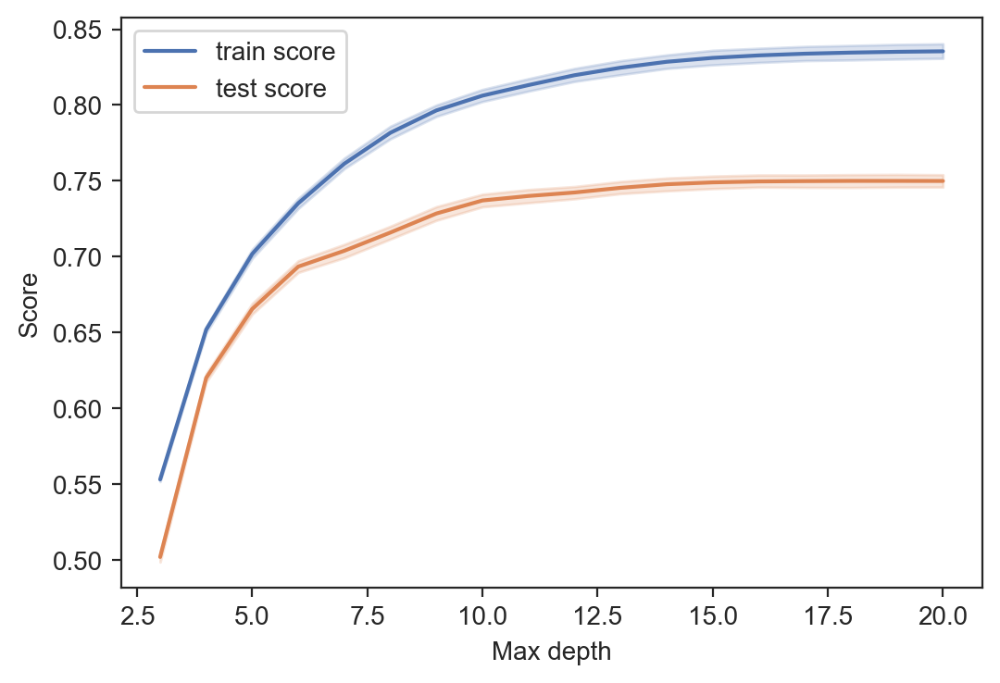

In [52]:
sns.lineplot(data=dtr_gs_normal_df, x='param_max_depth', y='mean_train_score', label='train score')
sns.lineplot(data=dtr_gs_normal_df, x='param_max_depth', y='mean_test_score', label='test score')
plt.xlabel('Max depth')
plt.ylabel('Score')
plt.legend()
plt.show()

As we see hyperparameter tuning eliminated overfitting. I choose max_depth = 16, min_samples_leaf = 4, min_samples_split = 20 as the best hyperparameters, because the difference between train and test scores is 0.06 that seems plausible, and the model is less complicated than the model with max_depth = 20

In [45]:
dtr_best_normal = DecisionTreeRegressor(max_depth=16, min_samples_leaf=4, min_samples_split=20, random_state=seed)

In [46]:
dtr_best_normal.fit(X_train_scaled_normal, y_train)

DecisionTreeRegressor(max_depth=16, min_samples_leaf=4, min_samples_split=20,
                      random_state=1)

In [578]:
show_scores_cv(dtr_best_normal, X_train_scaled_normal, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.8311,0.7673,2030.1905,2325.0848,10624.7568,12423.0563


We observe a significant improvement in the results compared with standardized model without hyperparameter tuning:
* Cross validated test R^2 changed from 0.7058 to 0.7673
* Cross validated test MAE changed from 2601 to 2325
* Cross validated test RMSE changed from 13787 to 12423

In [47]:
# cross validation the best model over the entire data
dtr_best_normal_results = show_scores_cv(dtr_best_normal, X_scaled_normal, y)
dtr_best_normal_results

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Score,0.8291,0.7418,2024.1948,2279.088,10681.8803,13006.4771


In [48]:
pd.concat([dtr_best_results.rename(index={'Score': 'Original'}), 
           dtr_best_scaled_results.rename(index={'Score': 'Standardized'}),
           dtr_best_normal_results.rename(index={'Score': 'Normalized'})], axis=0)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Original,0.8364,0.7452,2114.0852,2327.7963,10451.9501,12891.4900
Standardized,0.8285,0.7426,2110.5498,2333.2105,10699.9688,12987.5543
Normalized,0.8291,0.7418,2024.1948,2279.0880,10681.8803,13006.4771


As illustrated in the above dataframe, standardizing or normalizing data has caused no significant difference in the performance of decision tree model.

So I choose the original model (without standardization or normalization) with hyperparameters max_depth = 15, min_samples_leaf = 3, min_samples_split = 22 as the best decision tree model, as it is simpler and its tuning and evaluation takes less time than the standardized and normalized models.

### Decision tree feature importance

In [756]:
coef_dtr = pd.DataFrame(dtr_best.feature_importances_, X_train.columns).reset_index() \
        .rename(columns={'index': 'feature', 0: 'coef'}).sort_values('coef', ascending=False)
coef_dtr

,feature,coef
2,standard_model,0.752022
8,year_of_registration,0.087063
7,mileage,0.079310
1,standard_make,0.072363
4,body_type,0.004395
6,fuel_type,0.003484
3,vehicle_condition,0.000603
0,standard_colour,0.000567
5,crossover_car_and_van,0.000192


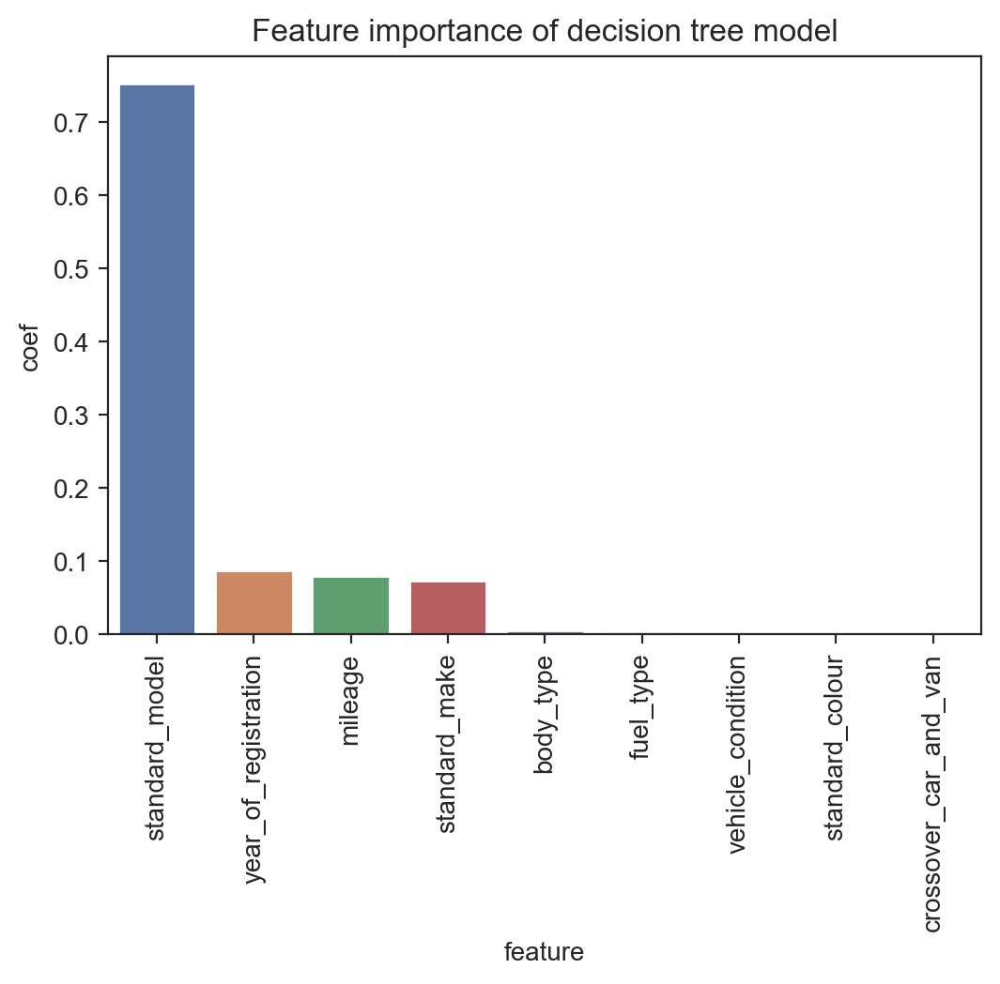

In [757]:
plot = sns.barplot(data=coef_dtr, x='feature', y='coef')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('Feature importance of decision tree model')
plt.show()

### Linear regression - normal and scaled data

In [49]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [610]:
show_scores(lr, X_train, y_train)

,Training R^2,Test R^2,Training MAE,Test MAE,Training RMSE,Test RMSE
Score,0.5878,0.542,4805.6561,4798.3494,16622.432,17456.9587


In [611]:
# evaluation over training data
fit_eval(lr, X_train, X_train_scaled_standard, X_train_scaled_normal, y_train)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Original,0.5882,0.5917,4806.3754,4807.0628,16610.0467,16463.0653
Standardized,0.5882,0.5917,4806.3754,4807.0628,16610.0467,16463.0653
Normalized,0.5882,0.5917,4806.3754,4807.0628,16610.0467,16463.0653


In [51]:
# cross validation over the entire data
lr_results = show_scores_cv(lr, X, y)

In [50]:
# evaluation over the entire data
fit_eval(lr, X, X_scaled_standard, X_scaled_normal, y)

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
Original,0.5772,0.5839,4843.7626,4845.0987,16814.6535,16619.5366
Standardized,0.5772,0.5839,4843.7626,4845.0987,16814.6535,16619.5366
Normalized,0.5772,0.5839,4843.7626,4845.0987,16814.6535,16619.5366


The results show that scaling has no effect on linear regression model. In addition comparison of training and test scores shows a little underfitting of the model; however, linear regression does not support hyperparameter tuning to eliminate underfitting. Overall, performance of linear regression model is much worse than knnr and decision tree models.

### Linear regression feature importance 

In [758]:
coef_lr = pd.DataFrame(lr.coef_, X_train.columns).reset_index() \
        .rename(columns={'index': 'feature', 0: 'coef'}).sort_values('coef', ascending=False)
coef_lr

,feature,coef
8,year_of_registration,198.159358
2,standard_model,1.009706
3,vehicle_condition,0.368311
6,fuel_type,0.227091
1,standard_make,0.138026
0,standard_colour,0.055899
5,crossover_car_and_van,-0.034046
4,body_type,-0.049799
7,mileage,-0.118073


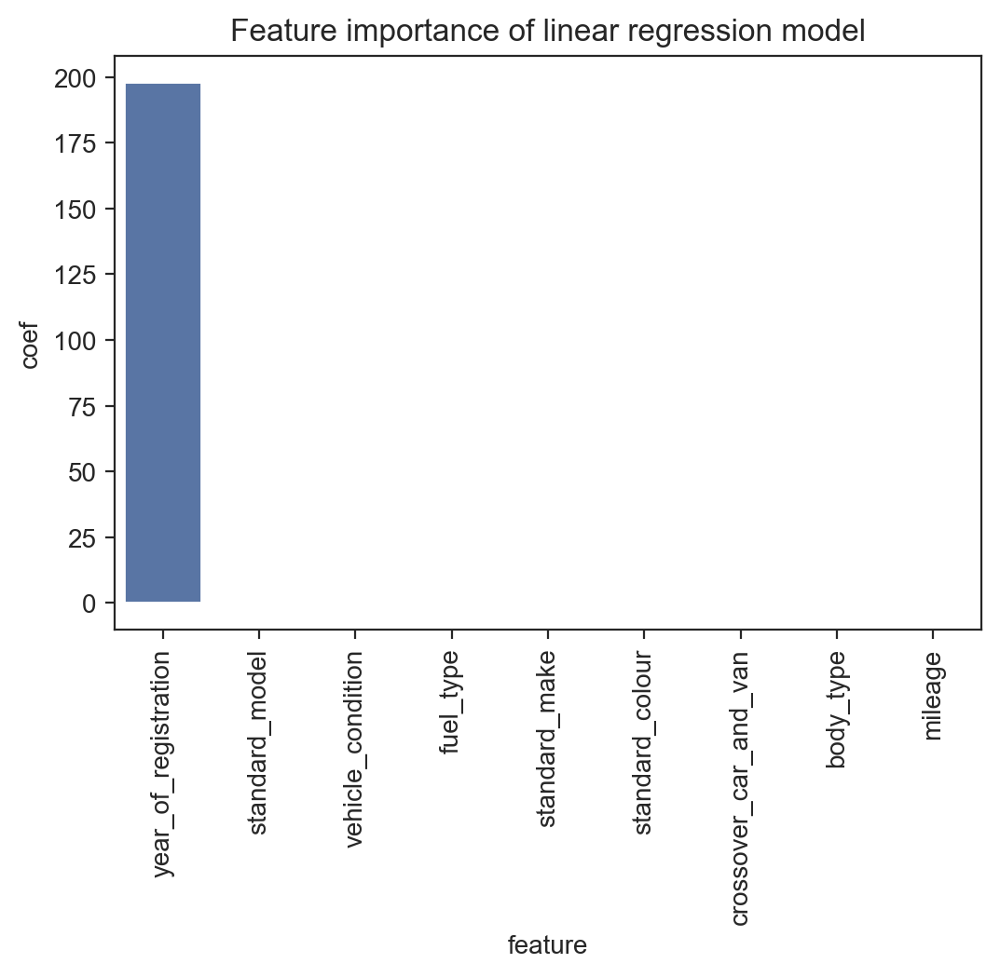

In [759]:
plot = sns.barplot(data=coef_lr, x='feature', y='coef')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.title('Feature importance of linear regression model')
plt.show()

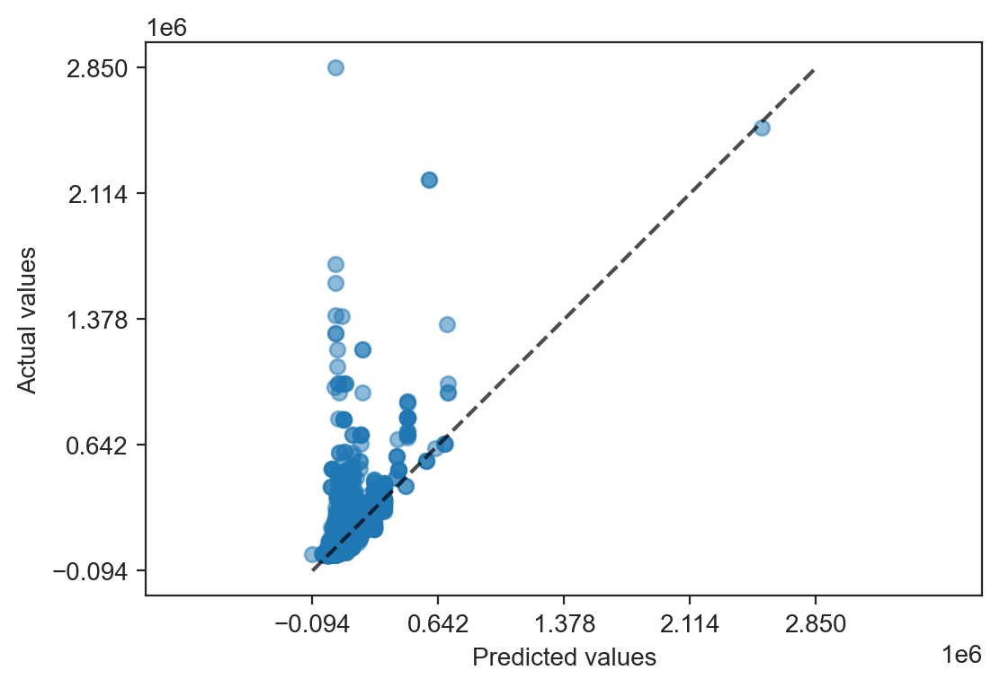

In [1263]:
PredictionErrorDisplay.from_estimator(
    lr, X, y, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample=0.9999)
plt.show()

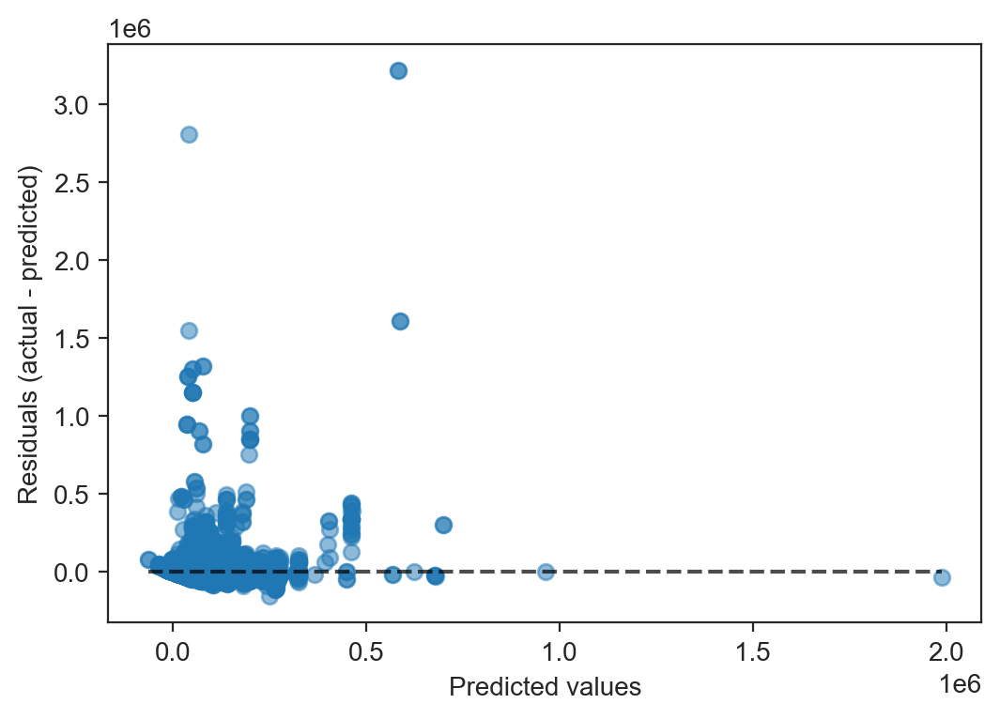

In [1264]:
PredictionErrorDisplay.from_estimator(
    lr, X, y, kind="residual_vs_predicted", scatter_kwargs=dict(alpha=0.5), subsample=0.9999)
plt.show()

### Linear regression - fine-grained evaluation

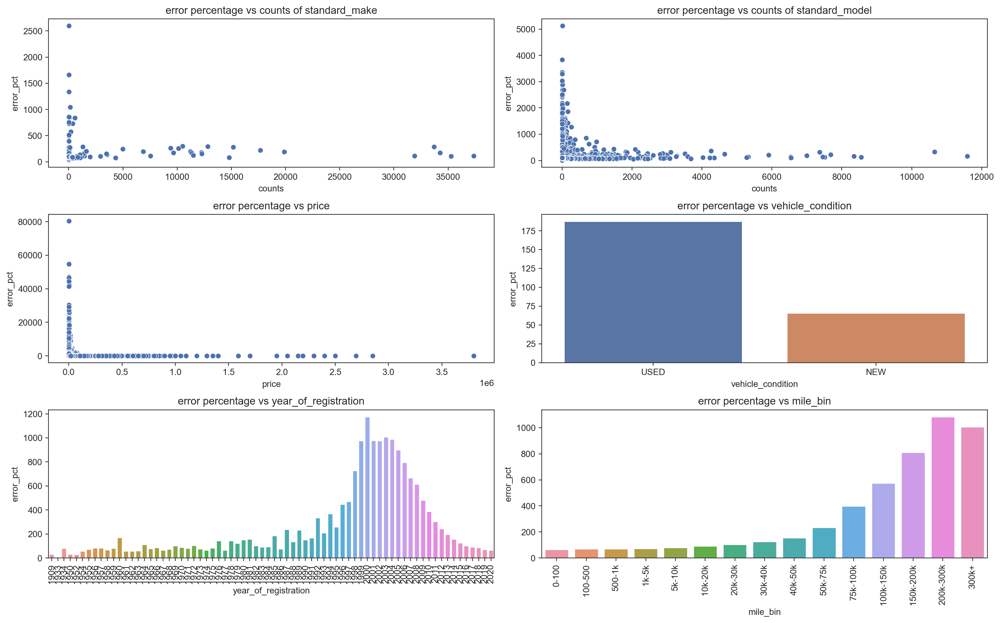

In [1553]:
fine_grain_eval(lr, X, y)

## Comparison of knnr, decision tree and linear regression

In this section I compare the performance of the best models of knnr, decision tree and linear regression.

In [53]:
knn_dt_lr_comp = pd.concat([knnr_best_scaled_results.rename(index={'Score': 'knnr'}), 
           dtr_best_results.rename(index={'Score': 'Decision tree'}),
           lr_results.rename(index={'Score': 'Linear regression'})], axis=0)
knn_dt_lr_comp

,Cross Val Training R^2,Cross Val Test R^2,Cross Val Training MAE,Cross Val Test MAE,Cross Val Training RMSE,Cross Val Test RMSE
knnr,0.8130,0.7445,2015.6271,2408.5326,11179.0674,12985.8705
Decision tree,0.8364,0.7452,2114.0852,2327.7963,10451.9501,12891.4900
Linear regression,0.5772,0.5839,4843.7626,4845.0987,16814.6535,16619.5366


As demonstrated in the above table, knnr and decision tree performances are close to each other and by far better than linear regression performance. However, decision tree results are a little better than knnr in terms of MAE and RMSE.

So I choose decision tree as the best model of this project.

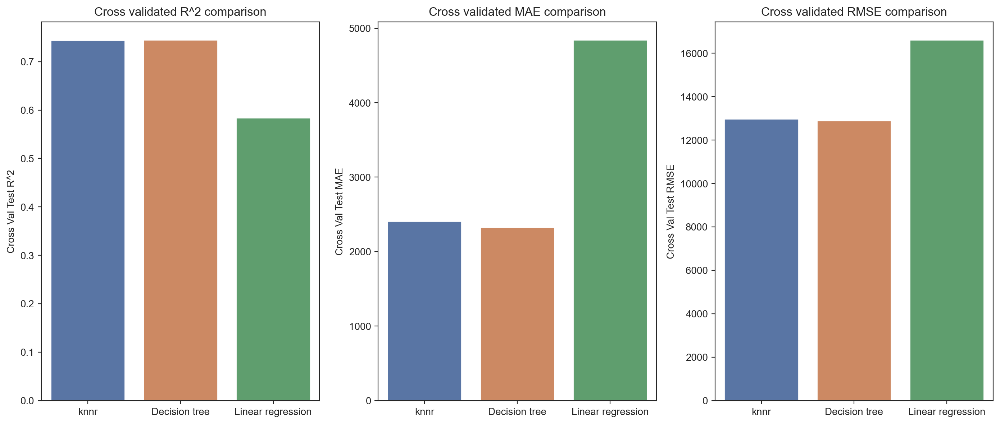

In [62]:
plt.figure(figsize=(14,6))

plt.subplot(1,3,1)
sns.barplot(data=knn_dt_lr_comp, x=knn_dt_lr_comp.index, y='Cross Val Test R^2')
plt.title("Cross validated R^2 comparison")

plt.subplot(1,3,2)
sns.barplot(data=knn_dt_lr_comp, x=knn_dt_lr_comp.index, y='Cross Val Test MAE')
plt.title("Cross validated MAE comparison")

plt.subplot(1,3,3)
sns.barplot(data=knn_dt_lr_comp, x=knn_dt_lr_comp.index, y='Cross Val Test RMSE')
plt.title("Cross validated RMSE comparison")

plt.tight_layout()
plt.show()